In [1]:
import re
import math
import pickle
import requests
import warnings
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sb
from time import time
import IPython.display as Disp
from wordcloud import WordCloud
from pylatexenc.latex2text import LatexNodes2Text
from sklearn.metrics.pairwise import cosine_similarity
from gensim import corpora, models, similarities
from sklearn.feature_extraction.text import TfidfVectorizer, ENGLISH_STOP_WORDS
from sklearn.neighbors import NearestNeighbors
from sklearn.decomposition import PCA
from sklearn.metrics import mean_squared_error
from underthesea import word_tokenize
from operator import itemgetter
warnings.filterwarnings('ignore')
pd.set_option('display.max_colwidth', None)
sb.set_theme()

In [6]:
df_org = pd.read_csv('2k_cleaned.csv')
df = df_org.copy()
df = df.iloc[:, 1:]
df.shape

(1950, 8)

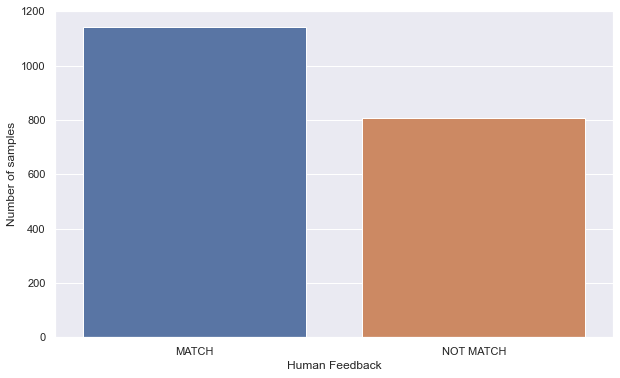

In [10]:
human_fb = pd.DataFrame(df.groupby('Human Feedback')['Feedback ID'].count()).reset_index()

plt.figure(figsize=(10, 6))
sb.barplot(data = human_fb, x = 'Human Feedback', y = 'Feedback ID')
plt.ylabel('Number of samples');

In [134]:
human_fb

,Human Feedback,Feedback ID
0,MATCH,1143
1,NOT MATCH,807


In [14]:
def clean_function(text):  
    #lowercase
    text = text.lower()
    
#     #xoá ký tự đặc biệt, ký tự không phải alphanumeric 
#     text = re.sub("[^a-z0-9àáạảãâầấậẩẫăằắặẳẵèéẹẻẽêềếệểễòóọỏõôồốộổỗơờớợởỡìíịỉĩùúụủũưừứựửữỳýỵỷỹđ]",' ', text)
    text = re.sub("[\àáạảãâầấậẩẫăằắặẳẵèéẹẻẽêềếệểễòóọỏõôồốộổỗơờớợởỡìíịỉĩùúụủũưừứựửữỳýỵỷỹđ]",'', text)    
#     #xoá leading zero
#     text = [e.lstrip('0') for e in text.split(' ')]
#     text = (' ').join(text)
    
    #replace extra spaces with single space
    text = re.sub(' +',' ',text)
    
    #xoá khoảng trắng ở đầu và cuối mỗi câu
    text = text.strip()
    
    #word tokenzie
    text = word_tokenize(text, format='text')
    return text

In [15]:
df['clean_lookup'] = df['Lookup Text'].map(lambda x: clean_function(x))
df['clean_question'] = df['Question Text'].map(lambda x: clean_function(x))

df['char_count_lookup'] = df['clean_lookup'].str.len()
df['word_count_lookup'] = df['clean_lookup'].str.split().str.len()
df['average_word_length_lookup'] = df['char_count_lookup'] / df['word_count_lookup']

df['char_count_question'] = df['clean_question'].str.len()
df['word_count_question'] = df['clean_question'].str.split().str.len()
df['average_word_length_question'] = df['char_count_question'] / df['word_count_question']

In [16]:
with open('vietnamese-stopwords.txt', 'r', encoding='utf-8') as file:
    vn_stop_words = file.read()
vn_stop_words = vn_stop_words.split('\n') 

# combine Vietnamese stopwords and English stopwords
stop_words = ENGLISH_STOP_WORDS.union(vn_stop_words)

In [17]:
tf_question = TfidfVectorizer(analyzer = 'word', stop_words = stop_words, min_df=0)
tfidf_question = tf_question.fit_transform(df['clean_question'])
tfidf_question = pd.DataFrame(tfidf_question.toarray(),
                            columns = tf_question.get_feature_names())
tfidf_question.shape

(1950, 3627)

In [36]:
def cosine_search_all_new(queries, tf, tfidf_matrix, data, top_result = 5, check_time = True):
    t0 = time()
    results = []
    for i in range(0, len(queries)):
        query = clean_function(queries[i])
        query_tf = tf.transform([query])
        query_tf = pd.DataFrame(query_tf.toarray(),
                                columns = tf.get_feature_names())
        cosine_sim = cosine_similarity(query_tf, tfidf_matrix.iloc[[i]]).flatten()
        results.append(cosine_sim[0])
    times = time() - t0
    if check_time:
        if times < 60:
            print('Cosine search took {:.2f}s.'.format(times))
        else:
            print('Cosine search took {:.2f} minutes.'.format(times / 60))
    return results

In [19]:
cosine_score1 = cosine_search_all_new(df['Lookup Text'].values, tf_question, tfidf_question, df)
cosine_score2 = cosine_search_all_new(df['clean_lookup'].values, tf_question, tfidf_question, df)

Cosine search took 16.14s.
Cosine search took 18.13s.


In [20]:
df['cosine_score1'] = cosine_score1
df['cosine_score2'] = cosine_score2

In [63]:
mask1 = df['Human Feedback'] == 'NOT MATCH'
mask2 = df['Human Feedback'] == 'MATCH'

df_neg = df[mask1]
df_pos = df[mask2]

print(df_neg.shape)
print(df_pos.shape)

(807, 27)
(1143, 27)


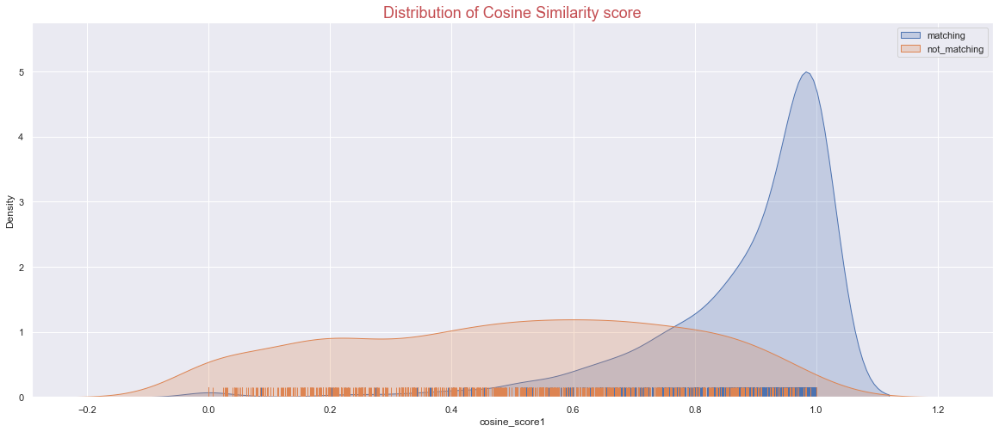

In [22]:
sb.set_theme()
plt.figure(figsize=(20, 8))
sb.distplot(df_pos.cosine_score1, hist = False, rug = True, kde_kws={'shade':'kde_kws'},label = 'matching')
sb.distplot(df_neg.cosine_score1, hist = False, rug = True, kde_kws={'shade':'kde_kws'},label = 'not_matching')
plt.legend()
plt.title('Distribution of Cosine Similarity score', fontsize = 18, color = 'r');

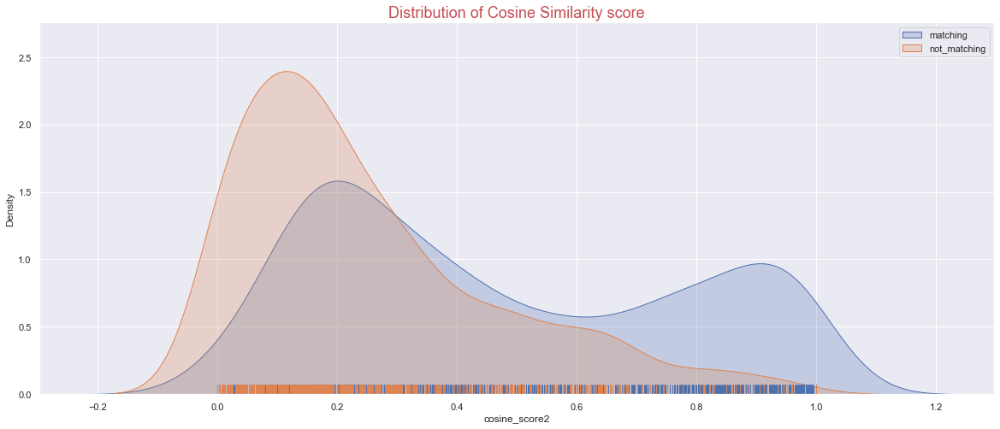

In [123]:
sb.set_theme()
plt.figure(figsize=(20, 8))
sb.distplot(df_pos.cosine_score2, hist = False, rug = True, kde_kws={'shade':'kde_kws'},label = 'matching')
sb.distplot(df_neg.cosine_score2, hist = False, rug = True, kde_kws={'shade':'kde_kws'},label = 'not_matching')
plt.legend()
plt.title('Distribution of Cosine Similarity score', fontsize = 18, color = 'r');

In [24]:
def jaccard_search(query_matrix, source_matrix, check_time = True):
    
    t0=time()
    results = []
       
    for q1, q2 in zip(query_matrix, source_matrix):
        words_doc1 = set(q1.lower().split()) 
        words_doc2 = set(q2.lower().split())

        # Find the intersection of words list of doc1 & doc2
        intersection = words_doc1.intersection(words_doc2)

        # Find the union of words list of doc1 & doc2
        union = words_doc1.union(words_doc2)

        # Calculate Jaccard similarity score 
        # using length of intersectioEm n set divided by length of union set
        jaccard_score = len(intersection) / len(union)
        results.append(jaccard_score)
    times = time() - t0
    if check_time:
        if times < 60:
            print('Jaccard search took {:.2f}s.'.format(times))
        else:
            print('Jaccard search took {:.2f} minutes.'.format(times / 60))
    return results

In [25]:
jc_score = jaccard_search(df['clean_lookup'].values, df['clean_question'].values)

Jaccard search took 0.06s.


In [26]:
df['jc_score'] = jc_score

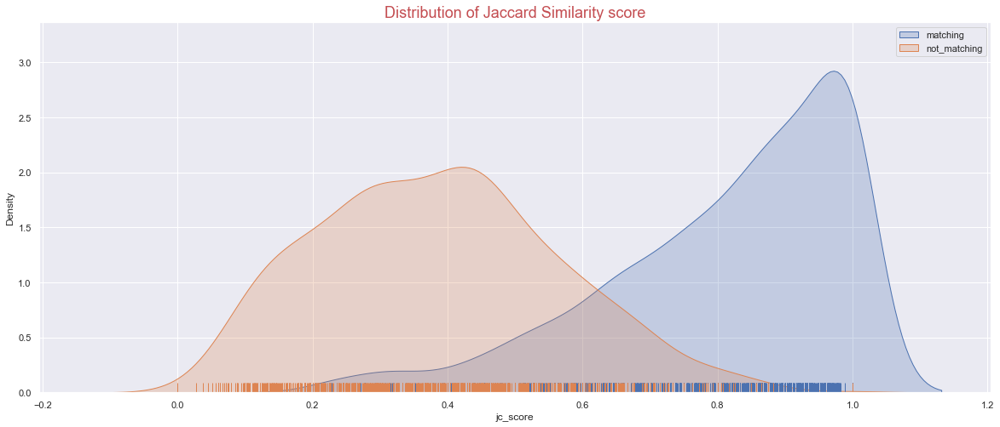

In [28]:
plt.figure(figsize=(20, 8))
sb.distplot(df_pos.jc_score, hist = False, rug = True, kde_kws={'shade':'kde_kws'},label = 'matching')
sb.distplot(df_neg.jc_score, hist = False, rug = True, kde_kws={'shade':'kde_kws'},label = 'not_matching')
plt.legend()
plt.title('Distribution of Jaccard Similarity score', fontsize = 18, color = 'r');

In [31]:
df['lookup_plain'] = df['Lookup Text'].map(lambda x: LatexNodes2Text().latex_to_text(x))
df['question_plain'] = df['Question Text'].map(lambda x: LatexNodes2Text().latex_to_text(x))

In [33]:
tf_question1 = TfidfVectorizer(analyzer = 'word', stop_words = stop_words, min_df=0)
tfidf_question1 = tf_question1.fit_transform(df['question_plain'])
tfidf_question1 = pd.DataFrame(tfidf_question1.toarray(),
                               columns = tf_question1.get_feature_names())
tfidf_question1.shape

(1950, 4793)

In [38]:
def cosine_search_all_plain(queries, tf, tfidf_matrix, data, top_result = 5, check_time = True):
    t0 = time()
    results = []
    for i in range(0, len(queries)):
        query = queries[i]
        query_tf = tf.transform([query])
        query_tf = pd.DataFrame(query_tf.toarray(),
                                columns = tf.get_feature_names())
        cosine_sim = cosine_similarity(query_tf, tfidf_matrix.iloc[[i]]).flatten()
        results.append(cosine_sim[0])
    times = time() - t0
    if check_time:
        if times < 60:
            print('Cosine search took {:.2f}s.'.format(times))
        else:
            print('Cosine search took {:.2f} minutes.'.format(times / 60))
    return results

In [39]:
cosine_plain = cosine_search_all_plain(df['lookup_plain'].values, tf_question1, tfidf_question1, df)

Cosine search took 5.22s.


In [40]:
df['cosine_plain'] = cosine_plain

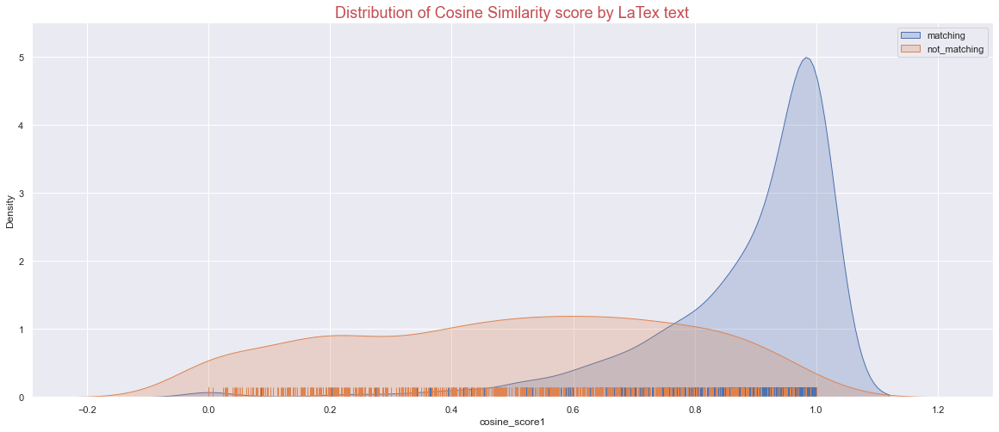

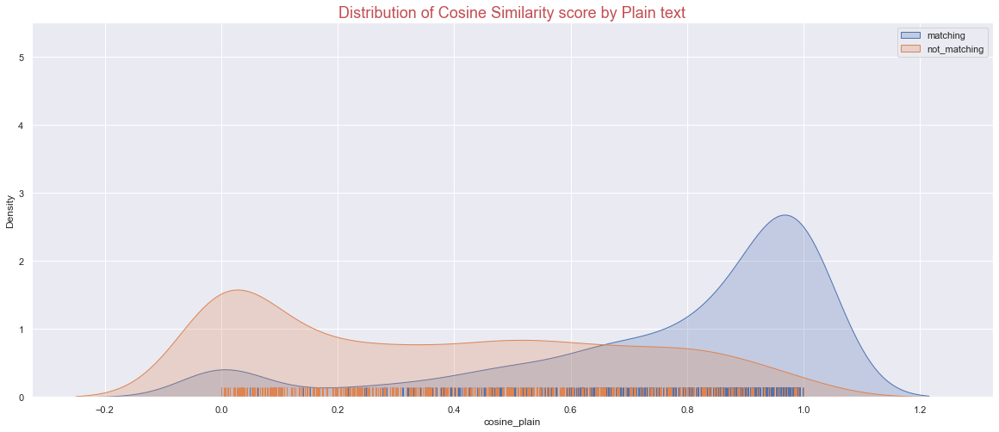

In [47]:
plt.figure(figsize=(20, 8))
sb.distplot(df_pos.cosine_score1, hist = False, rug = True, kde_kws={'shade':'kde_kws'},label = 'matching')
sb.distplot(df_neg.cosine_score1, hist = False, rug = True, kde_kws={'shade':'kde_kws'},label = 'not_matching')
plt.legend()
plt.ylim([0, 5.5])
plt.title('Distribution of Cosine Similarity score by LaTex text', fontsize = 18, color = 'r')
plt.figure(figsize=(20, 8))
sb.distplot(df_pos.cosine_plain, hist = False, rug = True, kde_kws={'shade':'kde_kws'},label = 'matching')
sb.distplot(df_neg.cosine_plain, hist = False, rug = True, kde_kws={'shade':'kde_kws'},label = 'not_matching')
plt.legend()
plt.ylim([0, 5.5])
plt.title('Distribution of Cosine Similarity score by Plain text', fontsize = 18, color = 'r');

In [46]:
df['clean_lookup2'] = df['lookup_plain'].map(lambda x: clean_function(x))
df['clean_question2'] = df['question_plain'].map(lambda x: clean_function(x))

In [48]:
tf_question2 = TfidfVectorizer(analyzer = 'word', stop_words = stop_words, min_df=0)
tfidf_question2 = tf_question2.fit_transform(df['clean_question2'])
tfidf_question2 = pd.DataFrame(tfidf_question2.toarray(),
                               columns = tf_question2.get_feature_names())
tfidf_question2.shape

(1950, 3711)

In [100]:
sums_weight = tfidf_question2.sum().sort_values(ascending = False)
sums_weight.head(20)

_2     85.927811
ca     84.927214
cc     80.123134
sin    63.616085
ng     63.452550
thc    62.035102
10     61.934622
cu     61.773958
y_     59.130316
bi     55.644440
gi     54.682264
a_     53.916582
_b     52.799548
tr     52.664554
tp     52.637066
cos    51.869497
tnh    50.181280
_a     49.532147
hnh    49.074733
mt     48.742663
dtype: float64

In [49]:
cosine_plain2 = cosine_search_all_new(df['lookup_plain'].values, tf_question2, tfidf_question2, df)

Cosine search took 12.13s.


In [50]:
df['cosine_plain2'] = cosine_plain2

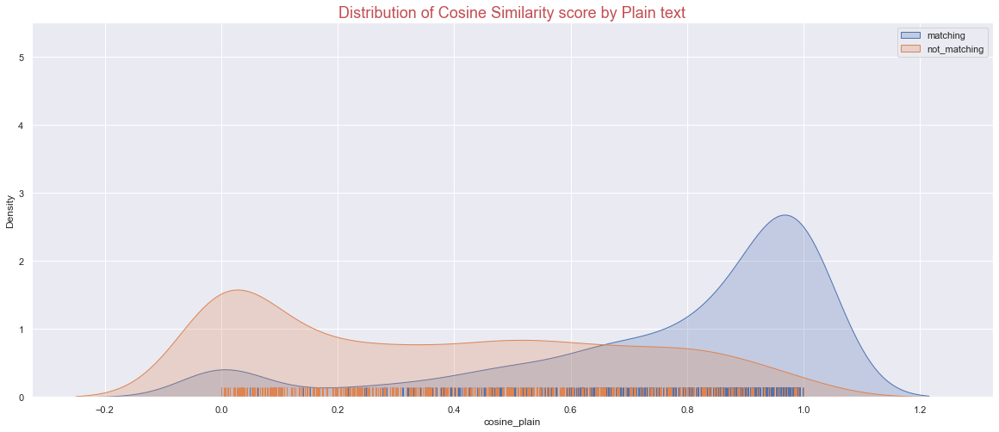

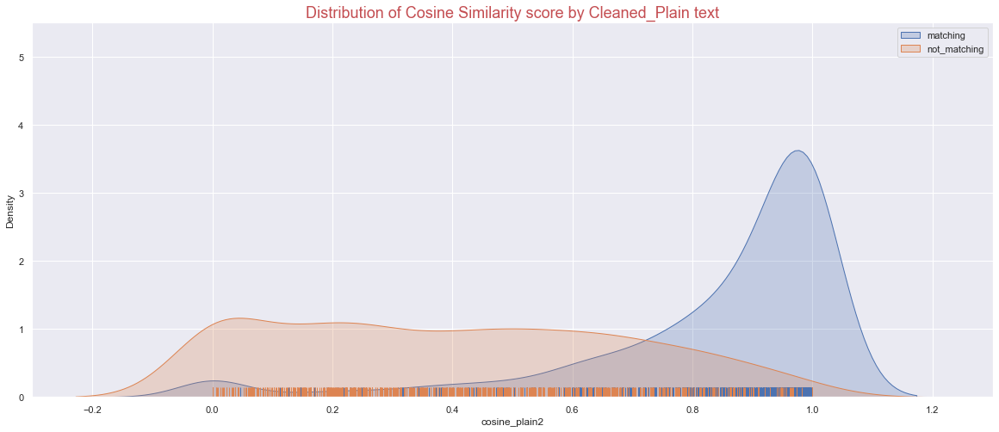

In [55]:
plt.figure(figsize=(20, 8))
sb.distplot(df_pos.cosine_plain, hist = False, rug = True, kde_kws={'shade':'kde_kws'},label = 'matching')
sb.distplot(df_neg.cosine_plain, hist = False, rug = True, kde_kws={'shade':'kde_kws'},label = 'not_matching')
plt.legend()
plt.ylim([0, 5.5])
plt.title('Distribution of Cosine Similarity score by Plain text', fontsize = 18, color = 'r')
plt.figure(figsize=(20, 8))
sb.distplot(df_pos.cosine_plain2, hist = False, rug = True, kde_kws={'shade':'kde_kws'},label = 'matching')
sb.distplot(df_neg.cosine_plain2, hist = False, rug = True, kde_kws={'shade':'kde_kws'},label = 'not_matching')
plt.legend()
plt.ylim([0, 5.5])
plt.title('Distribution of Cosine Similarity score by Cleaned_Plain text', fontsize = 18, color = 'r');

In [58]:
df_check = df_pos.loc[df_pos['cosine_plain2'] <= 0.2]
df_check = df_check.sort_values('cosine_plain2', ascending = False)
df_check.shape

(49, 25)

INDEX: 68 - Cosine score: 0.1927714008388833
-- Number of lookup_words: 65


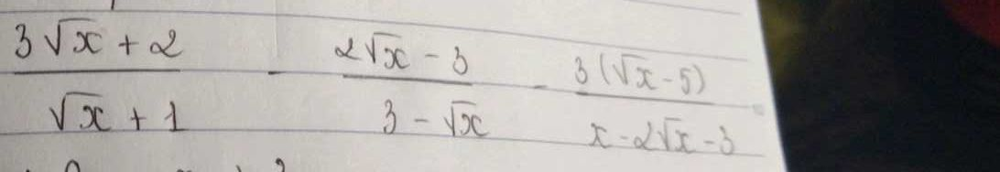

-- Number of question_words: 120


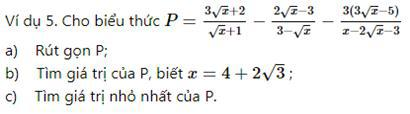

************

INDEX: 451 - Cosine score: 0.1902749837916131
-- Number of lookup_words: 22


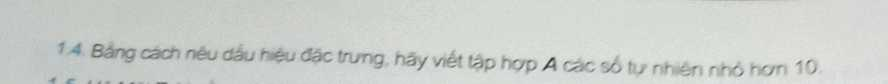

-- Number of question_words: 26


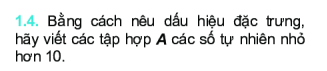

************

INDEX: 1131 - Cosine score: 0.18545385278652338
-- Number of lookup_words: 42


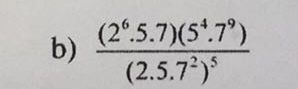

-- Number of question_words: 134


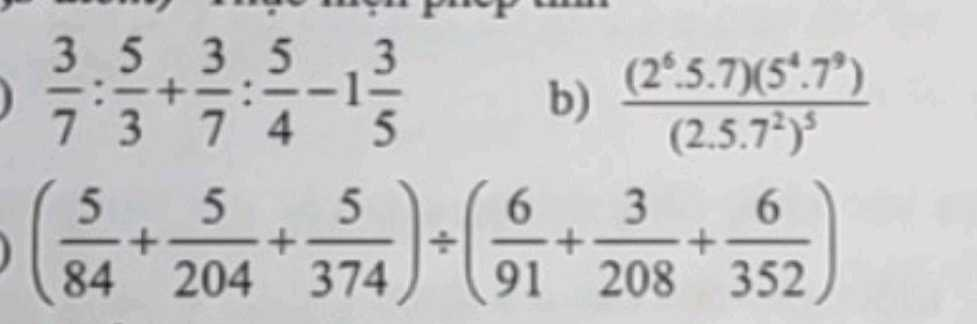

************

INDEX: 719 - Cosine score: 0.17049418604646183
-- Number of lookup_words: 21


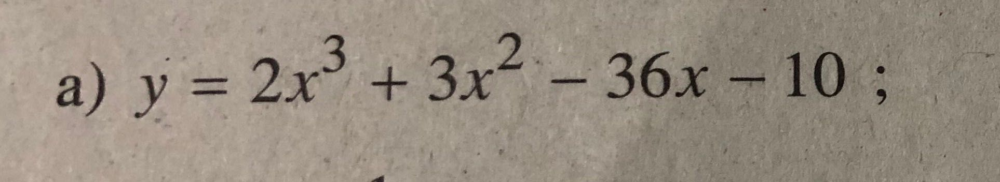

-- Number of question_words: 118


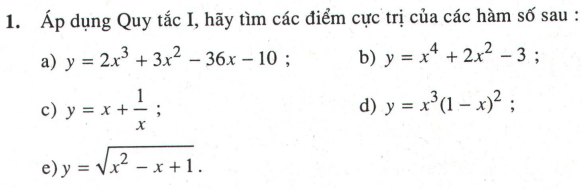

************

INDEX: 856 - Cosine score: 0.14718991867496523
-- Number of lookup_words: 129


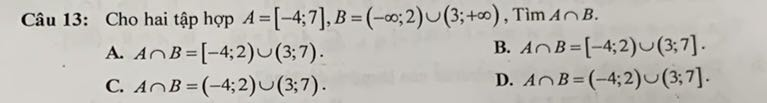

-- Number of question_words: 117


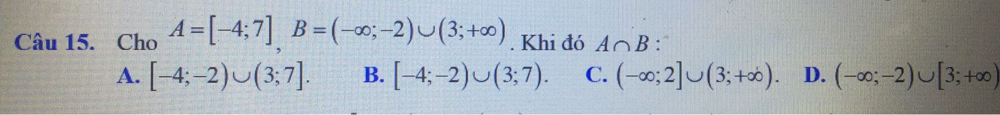

************

INDEX: 437 - Cosine score: 0.1470832640207021
-- Number of lookup_words: 153


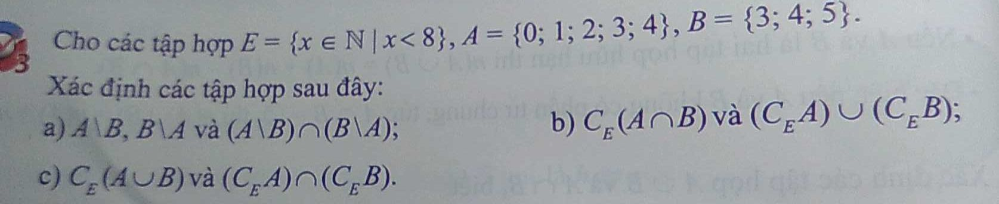

-- Number of question_words: 152


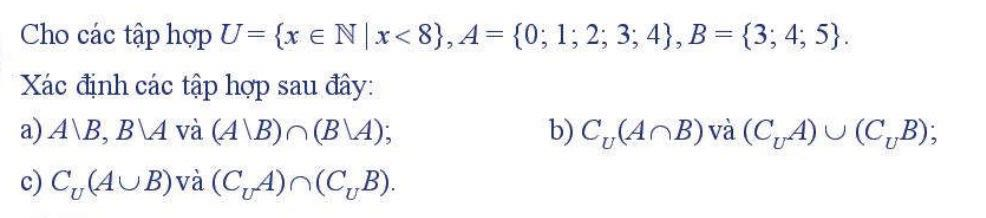

************

INDEX: 1503 - Cosine score: 0.1269888610447272
-- Number of lookup_words: 91


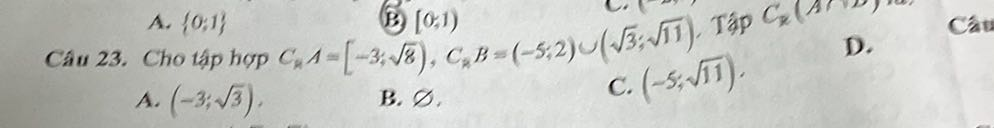

-- Number of question_words: 132


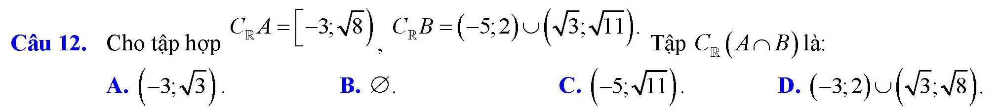

************

INDEX: 897 - Cosine score: 0.11733896187897672
-- Number of lookup_words: 62


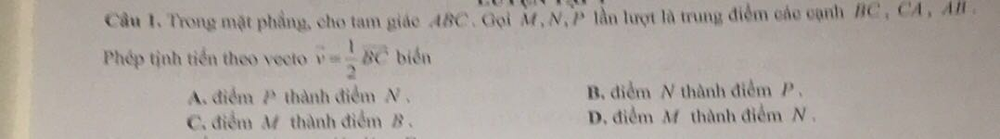

-- Number of question_words: 121


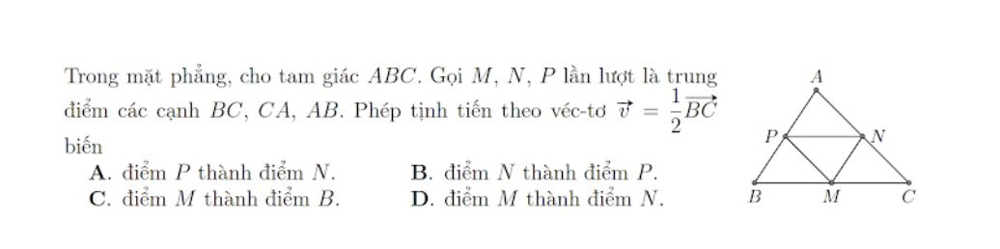

************

INDEX: 379 - Cosine score: 0.11212531879462864
-- Number of lookup_words: 45


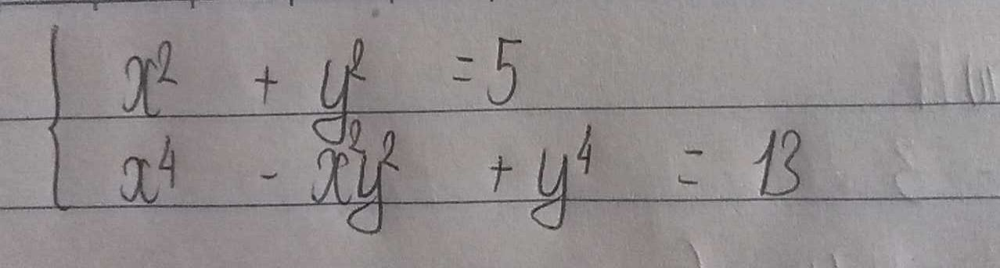

-- Number of question_words: 299


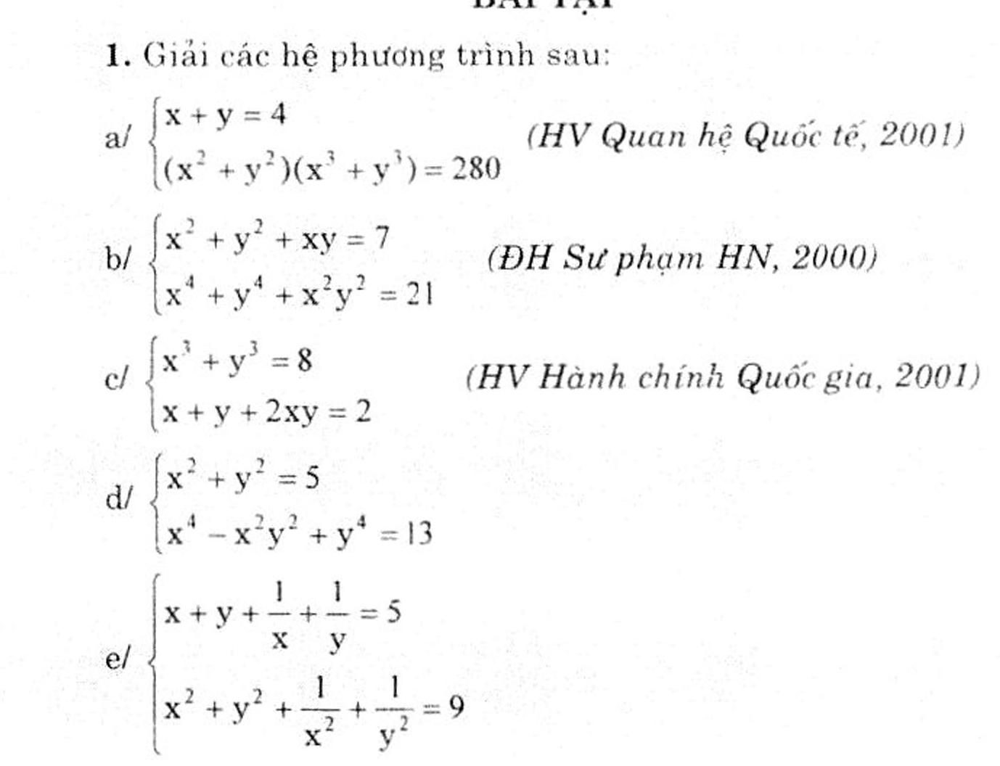

************

INDEX: 438 - Cosine score: 0.0460699457855799
-- Number of lookup_words: 77


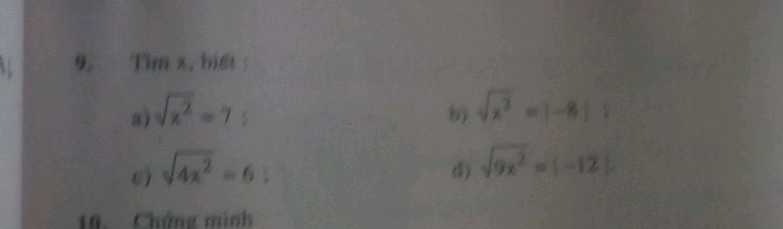

-- Number of question_words: 220


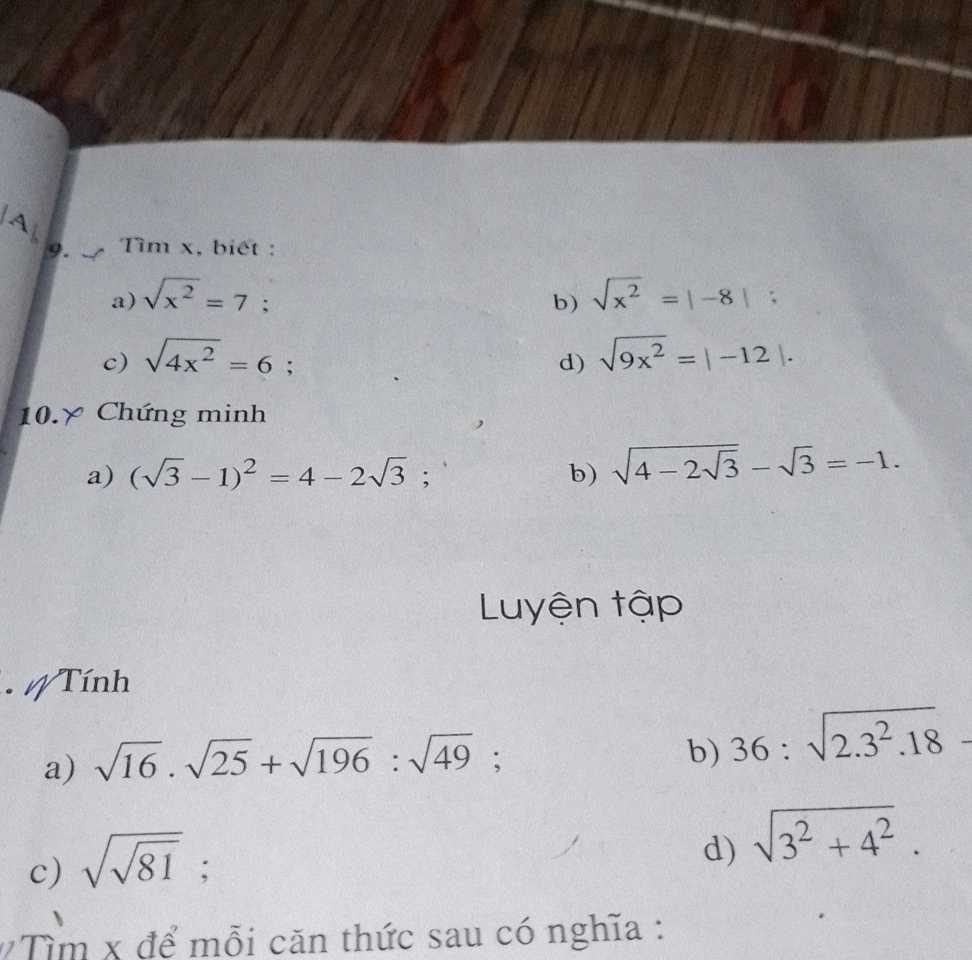

************

INDEX: 1806 - Cosine score: 0.0
-- Number of lookup_words: 21


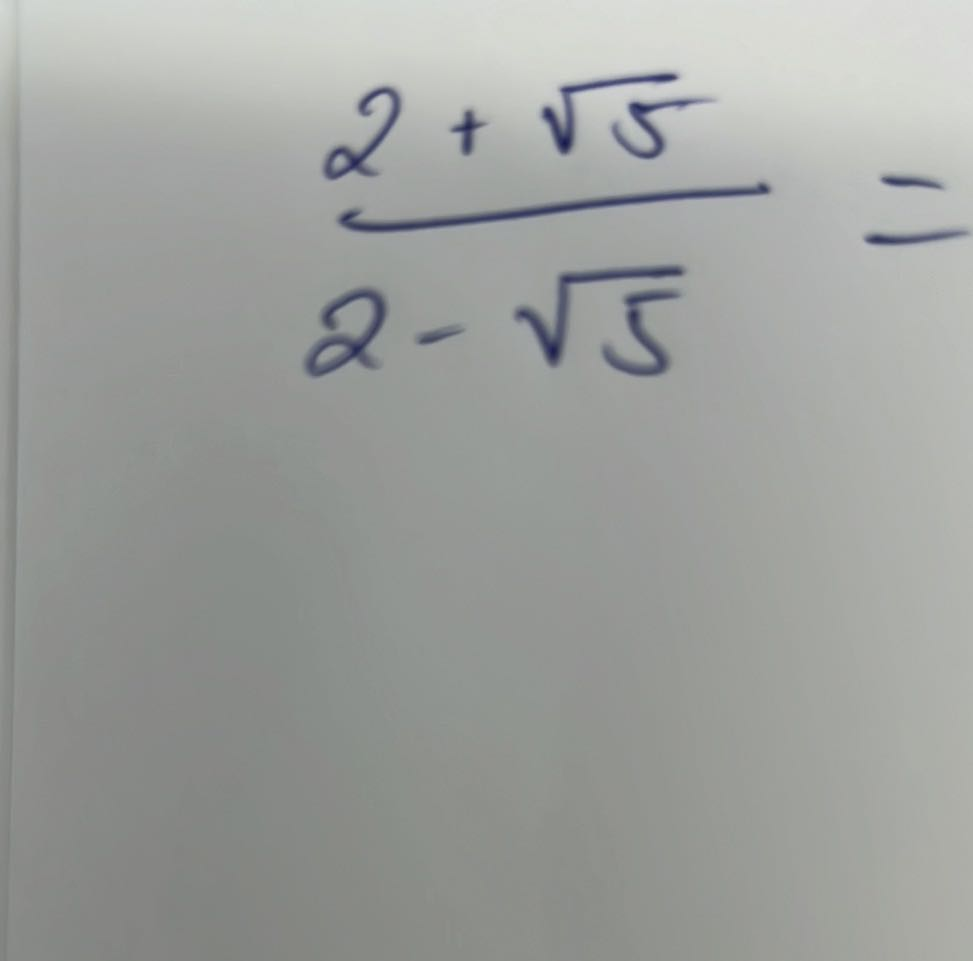

-- Number of question_words: 21


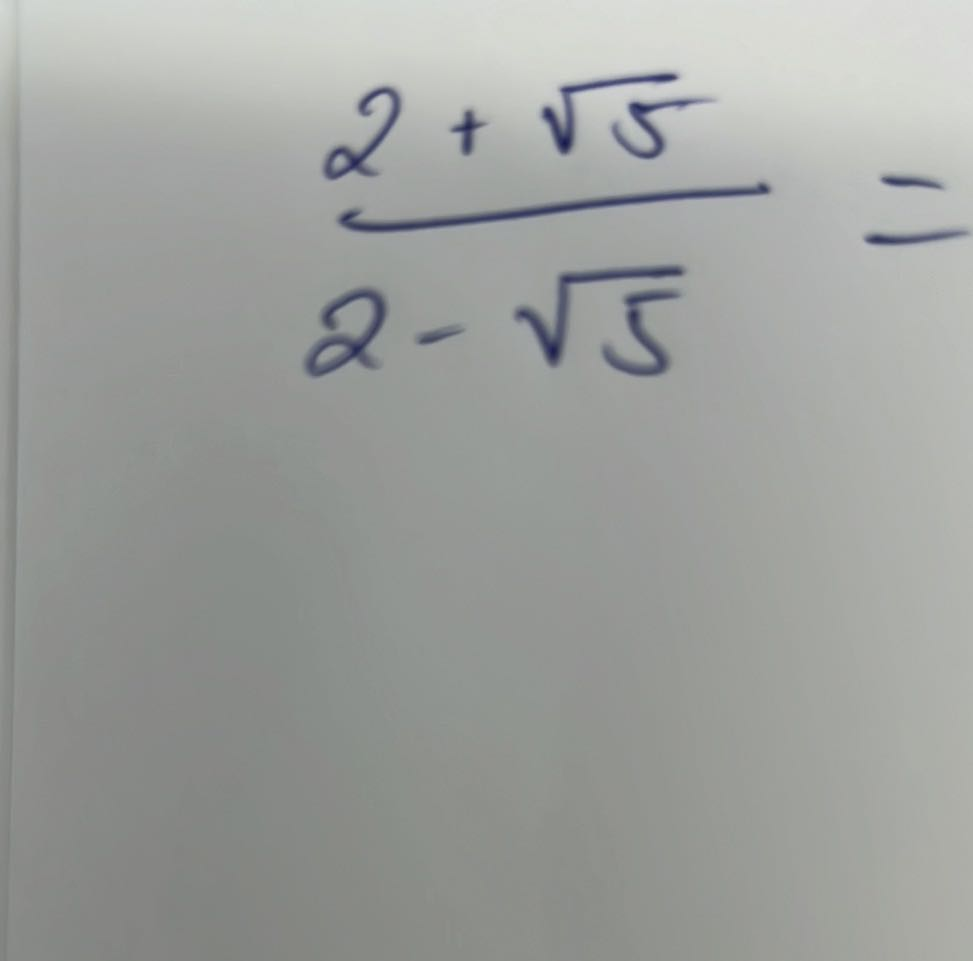

************

INDEX: 1212 - Cosine score: 0.0
-- Number of lookup_words: 29


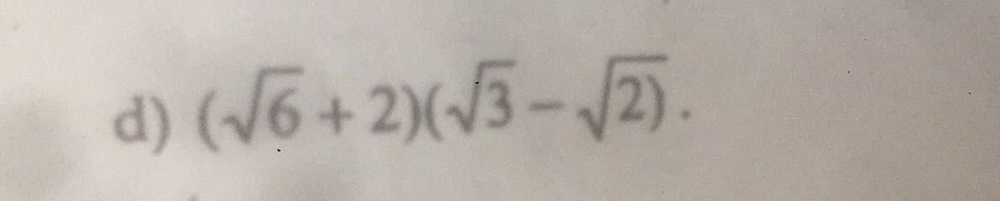

-- Number of question_words: 27


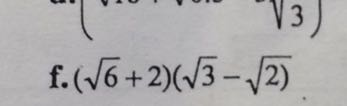

************

INDEX: 1214 - Cosine score: 0.0
-- Number of lookup_words: 26


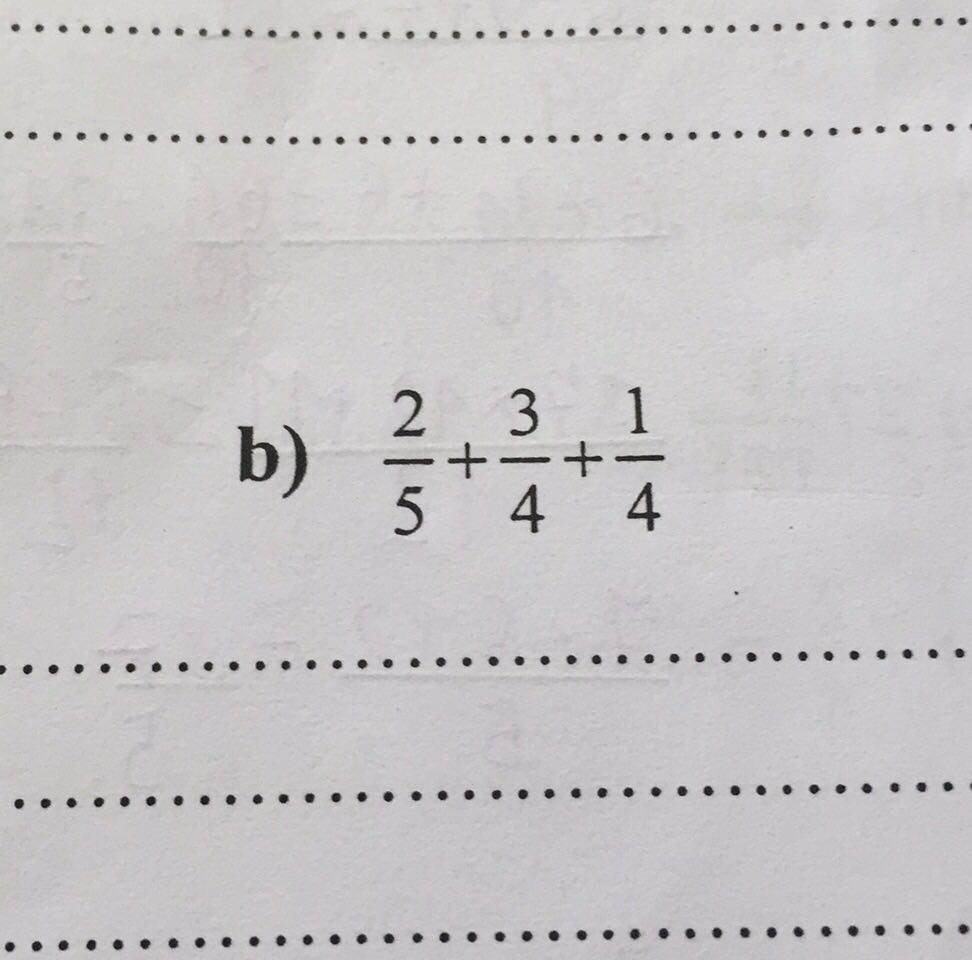

-- Number of question_words: 26


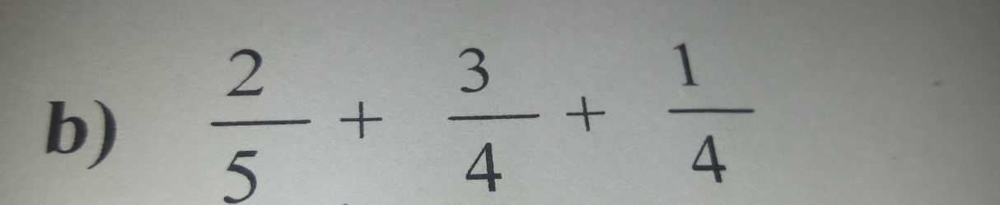

************

INDEX: 1292 - Cosine score: 0.0
-- Number of lookup_words: 38


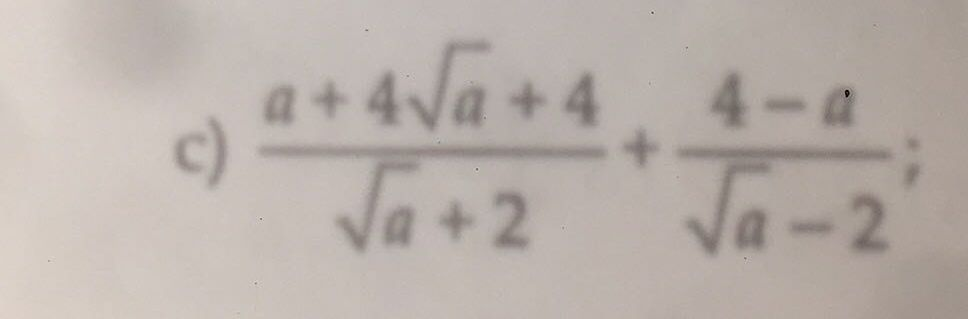

-- Number of question_words: 36


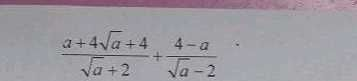

************

INDEX: 1297 - Cosine score: 0.0
-- Number of lookup_words: 34


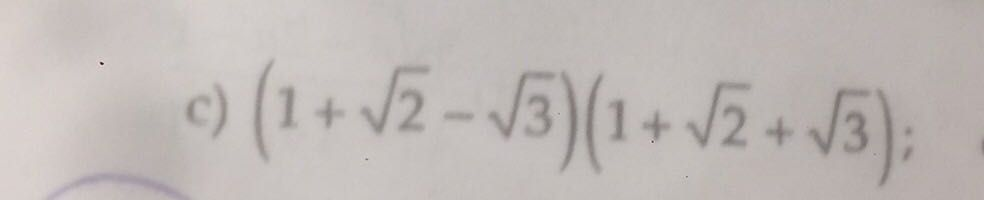

-- Number of question_words: 34


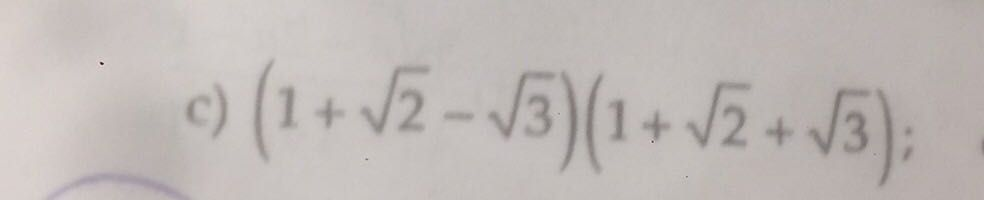

************

INDEX: 1318 - Cosine score: 0.0
-- Number of lookup_words: 68


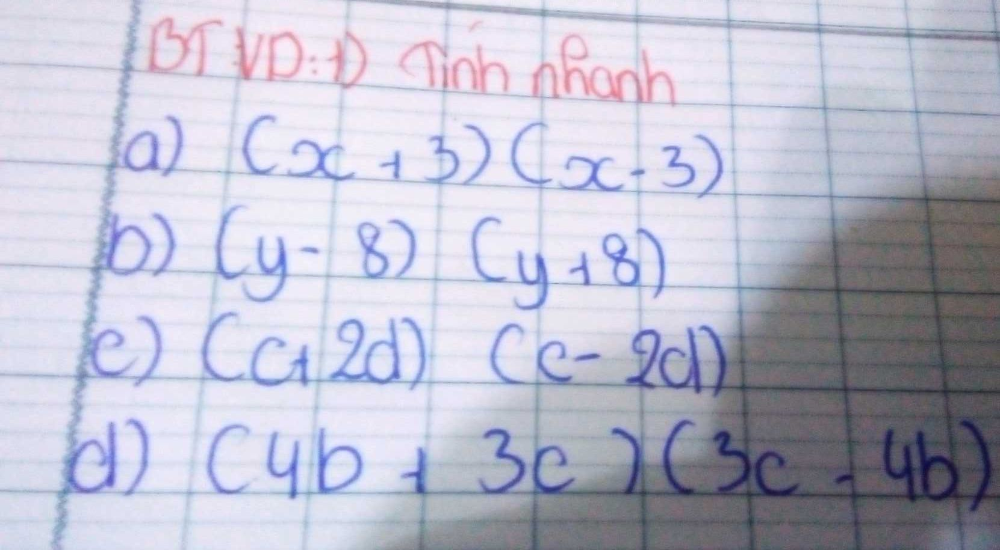

-- Number of question_words: 62


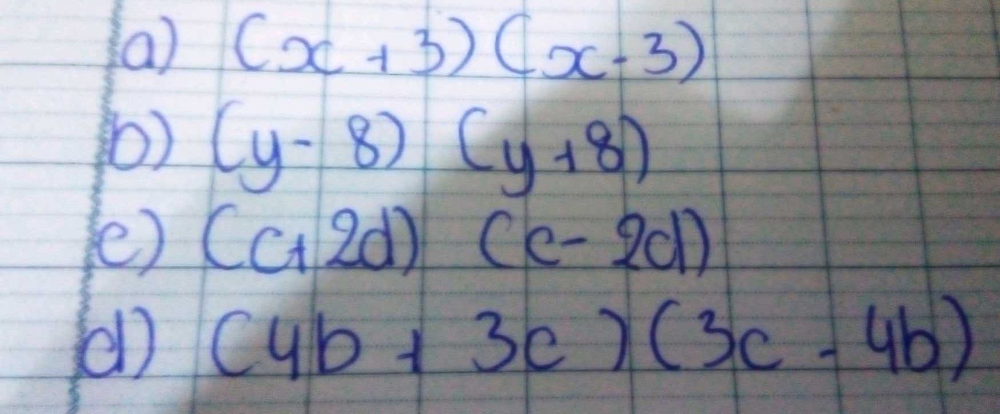

************

INDEX: 1441 - Cosine score: 0.0
-- Number of lookup_words: 36


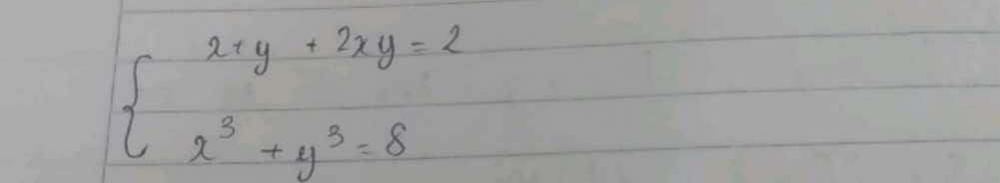

-- Number of question_words: 89


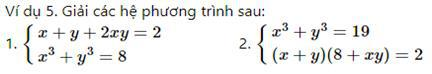

************

INDEX: 1639 - Cosine score: 0.0
-- Number of lookup_words: 20


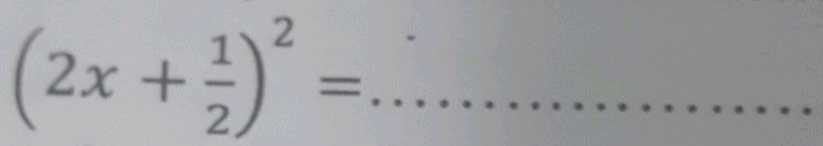

-- Number of question_words: 21


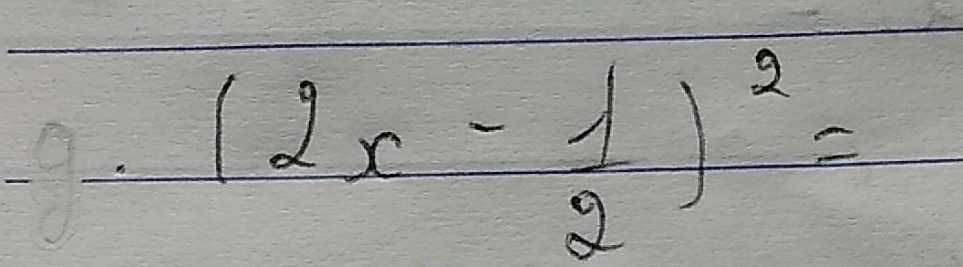

************

INDEX: 1517 - Cosine score: 0.0
-- Number of lookup_words: 22


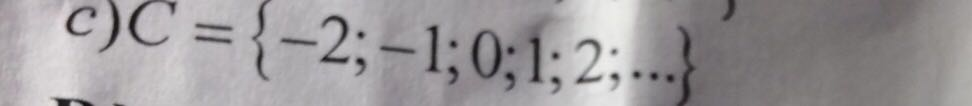

-- Number of question_words: 22


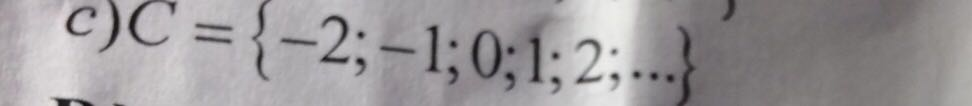

************

INDEX: 1741 - Cosine score: 0.0
-- Number of lookup_words: 34


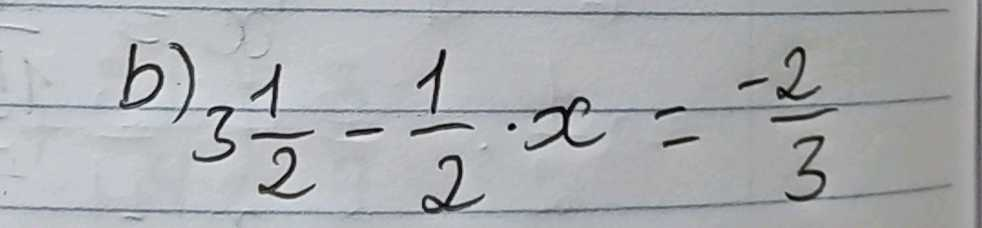

-- Number of question_words: 151


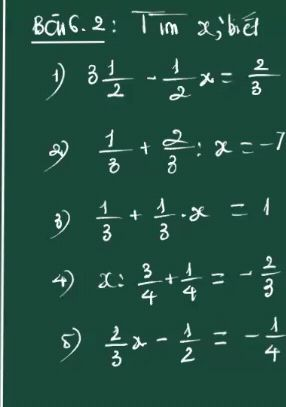

************

INDEX: 1177 - Cosine score: 0.0
-- Number of lookup_words: 48


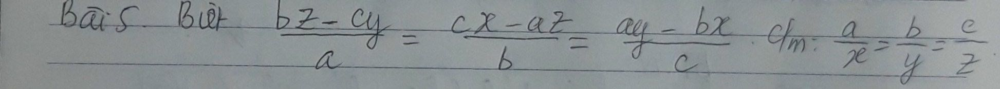

-- Number of question_words: 120


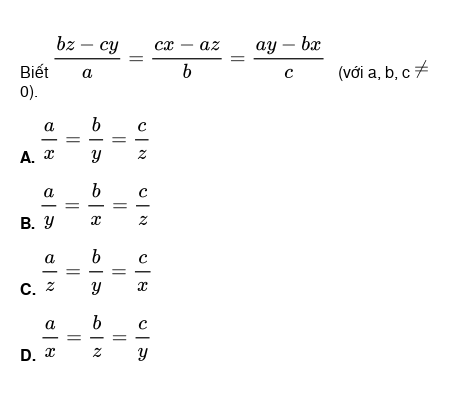

************

INDEX: 1676 - Cosine score: 0.0
-- Number of lookup_words: 31


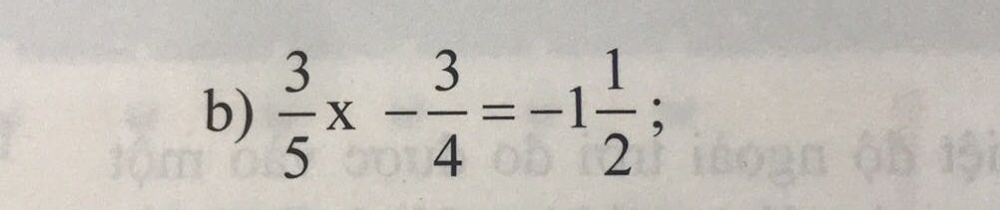

-- Number of question_words: 32


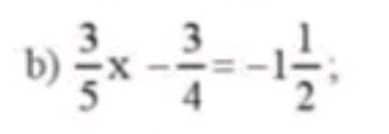

************

INDEX: 1824 - Cosine score: 0.0
-- Number of lookup_words: 21


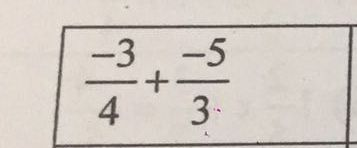

-- Number of question_words: 175


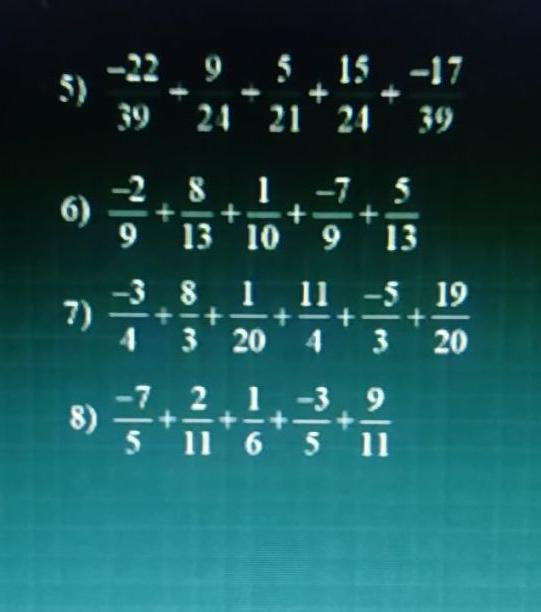

************

INDEX: 1723 - Cosine score: 0.0
-- Number of lookup_words: 19


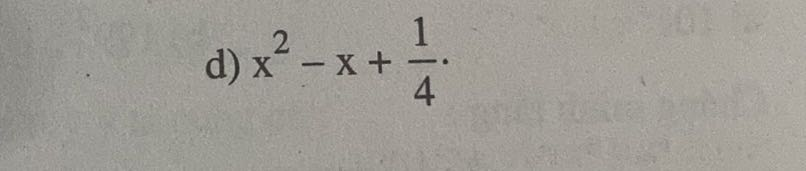

-- Number of question_words: 19


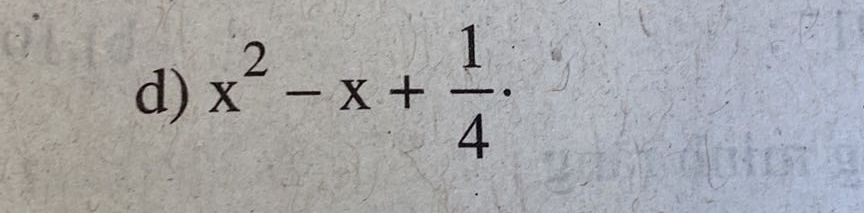

************

INDEX: 1726 - Cosine score: 0.0
-- Number of lookup_words: 19


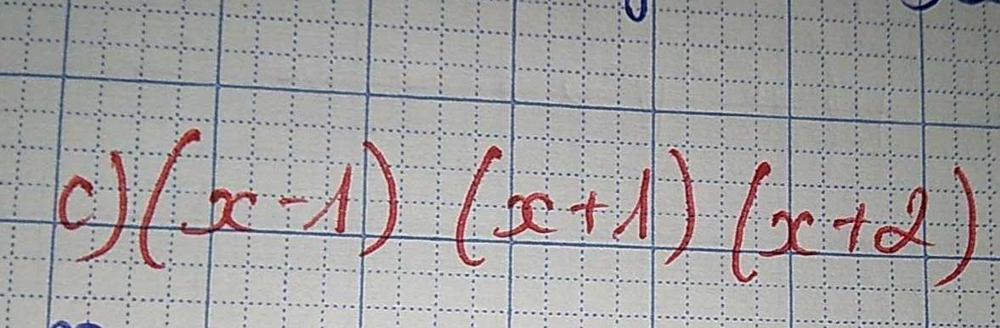

-- Number of question_words: 19


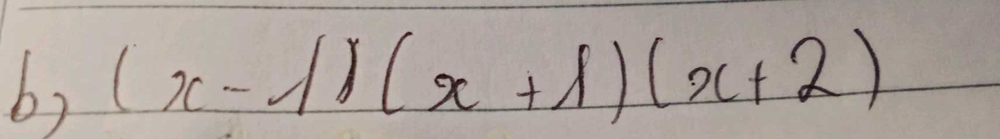

************

INDEX: 1731 - Cosine score: 0.0
-- Number of lookup_words: 40


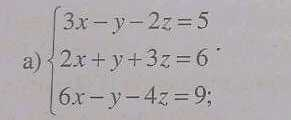

-- Number of question_words: 38


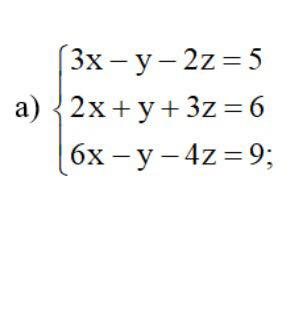

************

INDEX: 1740 - Cosine score: 0.0
-- Number of lookup_words: 54


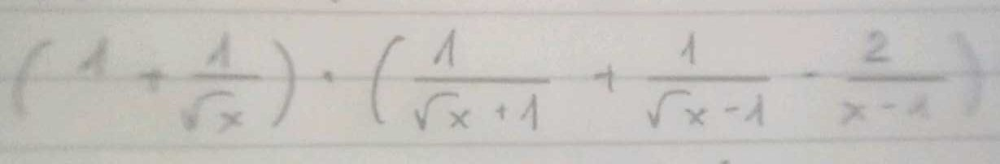

-- Number of question_words: 66


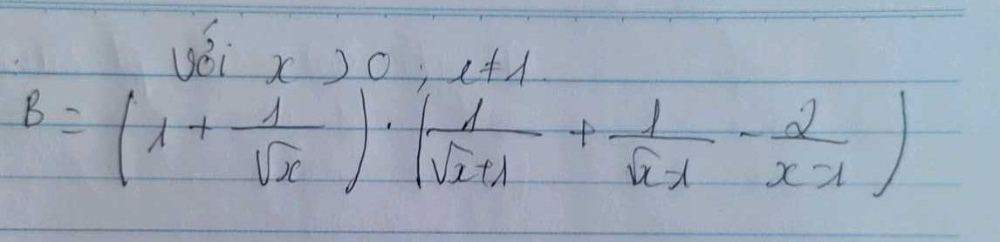

************

INDEX: 1642 - Cosine score: 0.0
-- Number of lookup_words: 24


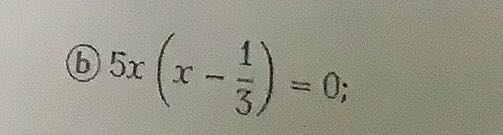

-- Number of question_words: 390


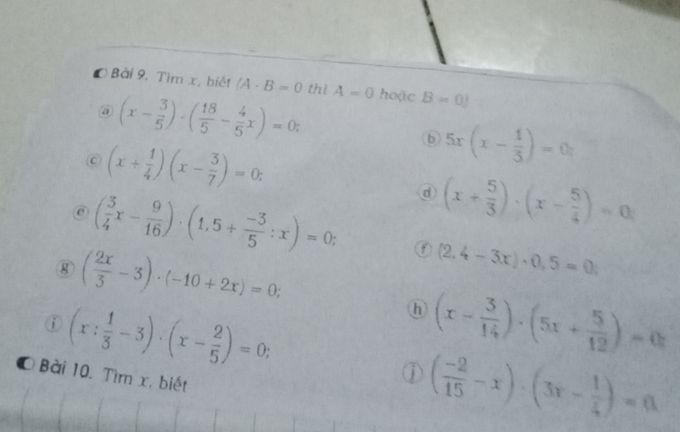

************

INDEX: 1063 - Cosine score: 0.0
-- Number of lookup_words: 16


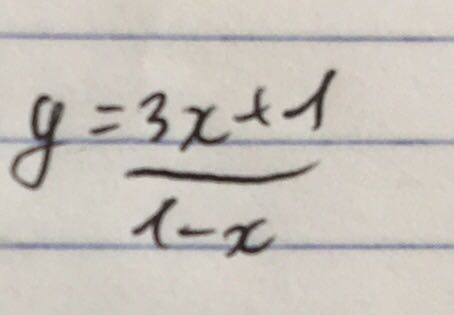

-- Number of question_words: 30


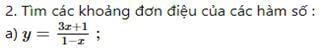

************

INDEX: 1134 - Cosine score: 0.0
-- Number of lookup_words: 11


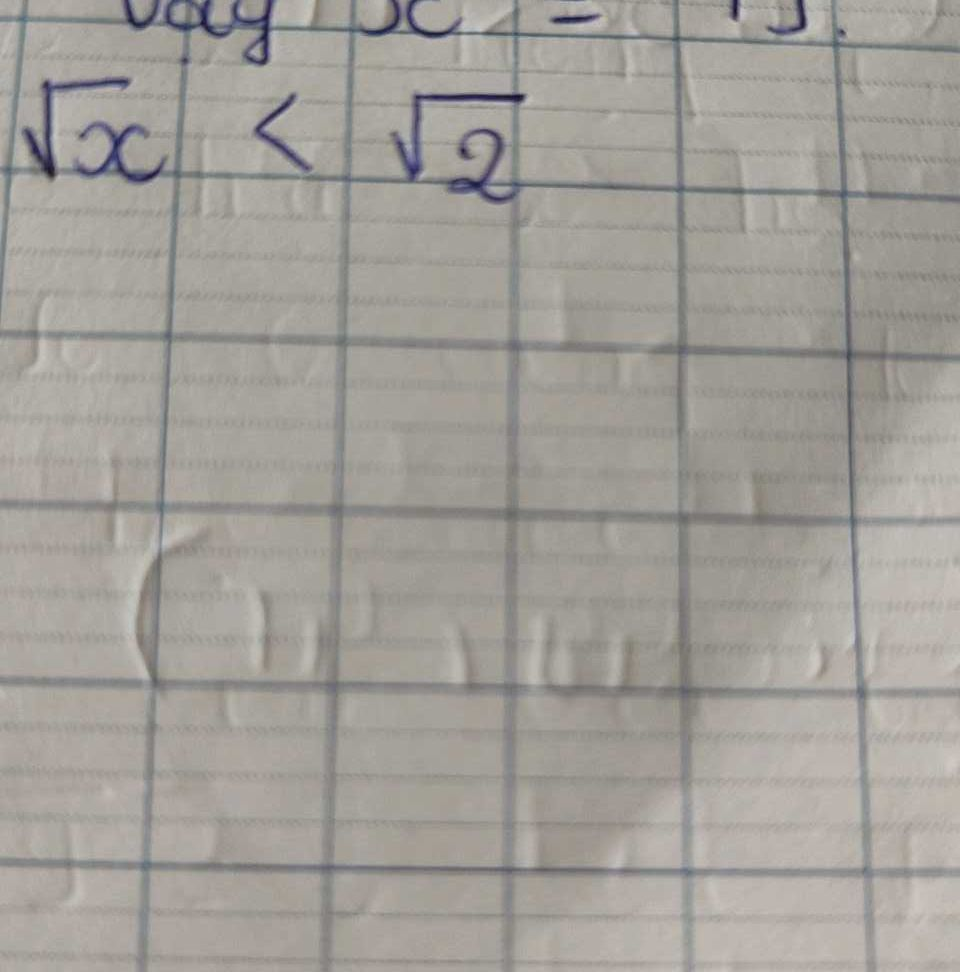

-- Number of question_words: 13


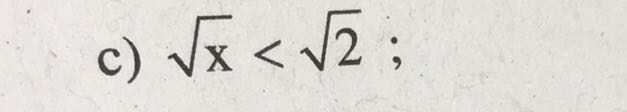

************

INDEX: 1086 - Cosine score: 0.0
-- Number of lookup_words: 25


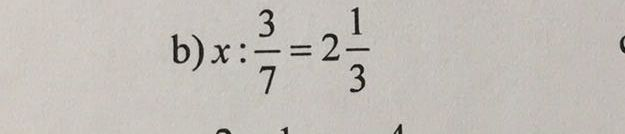

-- Number of question_words: 125


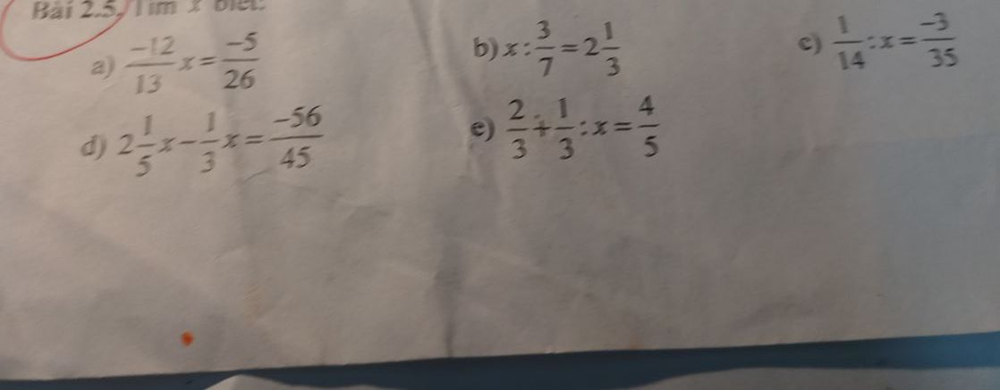

************

INDEX: 109 - Cosine score: 0.0
-- Number of lookup_words: 66


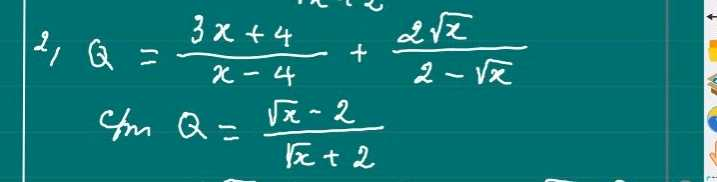

-- Number of question_words: 66


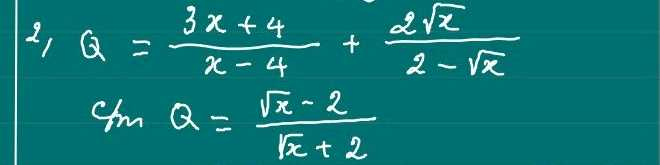

************

INDEX: 167 - Cosine score: 0.0
-- Number of lookup_words: 16


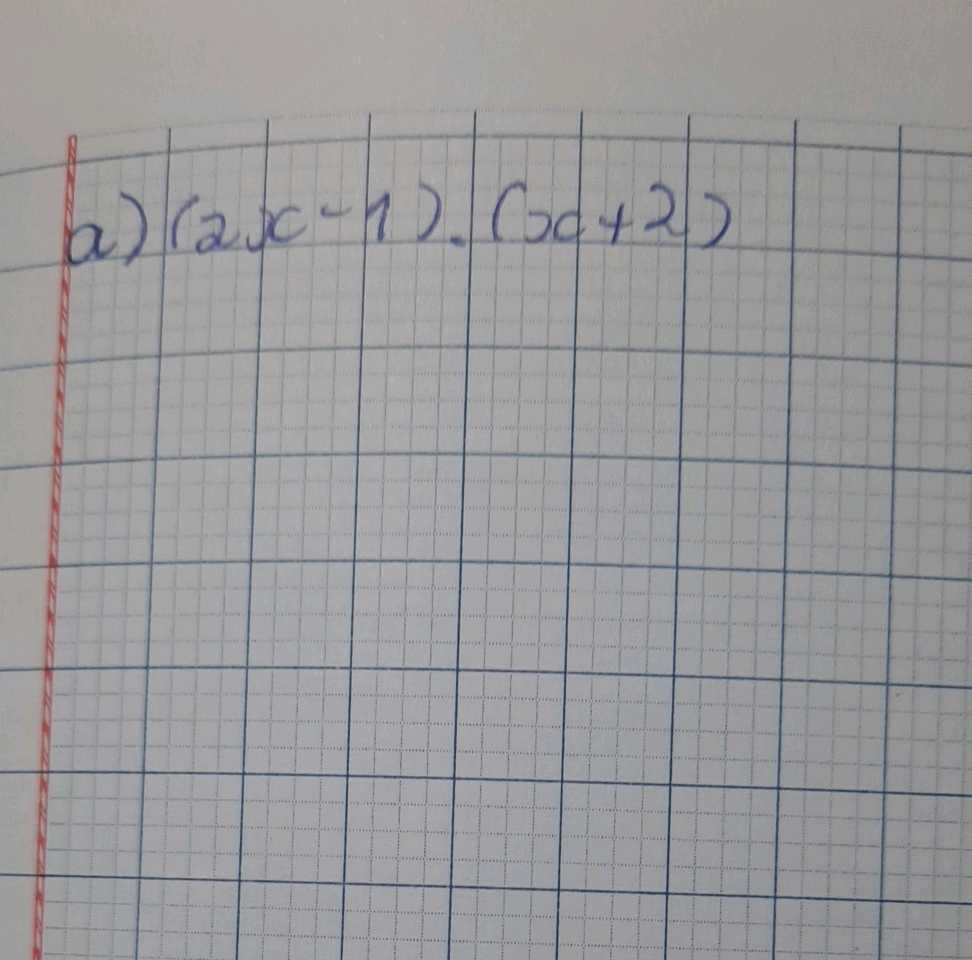

-- Number of question_words: 16


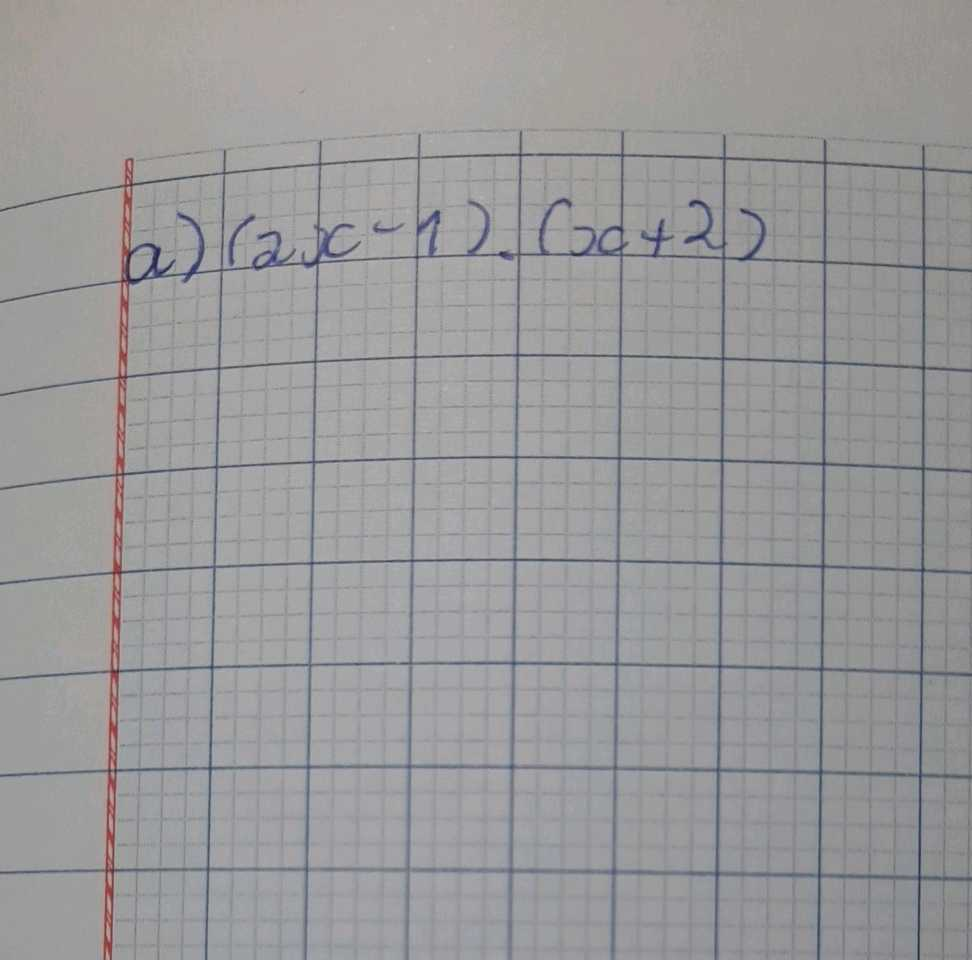

************

INDEX: 175 - Cosine score: 0.0
-- Number of lookup_words: 32


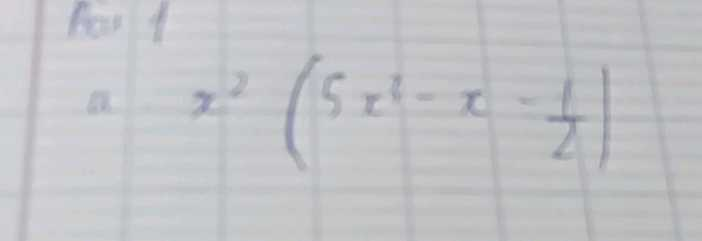

-- Number of question_words: 32


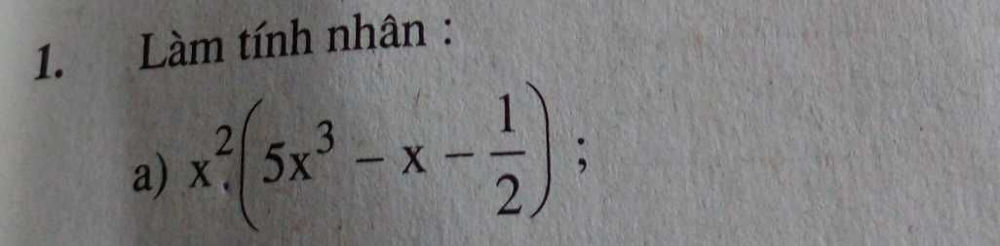

************

INDEX: 235 - Cosine score: 0.0
-- Number of lookup_words: 28


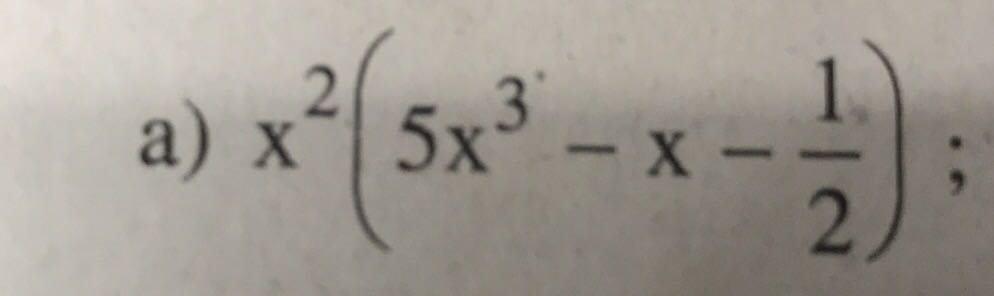

-- Number of question_words: 32


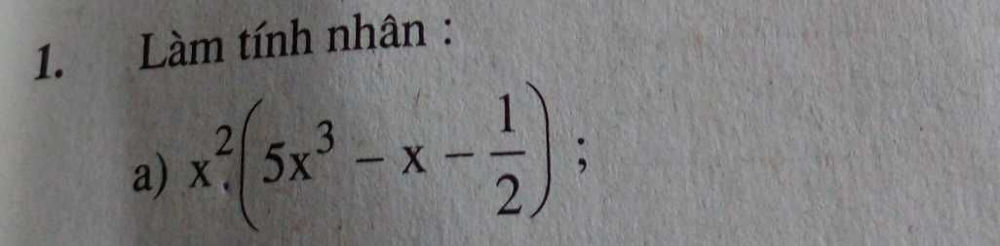

************

INDEX: 248 - Cosine score: 0.0
-- Number of lookup_words: 31


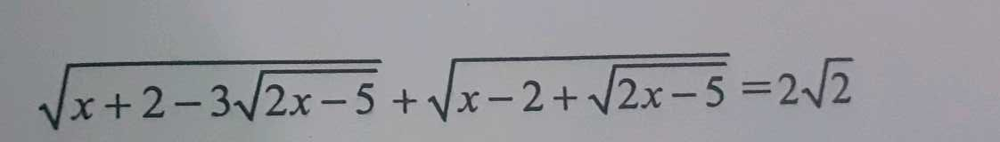

-- Number of question_words: 33


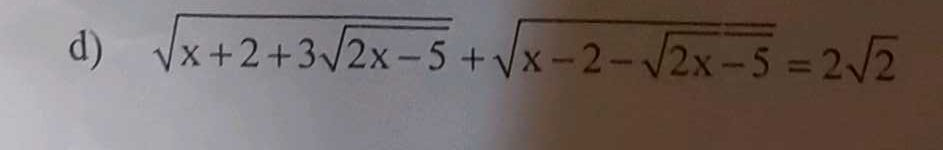

************

INDEX: 309 - Cosine score: 0.0
-- Number of lookup_words: 28


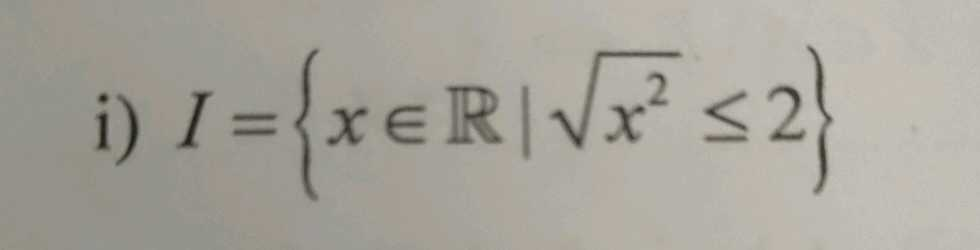

-- Number of question_words: 28


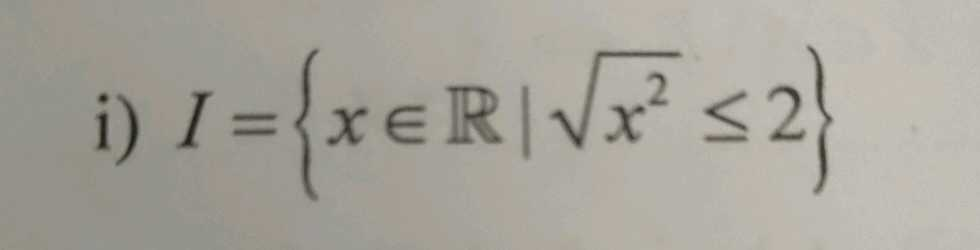

************

INDEX: 333 - Cosine score: 0.0
-- Number of lookup_words: 85


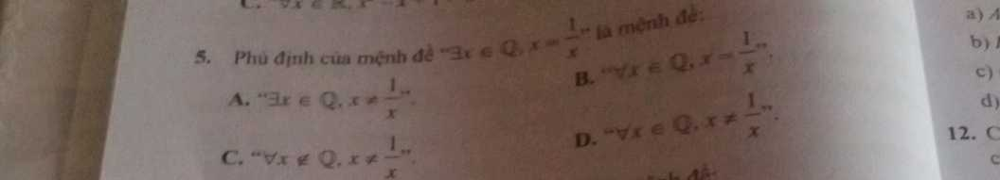

-- Number of question_words: 85


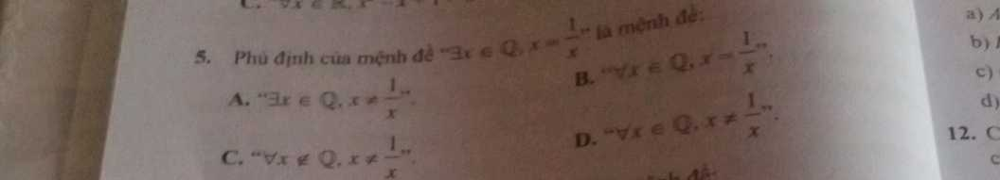

************

INDEX: 474 - Cosine score: 0.0
-- Number of lookup_words: 27


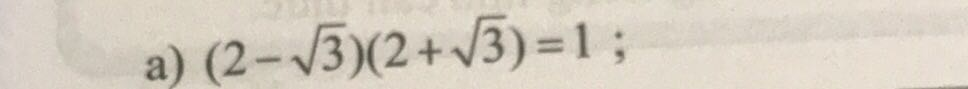

-- Number of question_words: 73


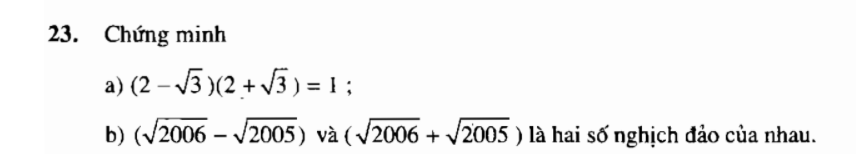

************

INDEX: 683 - Cosine score: 0.0
-- Number of lookup_words: 13


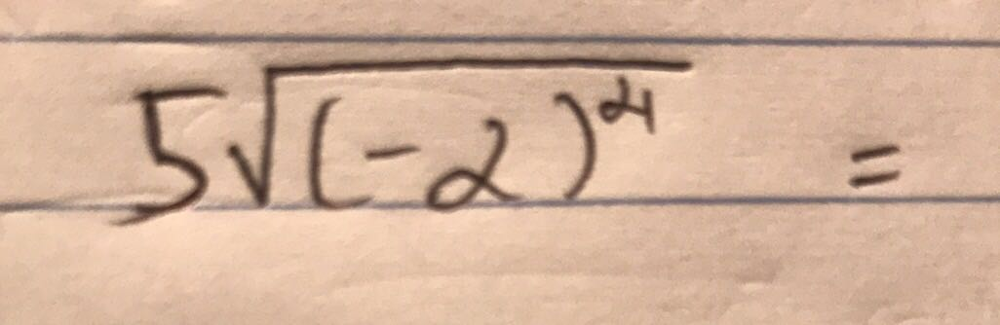

-- Number of question_words: 85


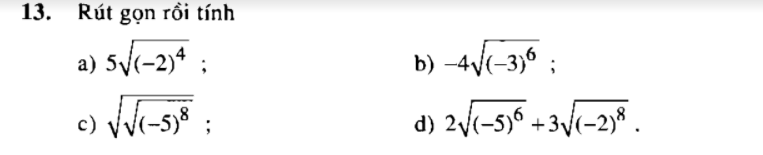

************

INDEX: 715 - Cosine score: 0.0
-- Number of lookup_words: 23


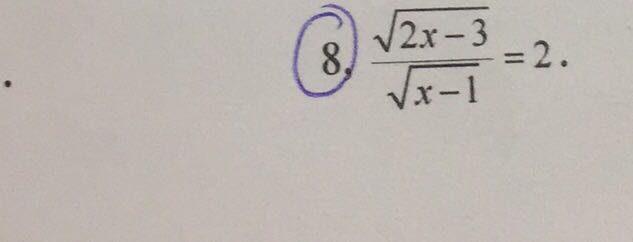

-- Number of question_words: 18


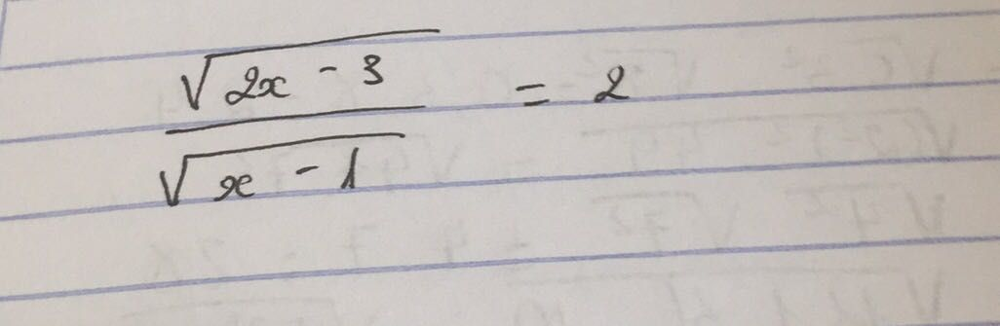

************

INDEX: 825 - Cosine score: 0.0
-- Number of lookup_words: 24


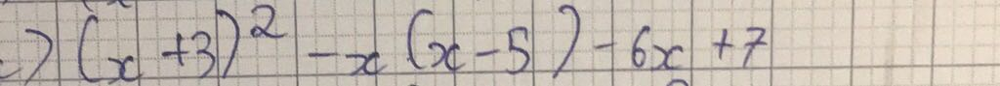

-- Number of question_words: 25


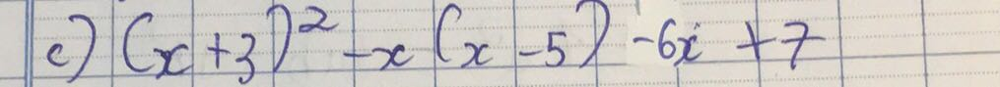

************

INDEX: 827 - Cosine score: 0.0
-- Number of lookup_words: 33


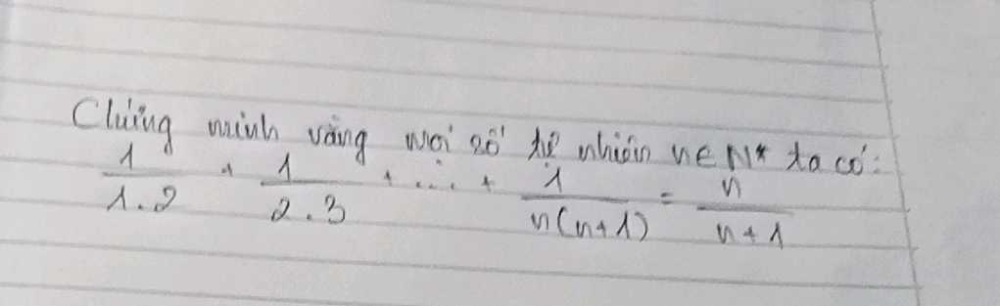

-- Number of question_words: 37


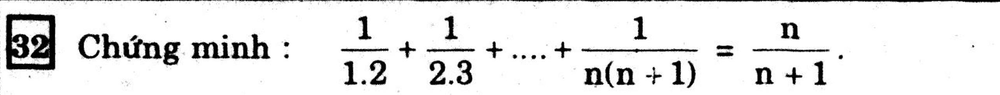

************

INDEX: 860 - Cosine score: 0.0
-- Number of lookup_words: 47


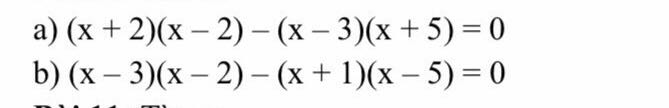

-- Number of question_words: 53


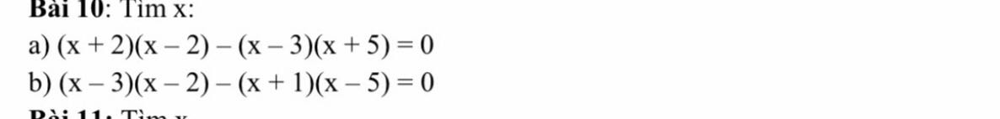

************

INDEX: 933 - Cosine score: 0.0
-- Number of lookup_words: 12


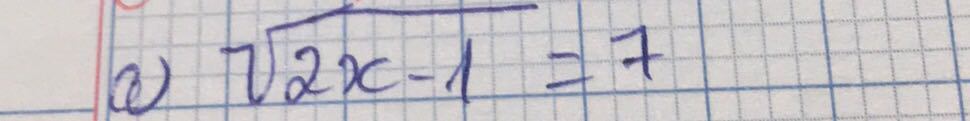

-- Number of question_words: 46


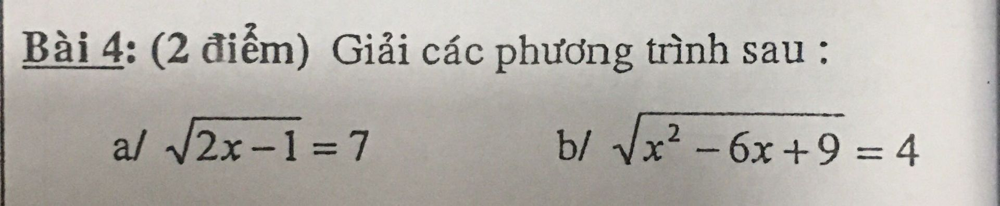

************

INDEX: 960 - Cosine score: 0.0
-- Number of lookup_words: 50


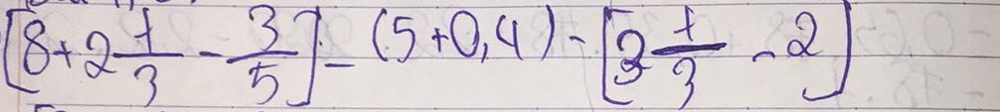

-- Number of question_words: 49


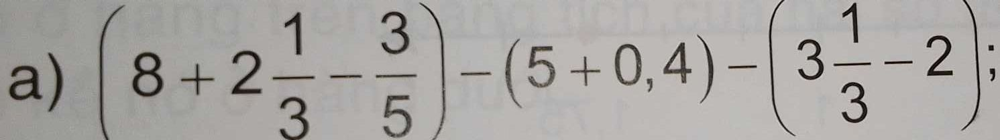

************

INDEX: 98 - Cosine score: 0.0
-- Number of lookup_words: 20


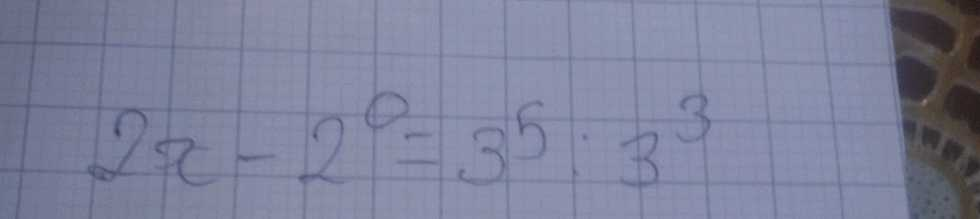

-- Number of question_words: 22


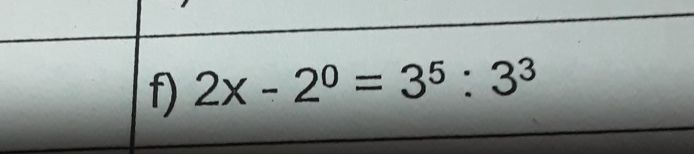

************

INDEX: 1076 - Cosine score: 0.0
-- Number of lookup_words: 84


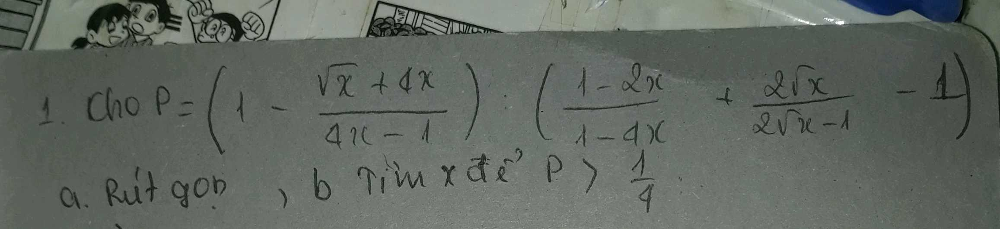

-- Number of question_words: 103


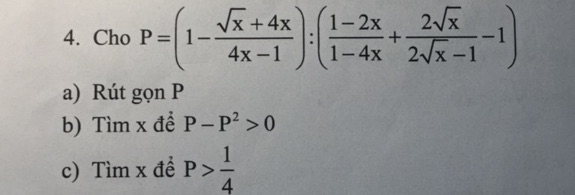

************

INDEX: 1921 - Cosine score: 0.0
-- Number of lookup_words: 26


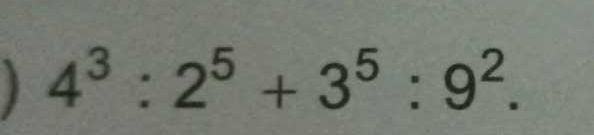

-- Number of question_words: 28


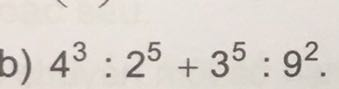

************



In [60]:
for index_ in df_check.index:
    print('INDEX: {} - Cosine score: {}'.format(index_, df_check.loc[index_]['cosine_plain2']))
    print('-- Number of lookup_words:', df_check.loc[index_]['word_count_lookup'])
    img0 = Disp.Image(requests.get(df_check.loc[index_]['Lookup Image']).content)
    display(img0)
    print('-- Number of question_words:', df_check.loc[index_]['word_count_question'])
    img1 = Disp.Image(requests.get(df_check.loc[index_]['Question Image']).content)
    display(img1)
    print('************')
    print()

In [61]:
jc_plain = jaccard_search(df['lookup_plain'].values, df['question_plain'].values)
jc_plain2 = jaccard_search(df['clean_lookup2'].values, df['clean_question2'].values)

Jaccard search took 0.06s.
Jaccard search took 0.05s.


In [62]:
df['jc_plain'] = jc_plain
df['jc_plain2'] = jc_plain2

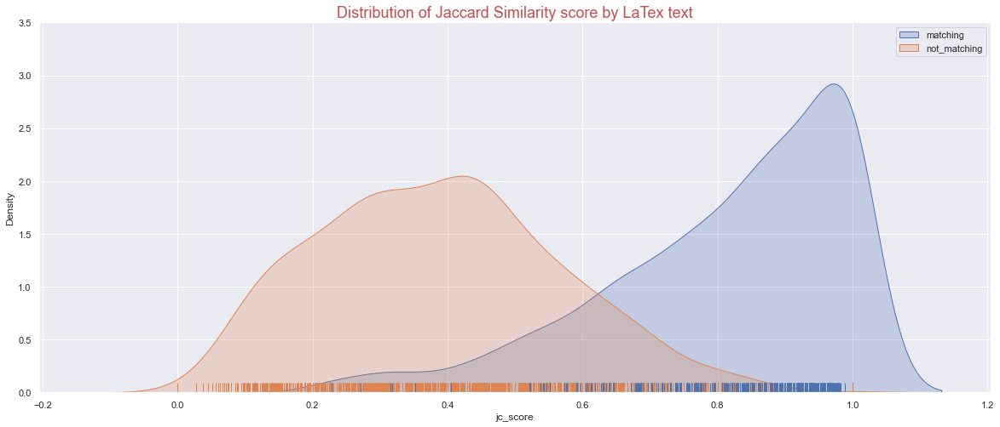

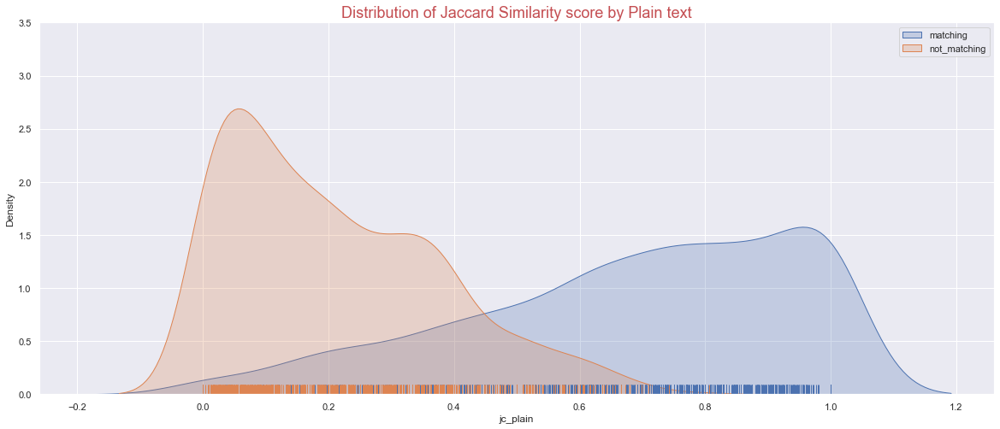

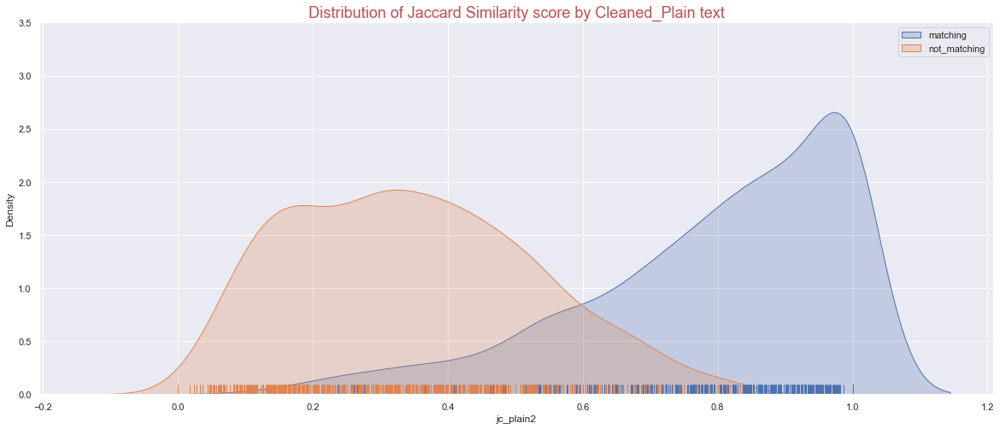

In [68]:
plt.figure(figsize=(20, 8))
sb.distplot(df_pos.jc_score, hist = False, rug = True, kde_kws={'shade':'kde_kws'},label = 'matching')
sb.distplot(df_neg.jc_score, hist = False, rug = True, kde_kws={'shade':'kde_kws'},label = 'not_matching')
plt.legend()
plt.ylim([0, 3.5])
plt.title('Distribution of Jaccard Similarity score by LaTex text', fontsize = 18, color = 'r')
plt.figure(figsize=(20, 8))
sb.distplot(df_pos.jc_plain, hist = False, rug = True, kde_kws={'shade':'kde_kws'},label = 'matching')
sb.distplot(df_neg.jc_plain, hist = False, rug = True, kde_kws={'shade':'kde_kws'},label = 'not_matching')
plt.legend()
plt.ylim([0, 3.5])
plt.title('Distribution of Jaccard Similarity score by Plain text', fontsize = 18, color = 'r')
plt.figure(figsize=(20, 8))
sb.distplot(df_pos.jc_plain2, hist = False, rug = True, kde_kws={'shade':'kde_kws'},label = 'matching')
sb.distplot(df_neg.jc_plain2, hist = False, rug = True, kde_kws={'shade':'kde_kws'},label = 'not_matching')
plt.legend()
plt.ylim([0, 3.5])
plt.title('Distribution of Jaccard Similarity score by Cleaned_Plain text', fontsize = 18, color = 'r');

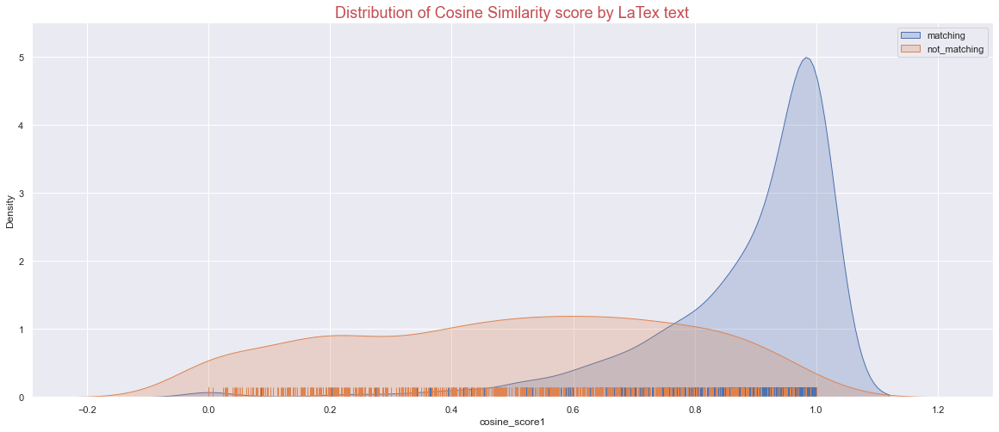

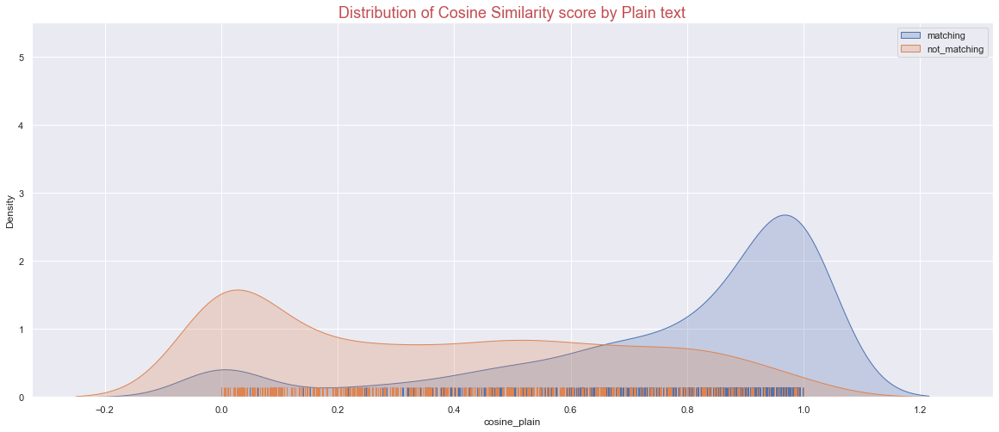

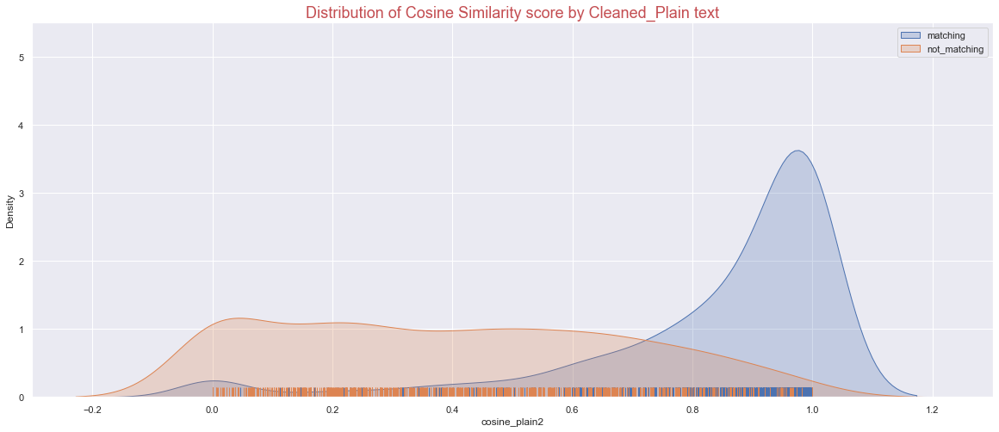

In [71]:
plt.figure(figsize=(20, 8))
sb.distplot(df_pos.cosine_score1, hist = False, rug = True, kde_kws={'shade':'kde_kws'},label = 'matching')
sb.distplot(df_neg.cosine_score1, hist = False, rug = True, kde_kws={'shade':'kde_kws'},label = 'not_matching')
plt.legend()
plt.ylim([0, 5.5])
plt.title('Distribution of Cosine Similarity score by LaTex text', fontsize = 18, color = 'r')
plt.figure(figsize=(20, 8))
sb.distplot(df_pos.cosine_plain, hist = False, rug = True, kde_kws={'shade':'kde_kws'},label = 'matching')
sb.distplot(df_neg.cosine_plain, hist = False, rug = True, kde_kws={'shade':'kde_kws'},label = 'not_matching')
plt.legend()
plt.ylim([0, 5.5])
plt.title('Distribution of Cosine Similarity score by Plain text', fontsize = 18, color = 'r')
plt.figure(figsize=(20, 8))
sb.distplot(df_pos.cosine_plain2, hist = False, rug = True, kde_kws={'shade':'kde_kws'},label = 'matching')
sb.distplot(df_neg.cosine_plain2, hist = False, rug = True, kde_kws={'shade':'kde_kws'},label = 'not_matching')
plt.legend()
plt.ylim([0, 5.5])
plt.title('Distribution of Cosine Similarity score by Cleaned_Plain text', fontsize = 18, color = 'r');

In [141]:
df_check2 = df_neg.loc[df_neg['cosine_plain2'] >= 0.8]
df_check2 = df_check2.sort_values('cosine_plain2', ascending = False)
df_check2.shape

(82, 27)

INDEX: 855 - Cosine score: 1.0000000000000002, SE_output: POSITIVE
------------ Jaccard score: 0.5625
-- Number of lookup_words: 33


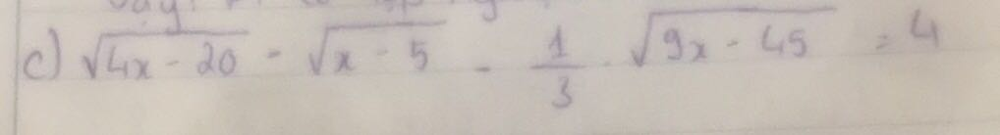

-- Number of question_words: 28


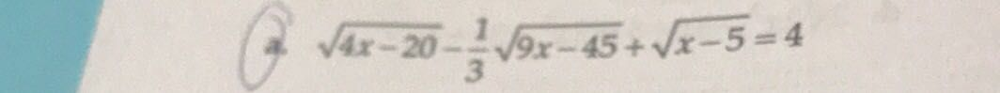

************

INDEX: 1082 - Cosine score: 1.0, SE_output: NEGATIVE
------------ Jaccard score: 0.7333333333333333
-- Number of lookup_words: 53


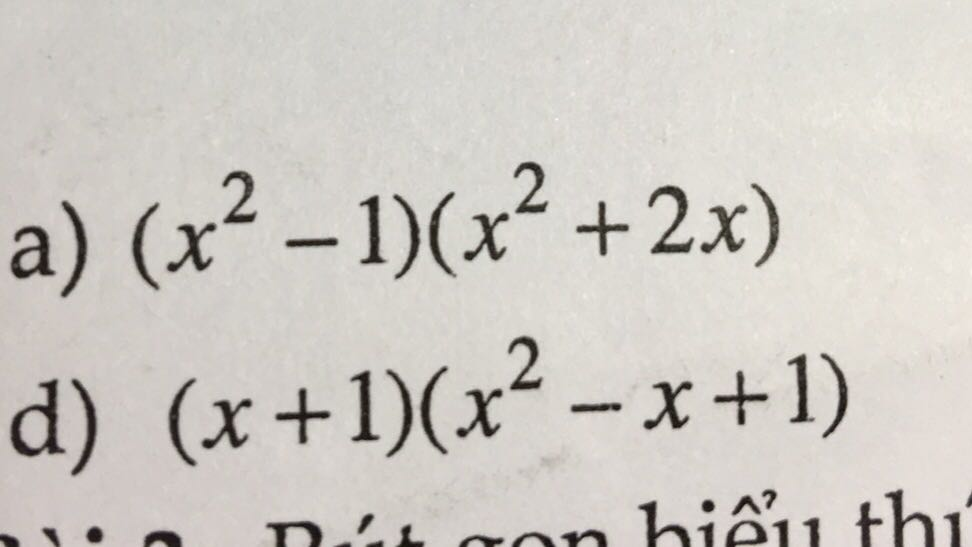

-- Number of question_words: 112


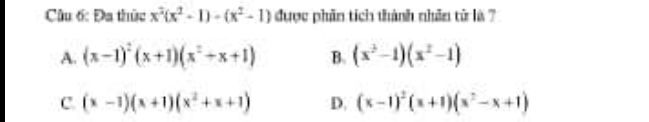

************

INDEX: 6 - Cosine score: 1.0, SE_output: POSITIVE
------------ Jaccard score: 0.5555555555555556
-- Number of lookup_words: 8


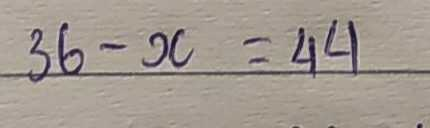

-- Number of question_words: 14


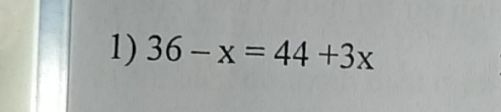

************

INDEX: 840 - Cosine score: 1.0, SE_output: POSITIVE
------------ Jaccard score: 0.5454545454545454
-- Number of lookup_words: 16


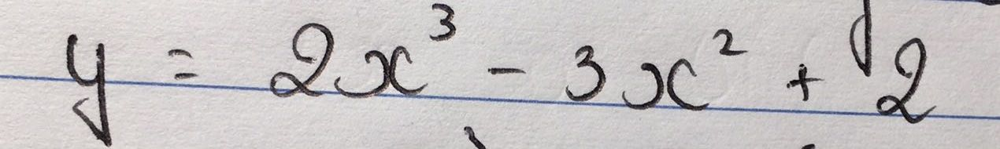

-- Number of question_words: 21


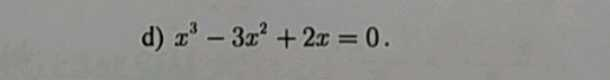

************

INDEX: 1768 - Cosine score: 1.0, SE_output: POSITIVE
------------ Jaccard score: 0.75
-- Number of lookup_words: 29


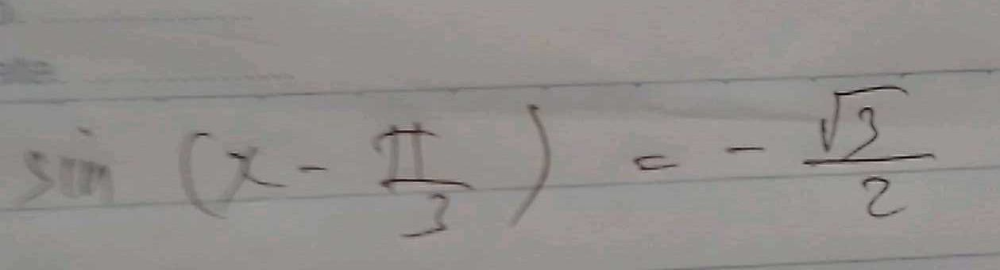

-- Number of question_words: 36


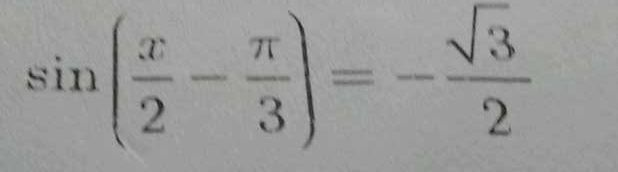

************

INDEX: 1362 - Cosine score: 1.0, SE_output: POSITIVE
------------ Jaccard score: 0.8
-- Number of lookup_words: 24


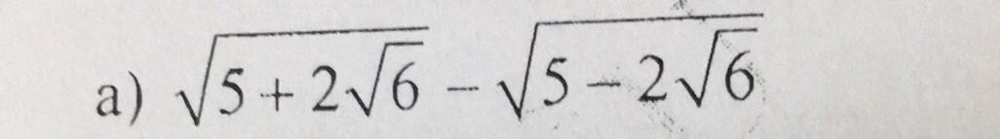

-- Number of question_words: 20


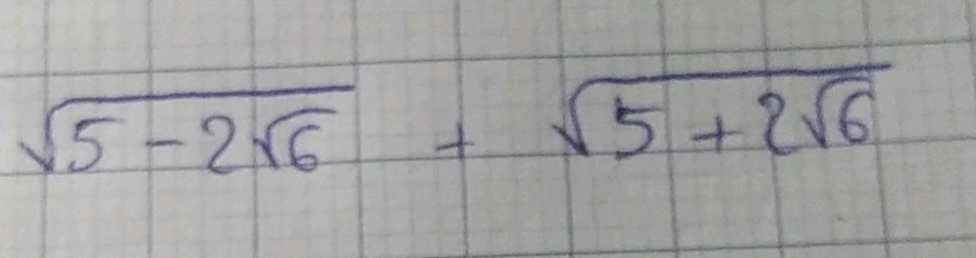

************

INDEX: 570 - Cosine score: 1.0, SE_output: NEGATIVE
------------ Jaccard score: 0.6153846153846154
-- Number of lookup_words: 16


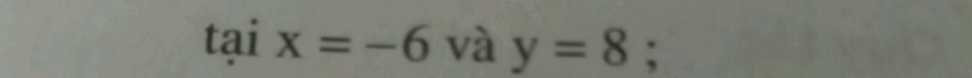

-- Number of question_words: 33


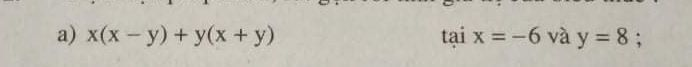

************

INDEX: 1581 - Cosine score: 1.0, SE_output: POSITIVE
------------ Jaccard score: 0.625
-- Number of lookup_words: 15


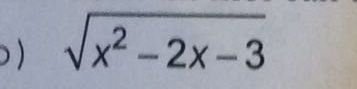

-- Number of question_words: 20


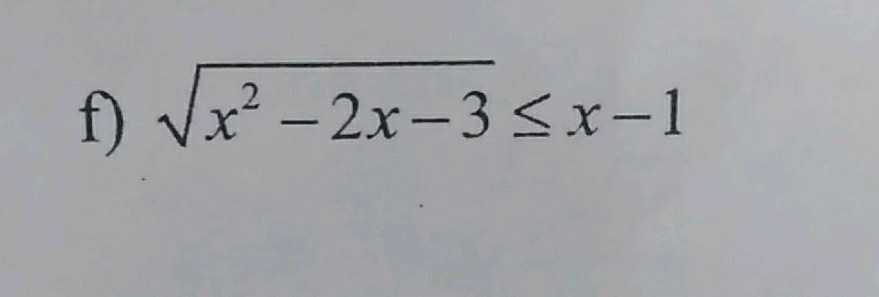

************

INDEX: 838 - Cosine score: 0.9828388006908848, SE_output: NEGATIVE
------------ Jaccard score: 0.45
-- Number of lookup_words: 95


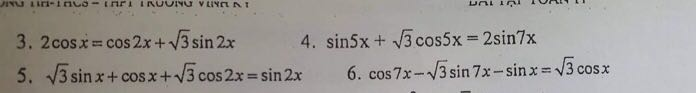

-- Number of question_words: 287


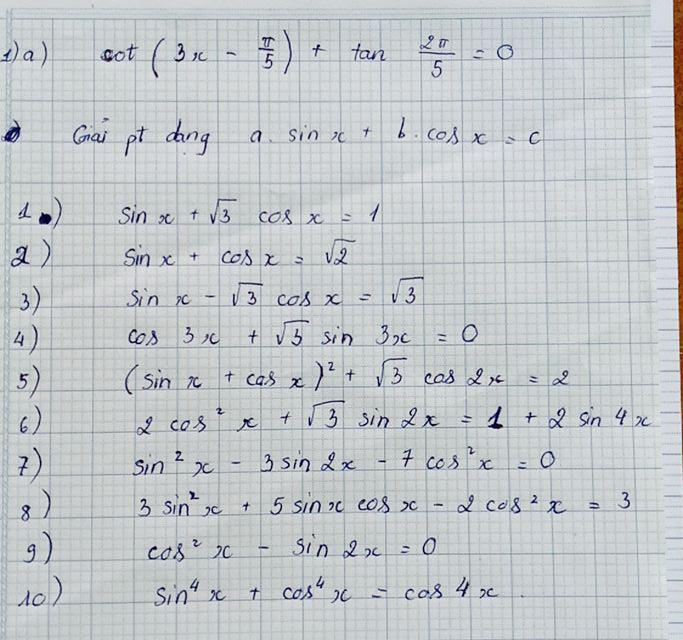

************

INDEX: 266 - Cosine score: 0.9743776247392223, SE_output: POSITIVE
------------ Jaccard score: 0.6538461538461539
-- Number of lookup_words: 43


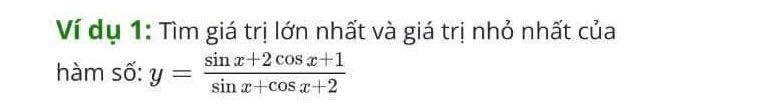

-- Number of question_words: 43


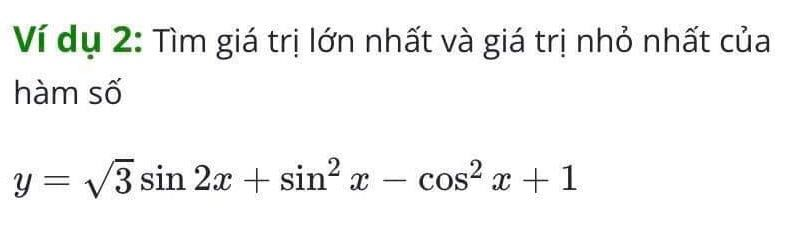

************

INDEX: 1531 - Cosine score: 0.9739040282415655, SE_output: POSITIVE
------------ Jaccard score: 0.5609756097560976
-- Number of lookup_words: 91


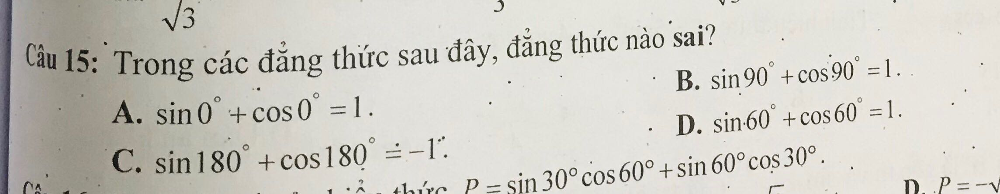

-- Number of question_words: 98


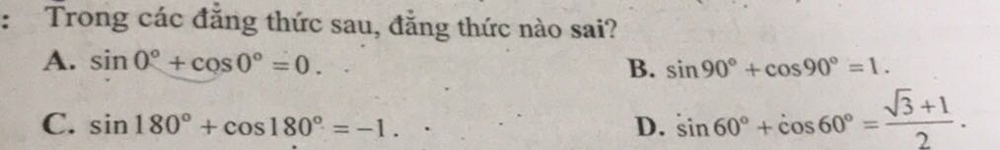

************

INDEX: 887 - Cosine score: 0.9684156626957225, SE_output: POSITIVE
------------ Jaccard score: 0.6
-- Number of lookup_words: 20


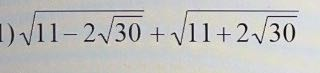

-- Number of question_words: 16


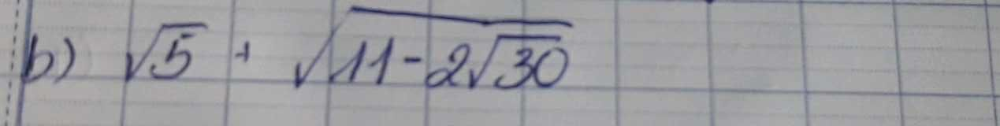

************

INDEX: 1720 - Cosine score: 0.9661801752981118, SE_output: POSITIVE
------------ Jaccard score: 0.8181818181818182
-- Number of lookup_words: 49


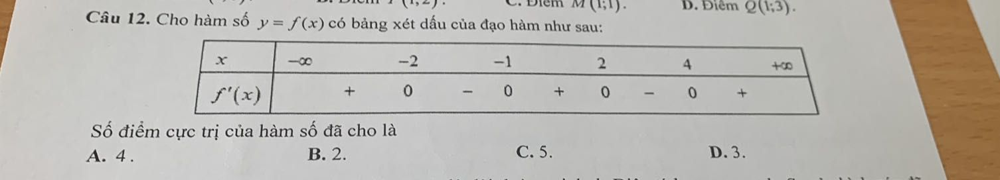

-- Number of question_words: 49


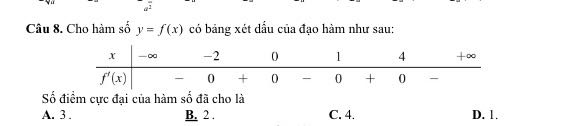

************

INDEX: 1427 - Cosine score: 0.9652022855999057, SE_output: NEGATIVE
------------ Jaccard score: 0.23529411764705882
-- Number of lookup_words: 19


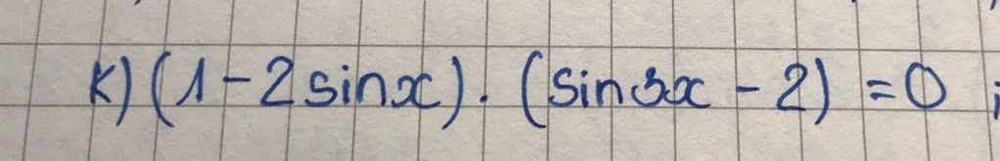

-- Number of question_words: 185


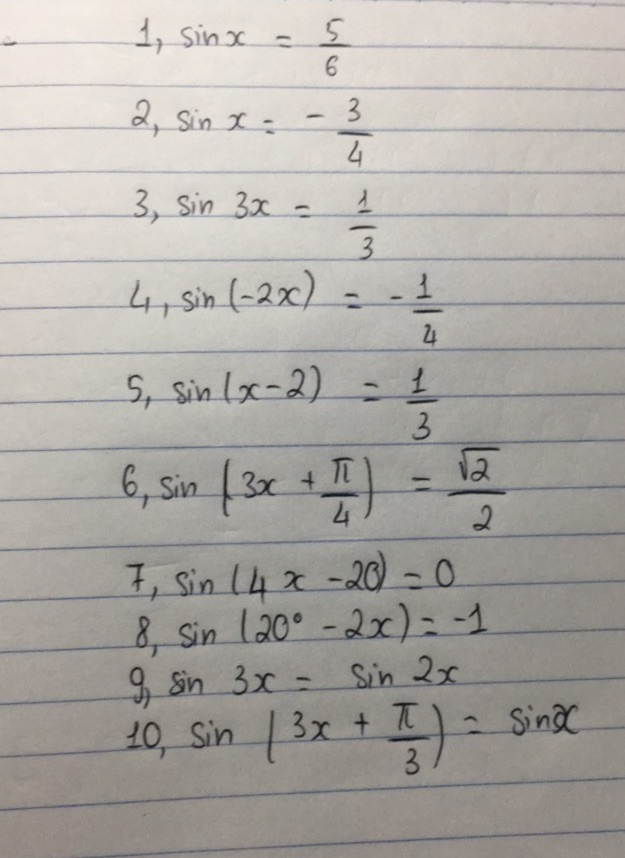

************

INDEX: 119 - Cosine score: 0.9637137534100153, SE_output: POSITIVE
------------ Jaccard score: 0.676056338028169
-- Number of lookup_words: 180


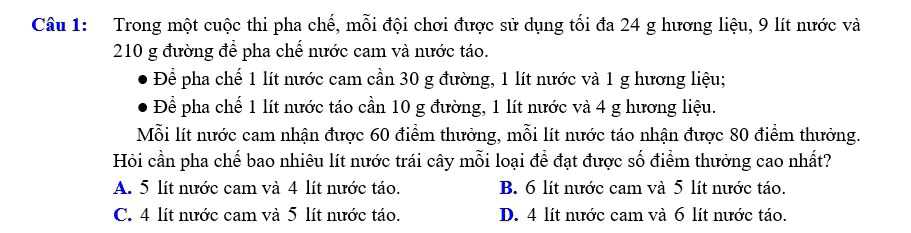

-- Number of question_words: 188


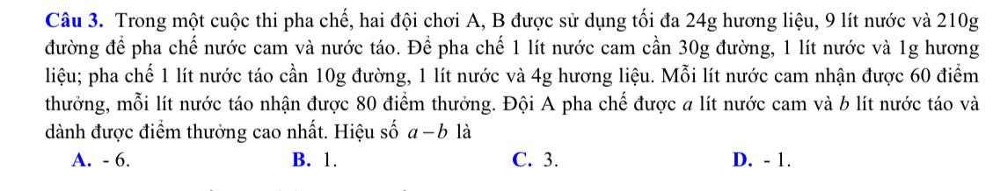

************

INDEX: 485 - Cosine score: 0.962740397477887, SE_output: POSITIVE
------------ Jaccard score: 0.6756756756756757
-- Number of lookup_words: 134


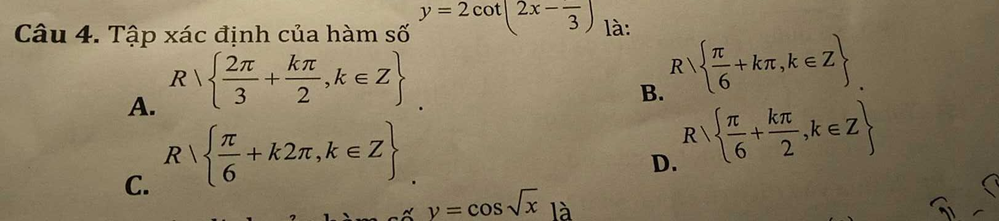

-- Number of question_words: 160


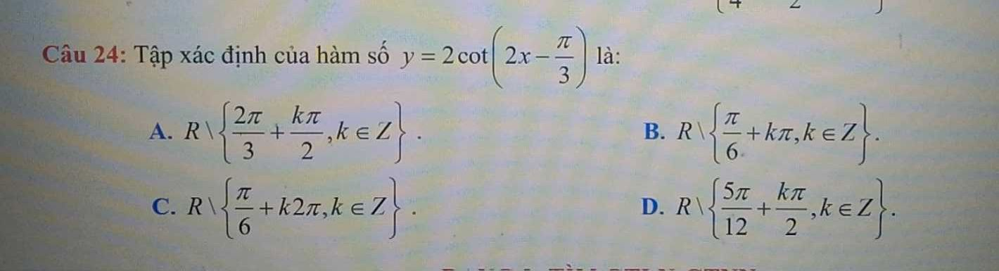

************

INDEX: 157 - Cosine score: 0.9563318678301828, SE_output: POSITIVE
------------ Jaccard score: 0.5128205128205128
-- Number of lookup_words: 75


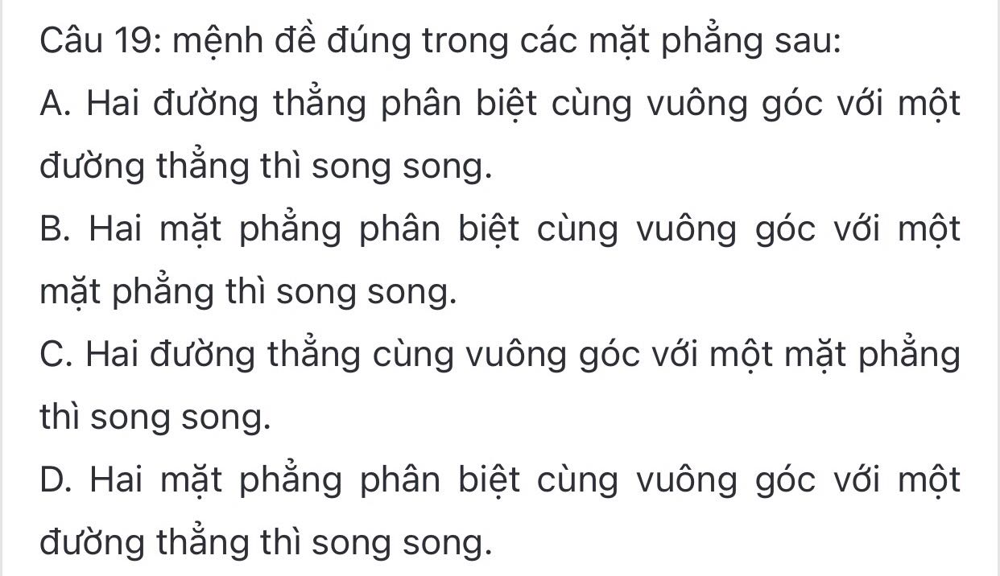

-- Number of question_words: 82


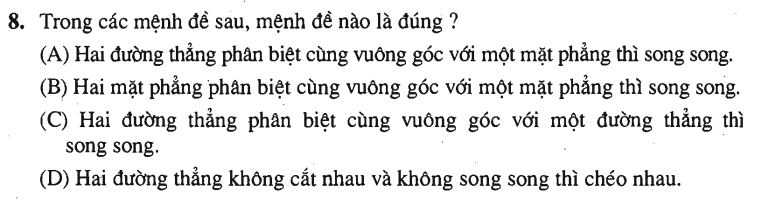

************

INDEX: 508 - Cosine score: 0.9537550421226626, SE_output: POSITIVE
------------ Jaccard score: 0.6521739130434783
-- Number of lookup_words: 90


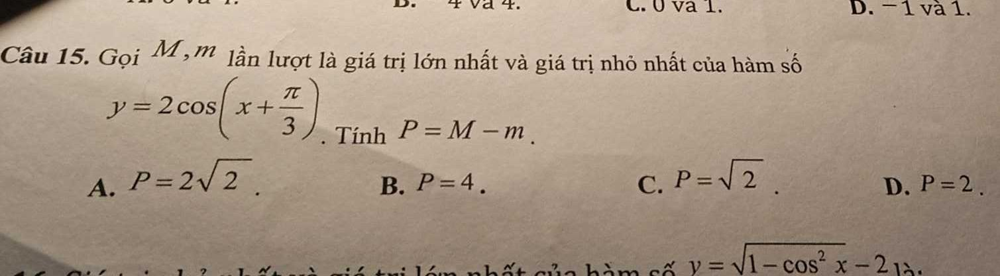

-- Number of question_words: 85


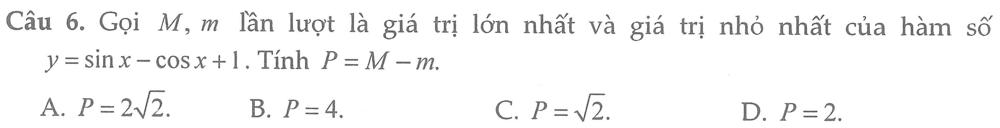

************

INDEX: 492 - Cosine score: 0.9508637614211908, SE_output: NEGATIVE
------------ Jaccard score: 0.7111111111111111
-- Number of lookup_words: 148


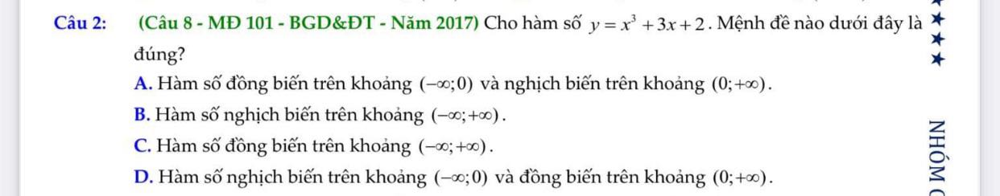

-- Number of question_words: 98


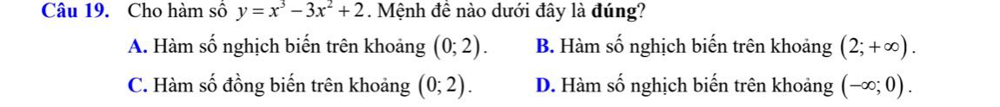

************

INDEX: 868 - Cosine score: 0.9498958138890585, SE_output: POSITIVE
------------ Jaccard score: 0.35714285714285715
-- Number of lookup_words: 16


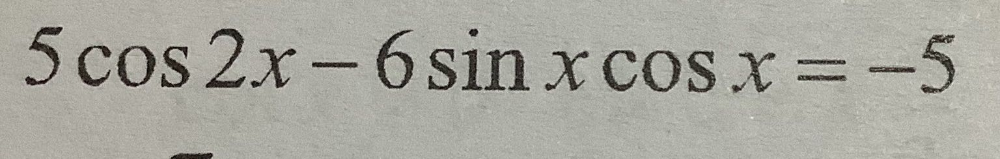

-- Number of question_words: 16


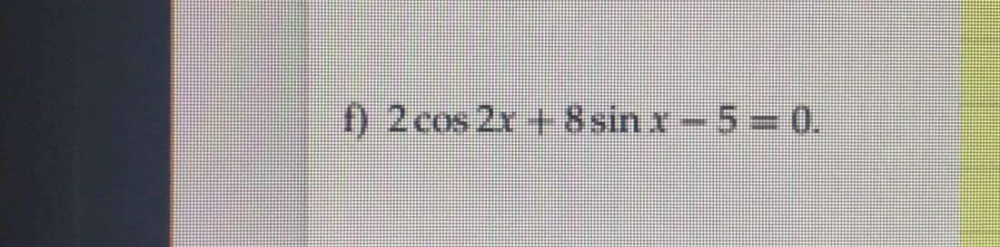

************

INDEX: 102 - Cosine score: 0.9481217450696948, SE_output: POSITIVE
------------ Jaccard score: 0.5
-- Number of lookup_words: 33


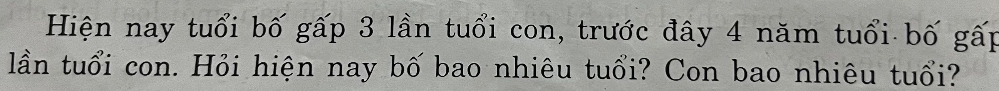

-- Number of question_words: 45


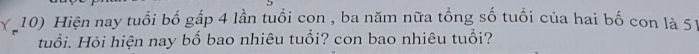

************

INDEX: 491 - Cosine score: 0.9478534318588357, SE_output: POSITIVE
------------ Jaccard score: 0.8
-- Number of lookup_words: 103


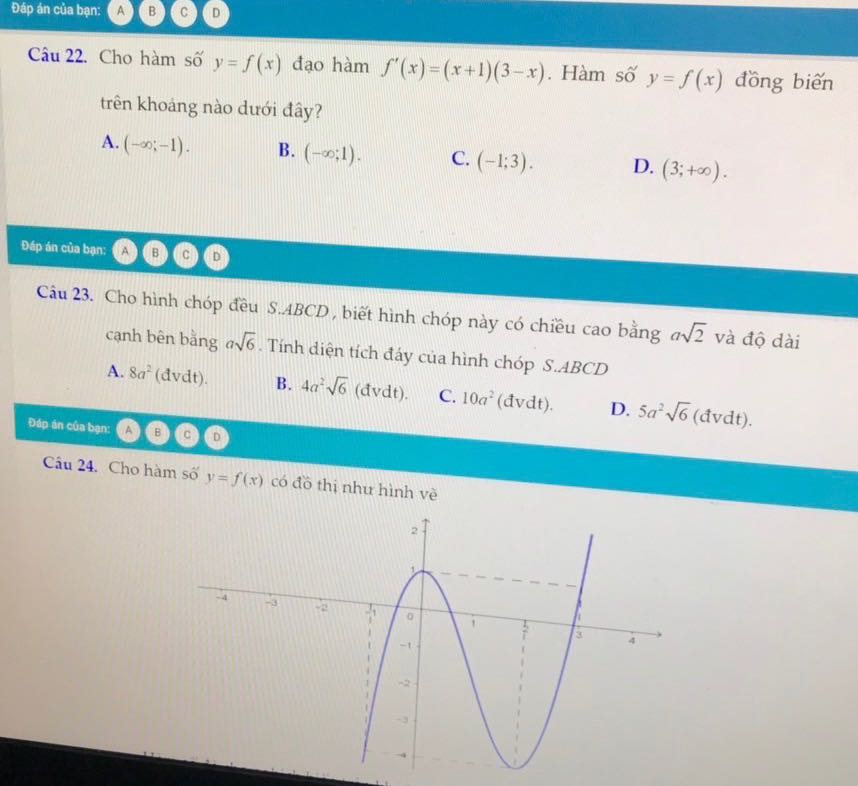

-- Number of question_words: 109


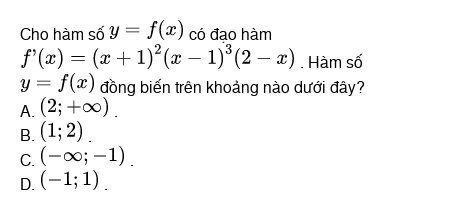

************

INDEX: 718 - Cosine score: 0.9471249730426237, SE_output: NEGATIVE
------------ Jaccard score: 0.45
-- Number of lookup_words: 113


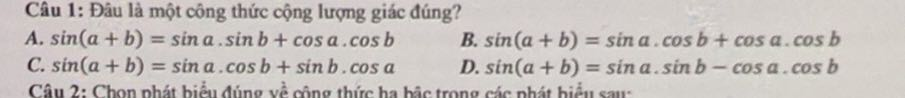

-- Number of question_words: 114


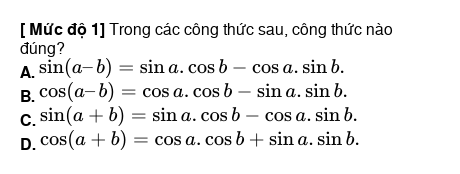

************

INDEX: 1402 - Cosine score: 0.9469786746146958, SE_output: POSITIVE
------------ Jaccard score: 0.5454545454545454
-- Number of lookup_words: 9


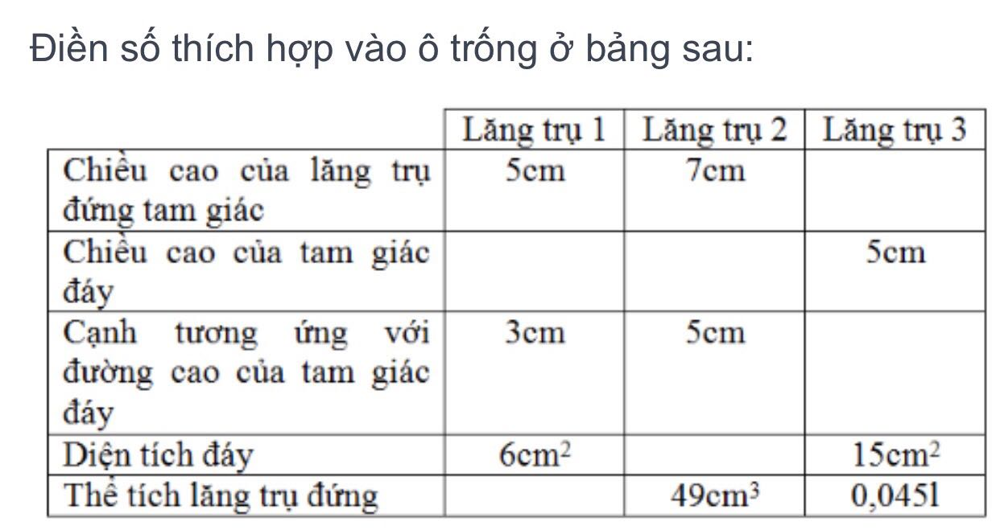

-- Number of question_words: 8


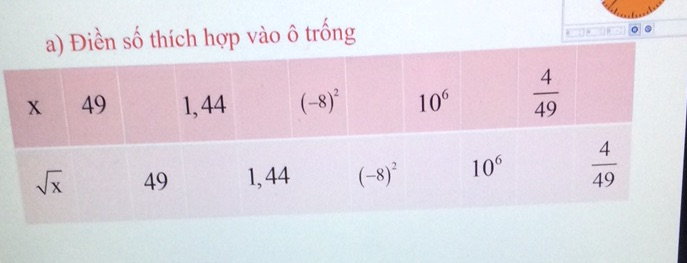

************

INDEX: 1525 - Cosine score: 0.9433662562476951, SE_output: POSITIVE
------------ Jaccard score: 0.6666666666666666
-- Number of lookup_words: 45


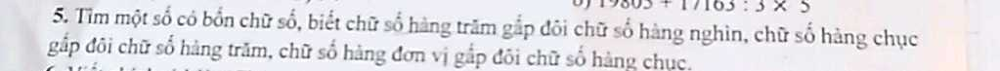

-- Number of question_words: 48


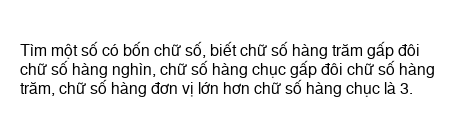

************

INDEX: 1367 - Cosine score: 0.9410909969574635, SE_output: NEGATIVE
------------ Jaccard score: 0.2857142857142857
-- Number of lookup_words: 25


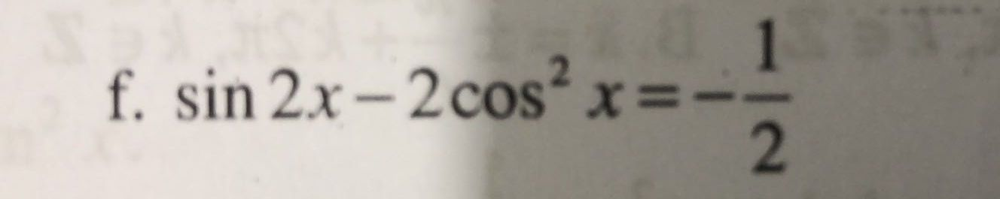

-- Number of question_words: 106


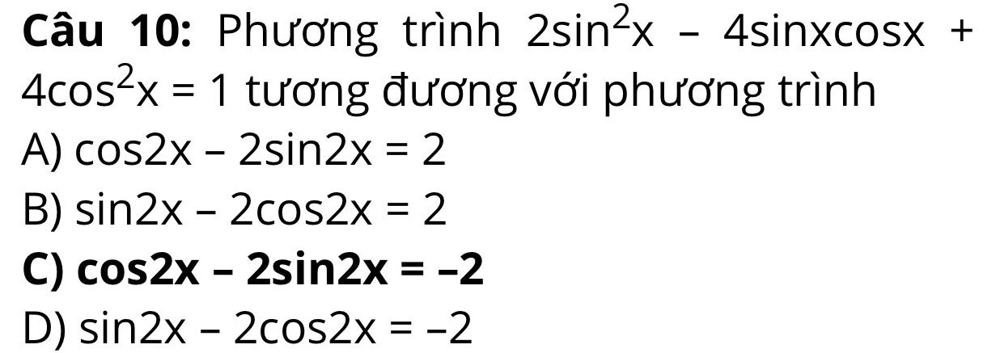

************

INDEX: 1150 - Cosine score: 0.9285798182791942, SE_output: NEGATIVE
------------ Jaccard score: 0.5384615384615384
-- Number of lookup_words: 33


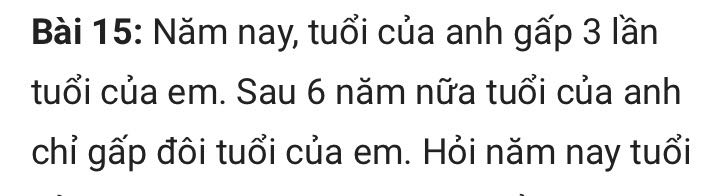

-- Number of question_words: 39


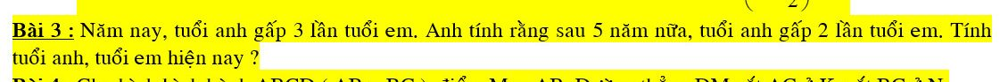

************

INDEX: 824 - Cosine score: 0.9202696061842707, SE_output: NEGATIVE
------------ Jaccard score: 0.5714285714285714
-- Number of lookup_words: 176


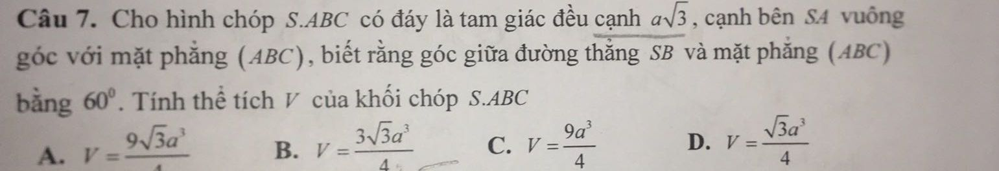

-- Number of question_words: 132


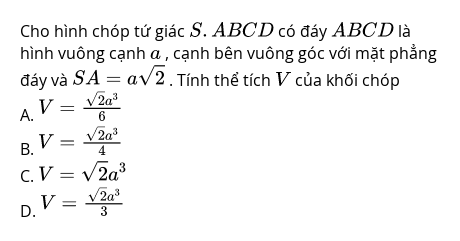

************

INDEX: 918 - Cosine score: 0.9111380610079594, SE_output: NEGATIVE
------------ Jaccard score: 0.43333333333333335
-- Number of lookup_words: 48


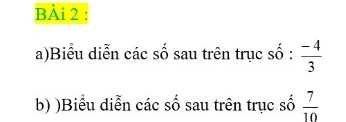

-- Number of question_words: 71


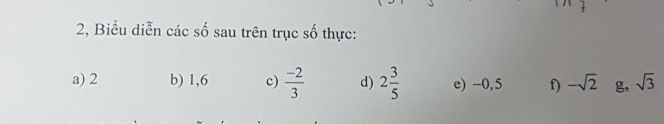

************

INDEX: 1539 - Cosine score: 0.9110548805898008, SE_output: NEGATIVE
------------ Jaccard score: 0.46875
-- Number of lookup_words: 36


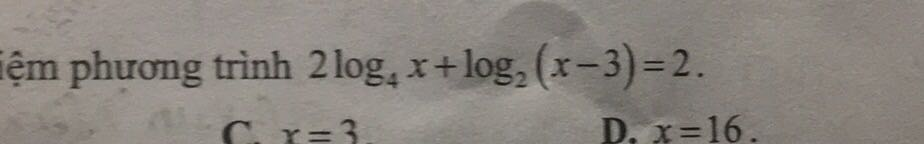

-- Number of question_words: 79


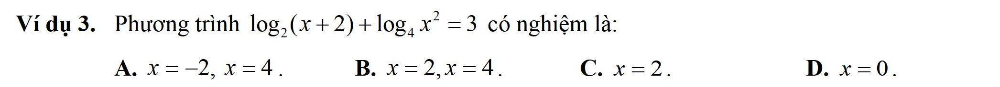

************

INDEX: 1653 - Cosine score: 0.9109310673951136, SE_output: NEGATIVE
------------ Jaccard score: 0.5178571428571429
-- Number of lookup_words: 215


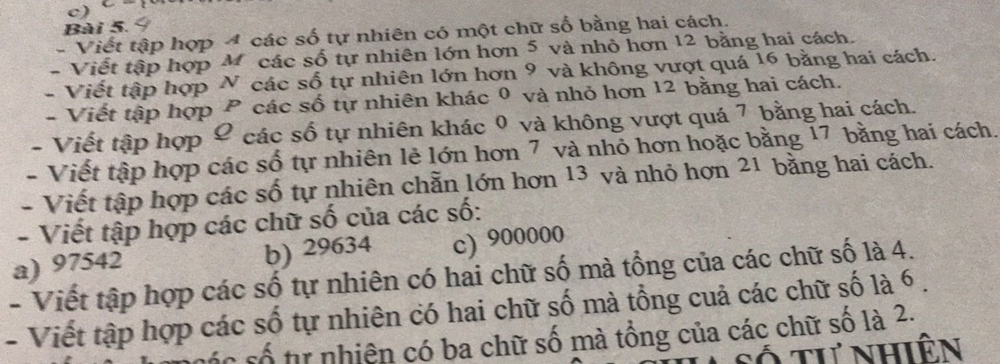

-- Number of question_words: 73


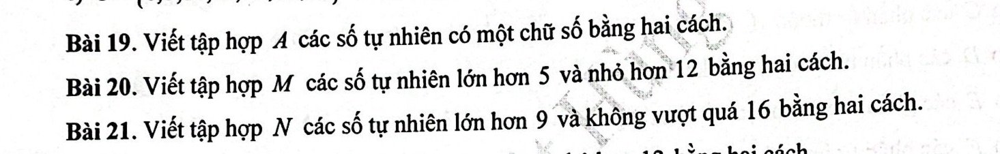

************

INDEX: 1097 - Cosine score: 0.9094377230735939, SE_output: NEGATIVE
------------ Jaccard score: 0.5555555555555556
-- Number of lookup_words: 60


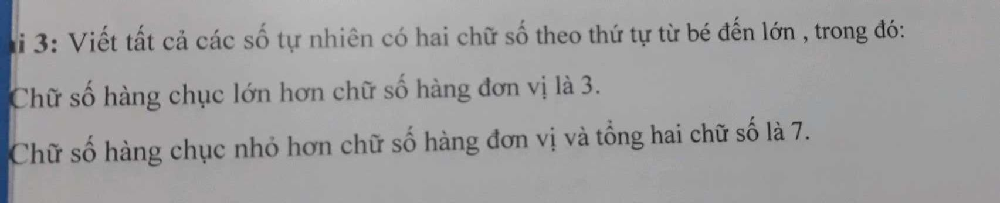

-- Number of question_words: 74


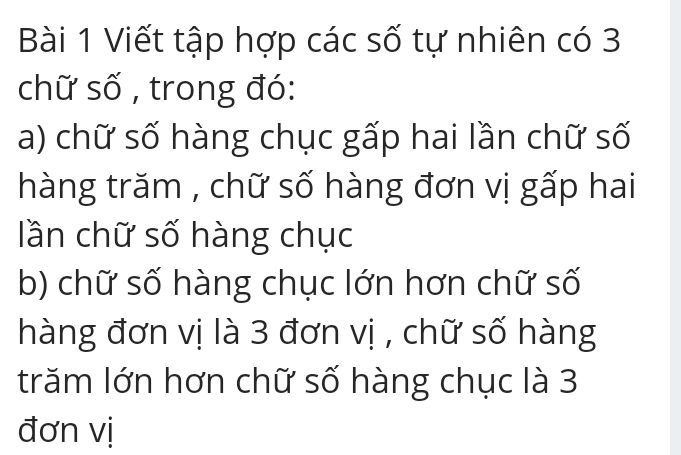

************

INDEX: 1027 - Cosine score: 0.9093553841371969, SE_output: NEGATIVE
------------ Jaccard score: 0.6122448979591837
-- Number of lookup_words: 253


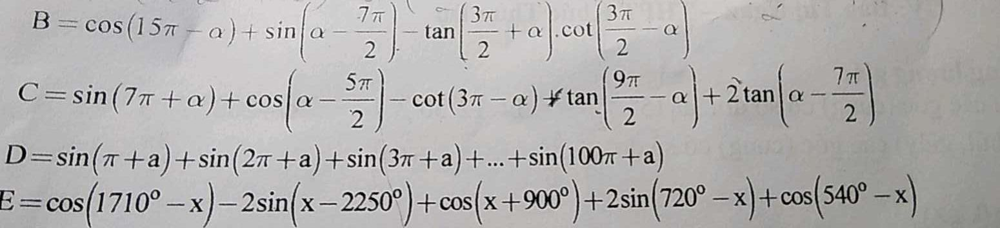

-- Number of question_words: 299


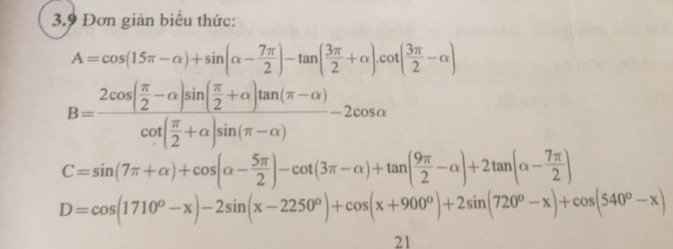

************

INDEX: 1417 - Cosine score: 0.9023371971563203, SE_output: NEGATIVE
------------ Jaccard score: 0.5294117647058824
-- Number of lookup_words: 43


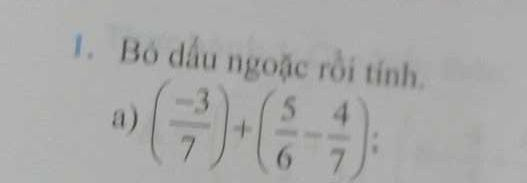

-- Number of question_words: 42


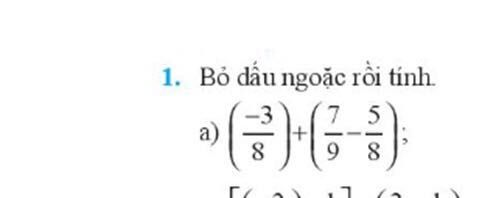

************

INDEX: 602 - Cosine score: 0.9010928113990462, SE_output: NEGATIVE
------------ Jaccard score: 0.2978723404255319
-- Number of lookup_words: 117


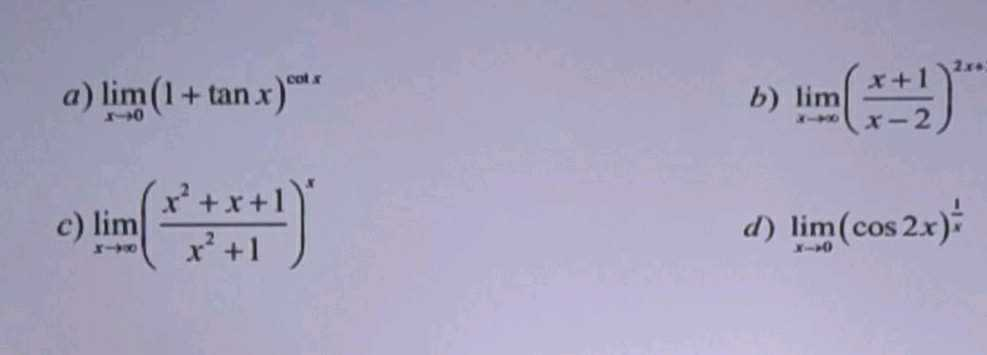

-- Number of question_words: 201


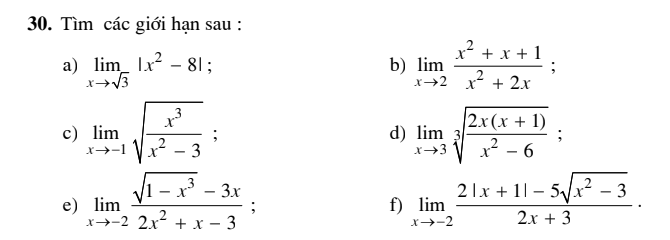

************

INDEX: 391 - Cosine score: 0.8977299233462854, SE_output: POSITIVE
------------ Jaccard score: 0.7674418604651163
-- Number of lookup_words: 120


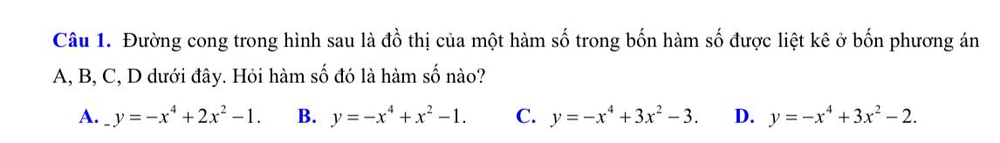

-- Number of question_words: 122


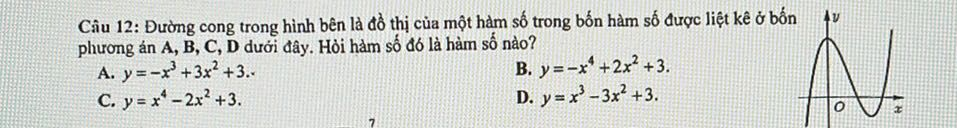

************

INDEX: 262 - Cosine score: 0.8952183277554893, SE_output: NEGATIVE
------------ Jaccard score: 0.6153846153846154
-- Number of lookup_words: 36


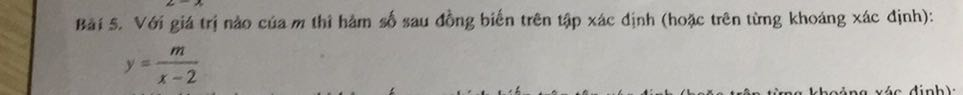

-- Number of question_words: 64


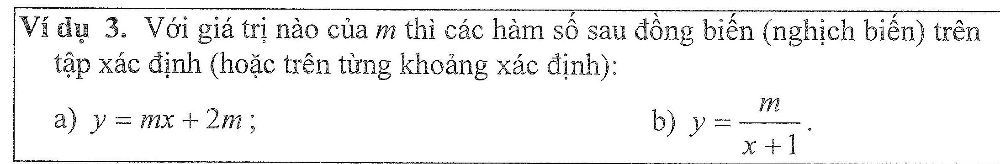

************

INDEX: 1523 - Cosine score: 0.8876635137268469, SE_output: POSITIVE
------------ Jaccard score: 0.4
-- Number of lookup_words: 10


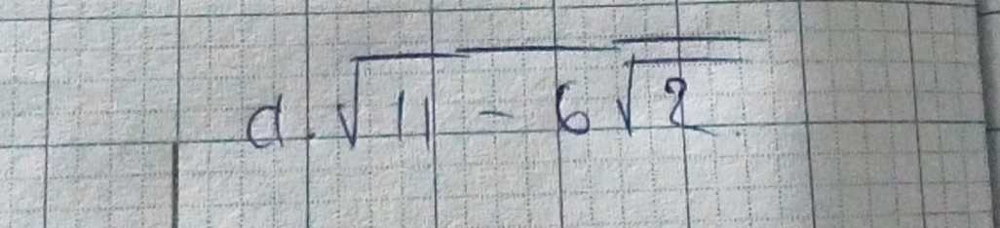

-- Number of question_words: 16


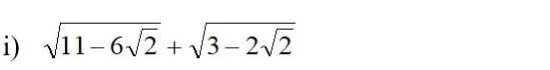

************

INDEX: 1148 - Cosine score: 0.8863893555366693, SE_output: NEGATIVE
------------ Jaccard score: 0.5681818181818182
-- Number of lookup_words: 101


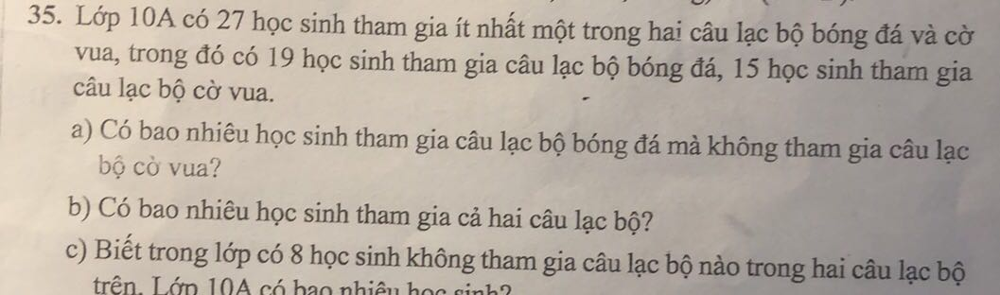

-- Number of question_words: 131


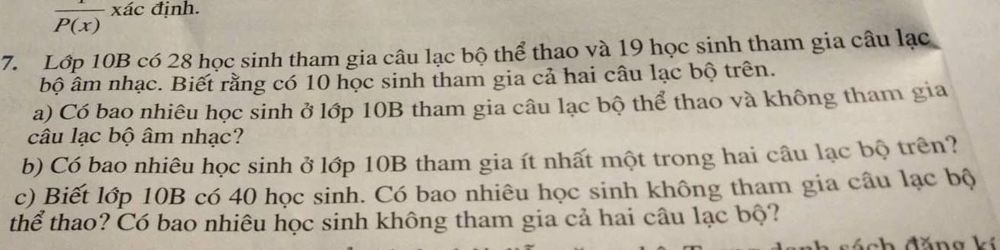

************

INDEX: 486 - Cosine score: 0.8849668049943329, SE_output: POSITIVE
------------ Jaccard score: 0.7222222222222222
-- Number of lookup_words: 25


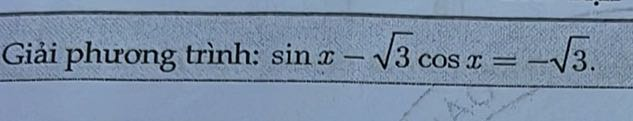

-- Number of question_words: 26


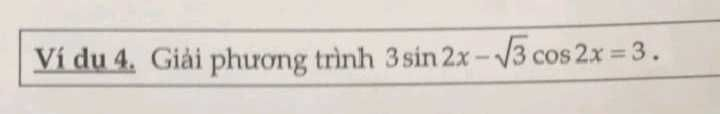

************

INDEX: 1227 - Cosine score: 0.8843543182539748, SE_output: NEGATIVE
------------ Jaccard score: 0.5849056603773585
-- Number of lookup_words: 120


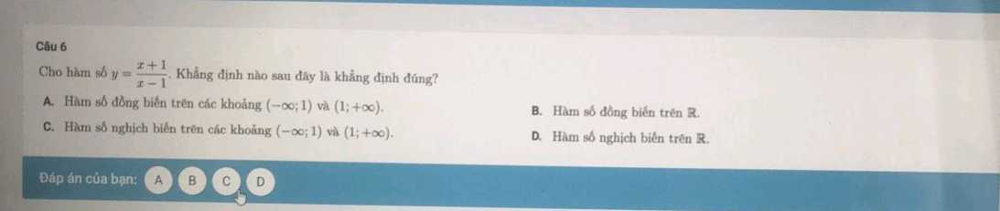

-- Number of question_words: 106


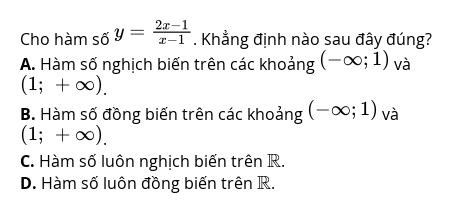

************

INDEX: 1445 - Cosine score: 0.880667327921936, SE_output: NEGATIVE
------------ Jaccard score: 0.46153846153846156
-- Number of lookup_words: 105


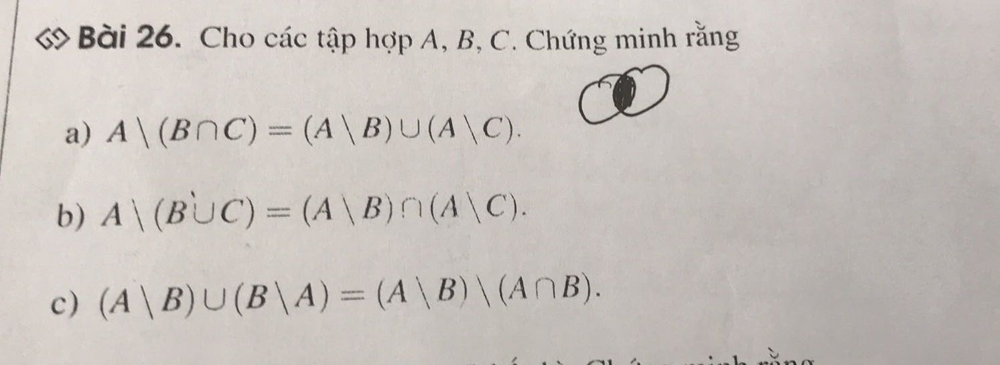

-- Number of question_words: 93


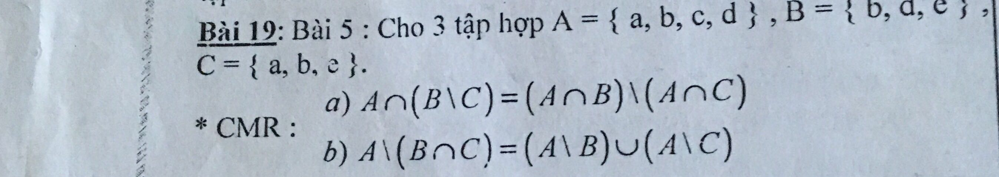

************

INDEX: 678 - Cosine score: 0.8777404718537651, SE_output: NEGATIVE
------------ Jaccard score: 0.3
-- Number of lookup_words: 40


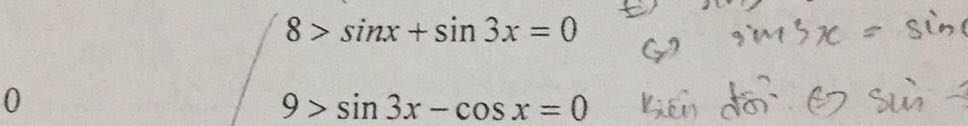

-- Number of question_words: 99


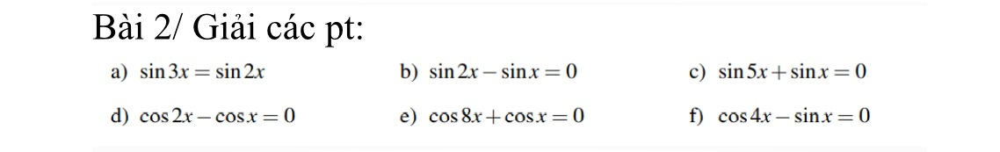

************

INDEX: 422 - Cosine score: 0.8776575318161374, SE_output: NEGATIVE
------------ Jaccard score: 0.3870967741935484
-- Number of lookup_words: 100


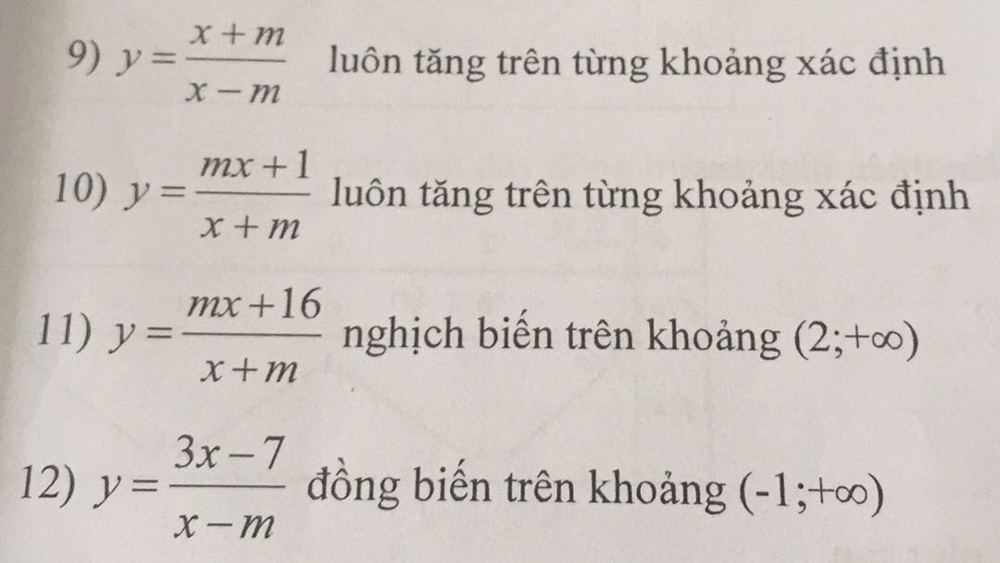

-- Number of question_words: 212


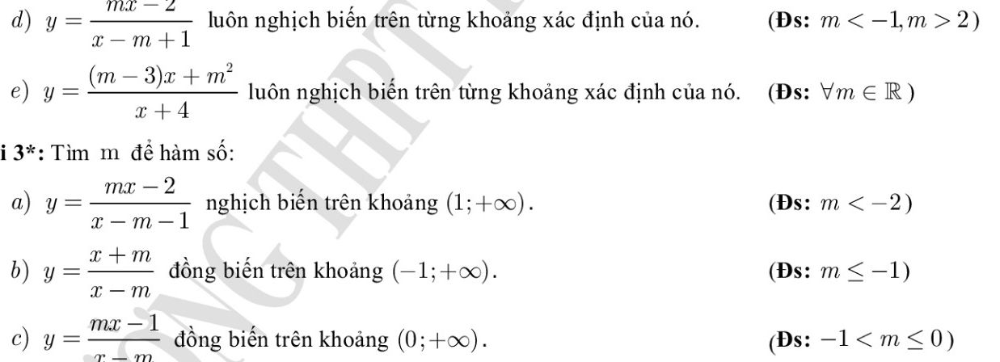

************

INDEX: 1455 - Cosine score: 0.8753393778439789, SE_output: NEGATIVE
------------ Jaccard score: 0.5483870967741935
-- Number of lookup_words: 691


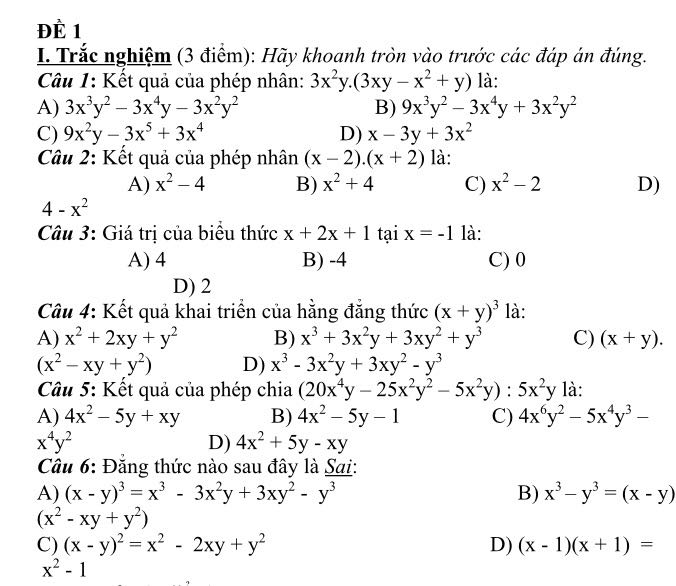

-- Number of question_words: 647


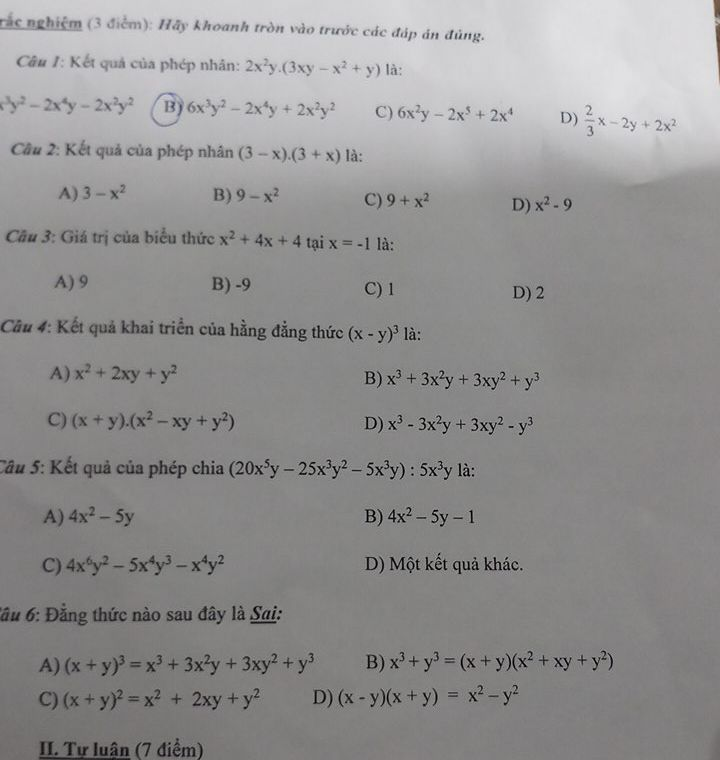

************

INDEX: 1691 - Cosine score: 0.8702223122031686, SE_output: NEGATIVE
------------ Jaccard score: 0.6451612903225806
-- Number of lookup_words: 62


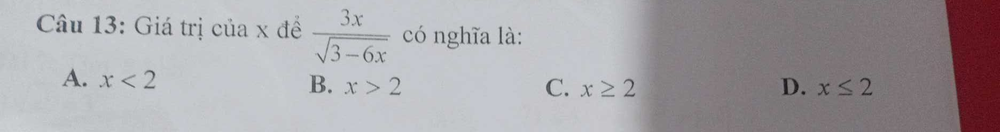

-- Number of question_words: 66


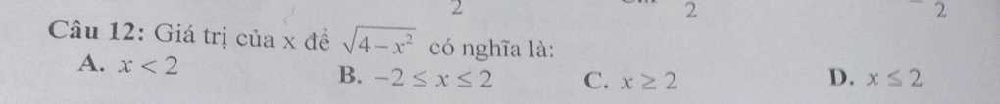

************

INDEX: 1055 - Cosine score: 0.8695314486939596, SE_output: POSITIVE
------------ Jaccard score: 0.7142857142857143
-- Number of lookup_words: 12


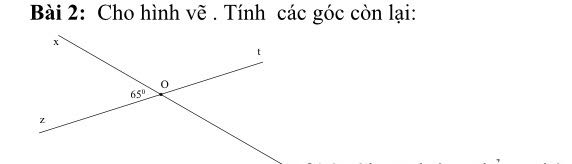

-- Number of question_words: 15


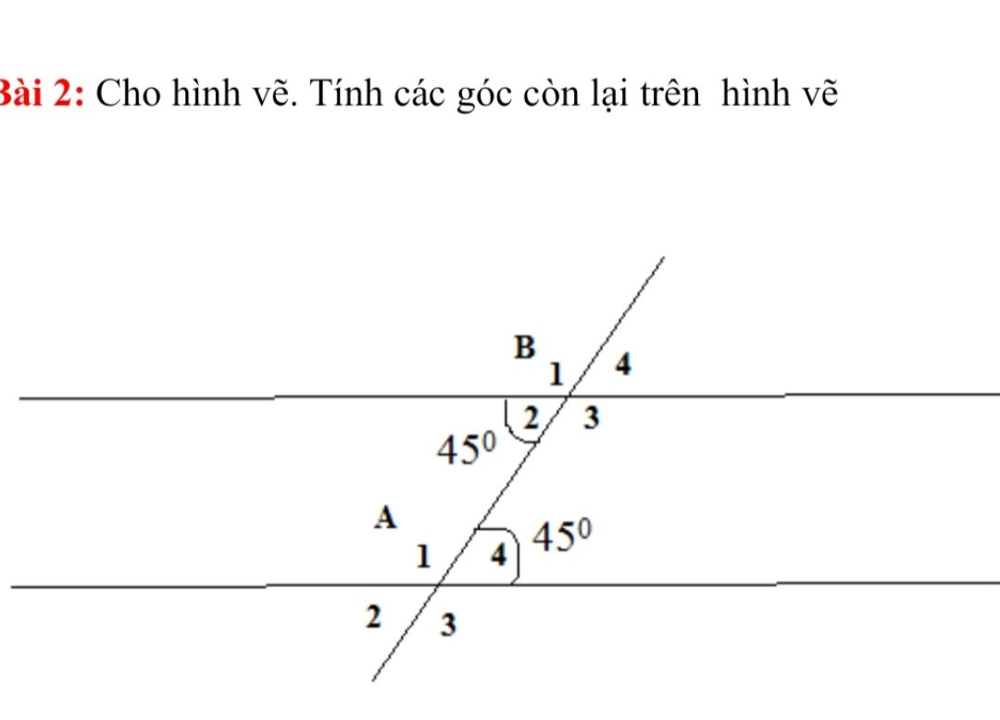

************

INDEX: 273 - Cosine score: 0.868501896337961, SE_output: NEGATIVE
------------ Jaccard score: 0.5121951219512195
-- Number of lookup_words: 82


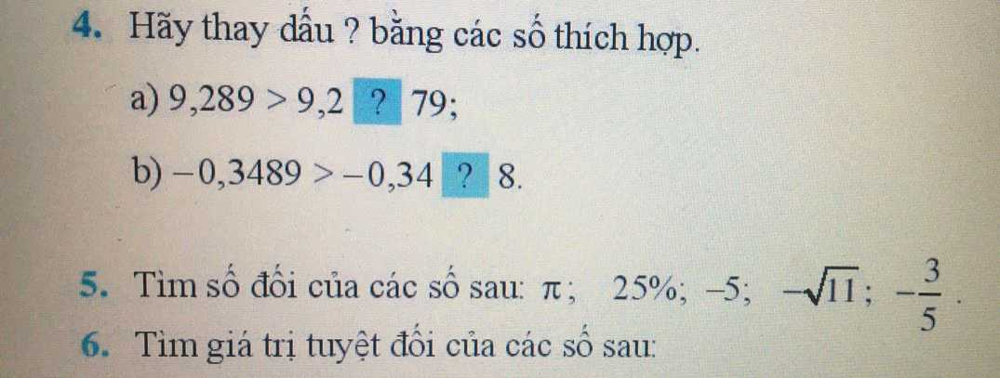

-- Number of question_words: 31


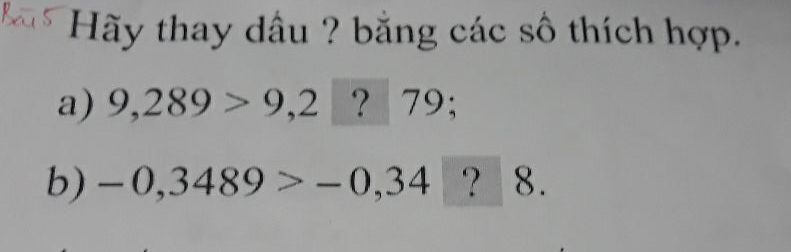

************

INDEX: 712 - Cosine score: 0.8682749977082218, SE_output: NEGATIVE
------------ Jaccard score: 0.7
-- Number of lookup_words: 91


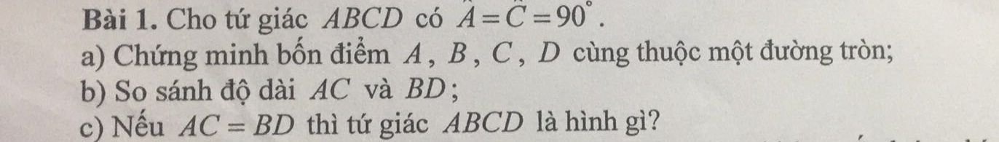

-- Number of question_words: 74


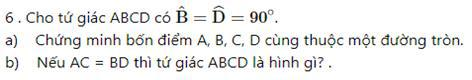

************

INDEX: 699 - Cosine score: 0.8679159738248566, SE_output: POSITIVE
------------ Jaccard score: 0.8
-- Number of lookup_words: 24


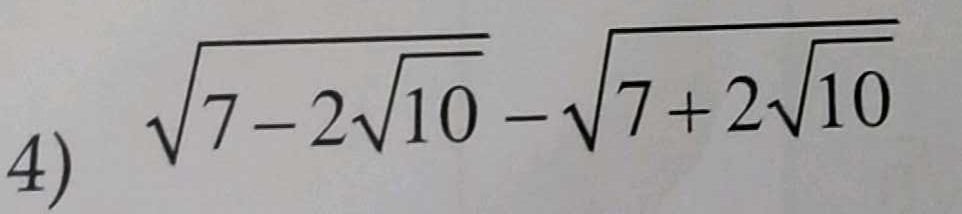

-- Number of question_words: 26


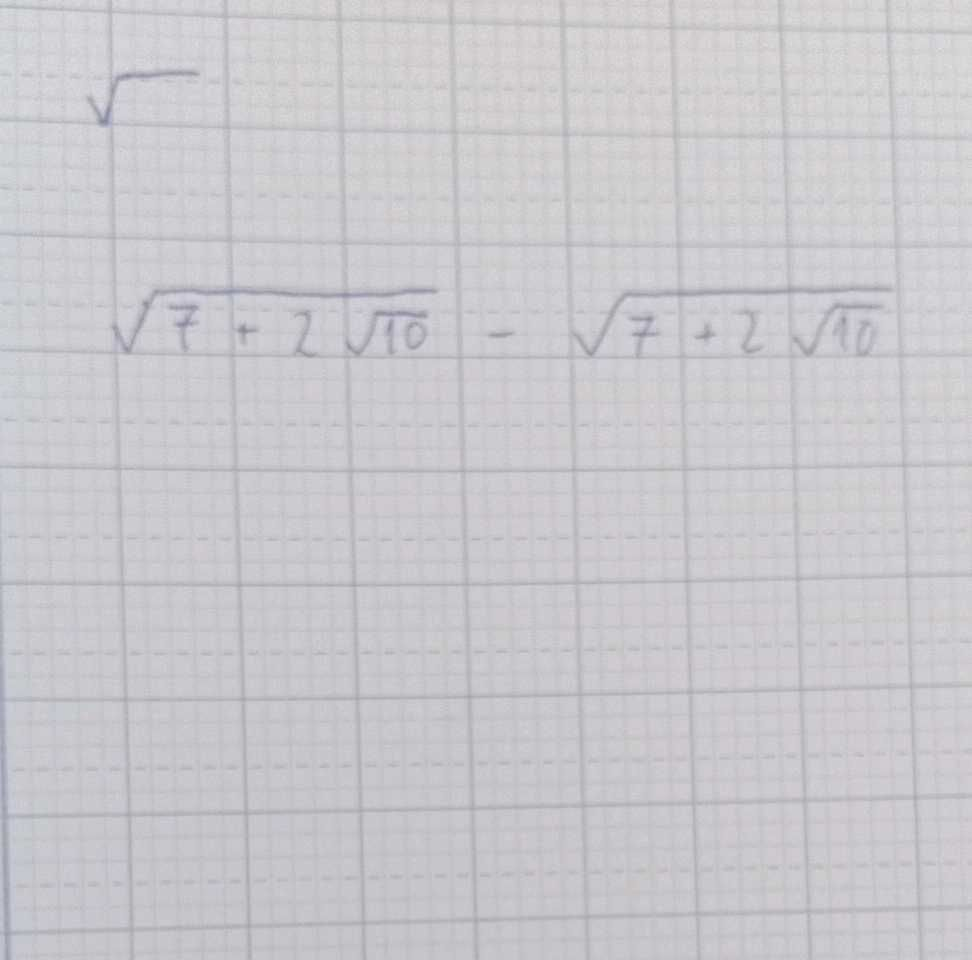

************

INDEX: 1281 - Cosine score: 0.8674372504737459, SE_output: NEGATIVE
------------ Jaccard score: 0.36486486486486486
-- Number of lookup_words: 312


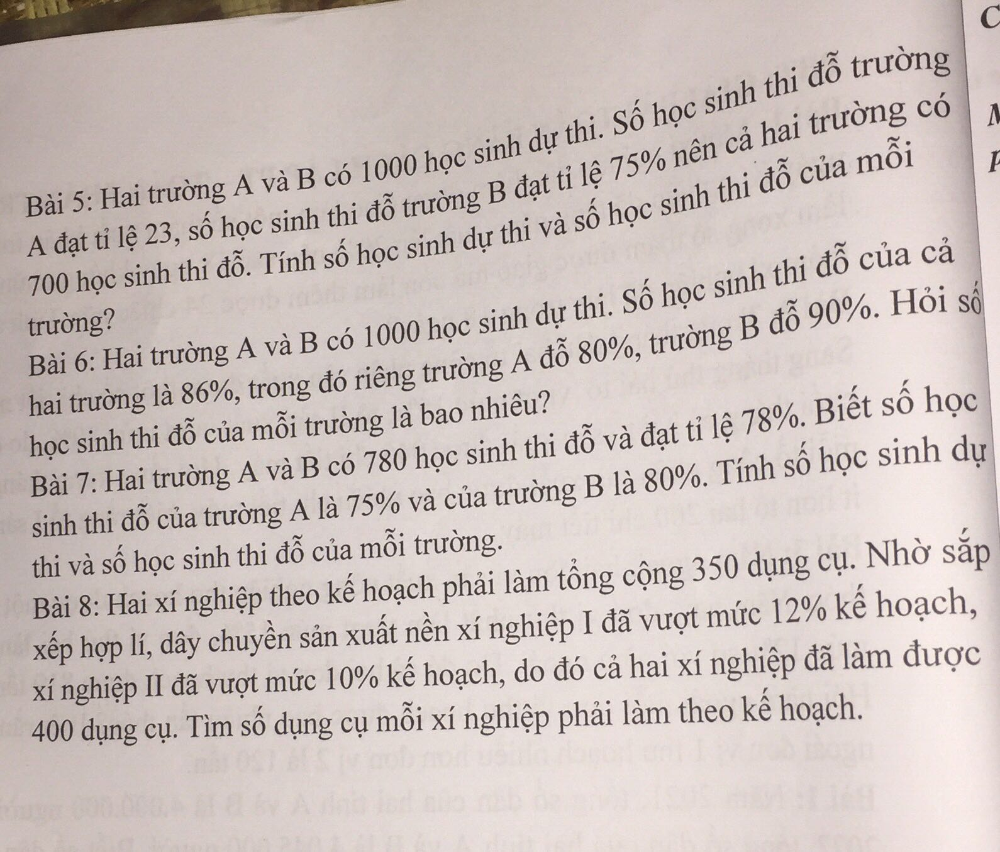

-- Number of question_words: 80


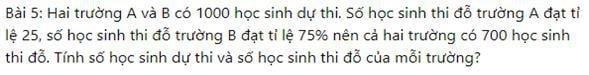

************

INDEX: 792 - Cosine score: 0.8652971726727505, SE_output: POSITIVE
------------ Jaccard score: 0.6666666666666666
-- Number of lookup_words: 34


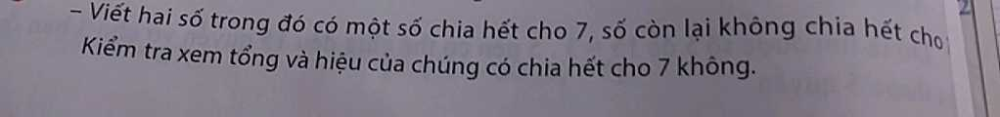

-- Number of question_words: 35


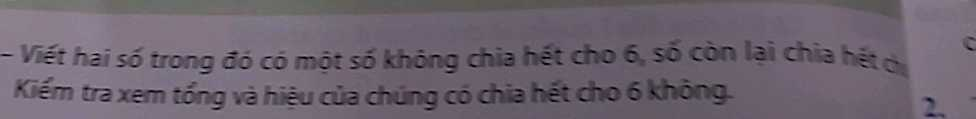

************

INDEX: 791 - Cosine score: 0.8647526641586218, SE_output: NEGATIVE
------------ Jaccard score: 0.358974358974359
-- Number of lookup_words: 34


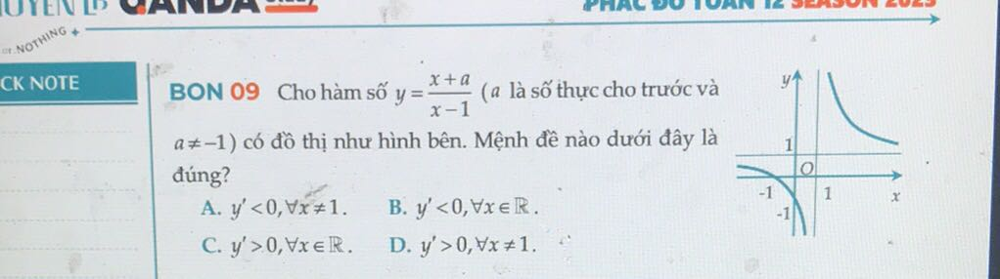

-- Number of question_words: 114


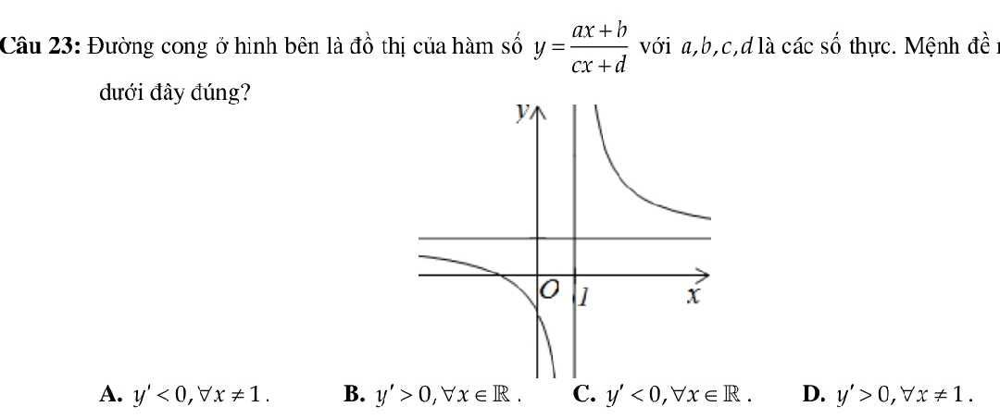

************

INDEX: 1754 - Cosine score: 0.8637520857783401, SE_output: NEGATIVE
------------ Jaccard score: 0.5263157894736842
-- Number of lookup_words: 131


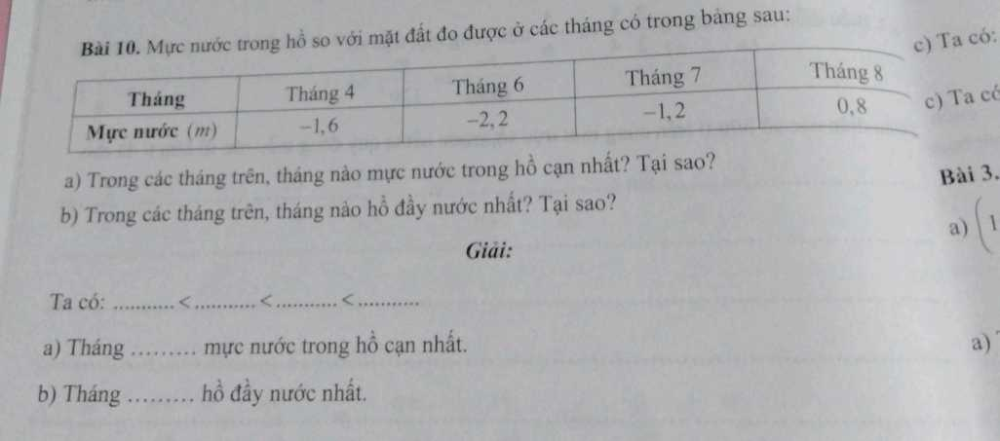

-- Number of question_words: 124


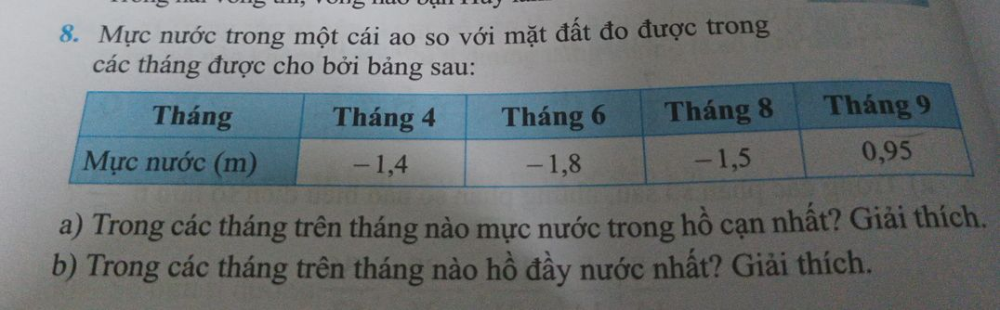

************

INDEX: 221 - Cosine score: 0.8636130314730479, SE_output: NEGATIVE
------------ Jaccard score: 0.7105263157894737
-- Number of lookup_words: 50


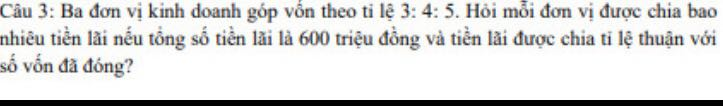

-- Number of question_words: 52


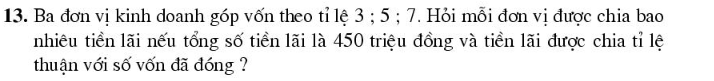

************

INDEX: 930 - Cosine score: 0.863260273526337, SE_output: NEGATIVE
------------ Jaccard score: 0.3181818181818182
-- Number of lookup_words: 63


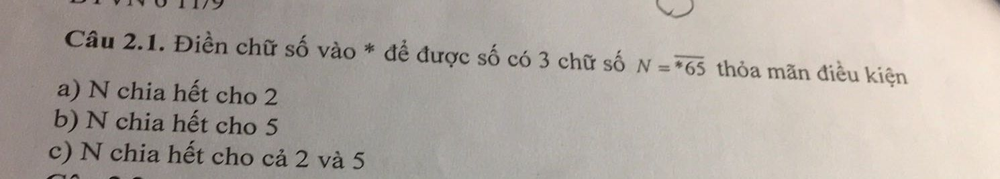

-- Number of question_words: 354


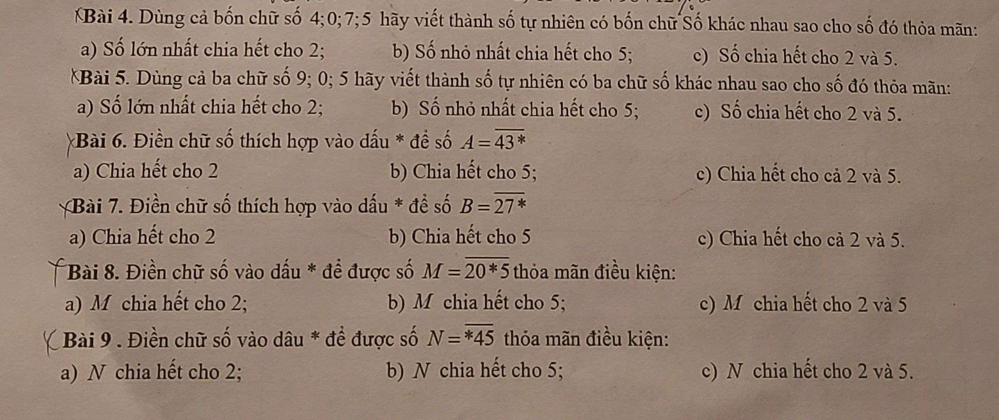

************

INDEX: 286 - Cosine score: 0.8623259549026057, SE_output: NEGATIVE
------------ Jaccard score: 0.35
-- Number of lookup_words: 22


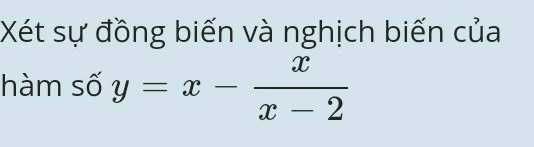

-- Number of question_words: 23


************

INDEX: 3 - Cosine score: 0.8582516081489169, SE_output: NEGATIVE
------------ Jaccard score: 0.7192982456140351
-- Number of lookup_words: 127


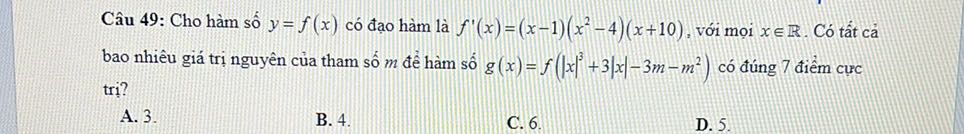

-- Number of question_words: 122


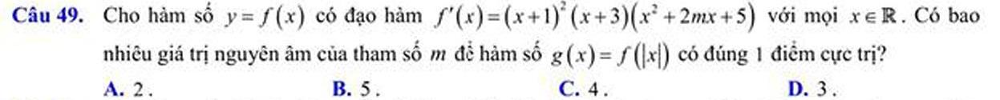

************

INDEX: 1012 - Cosine score: 0.8550005997246389, SE_output: POSITIVE
------------ Jaccard score: 0.5217391304347826
-- Number of lookup_words: 109


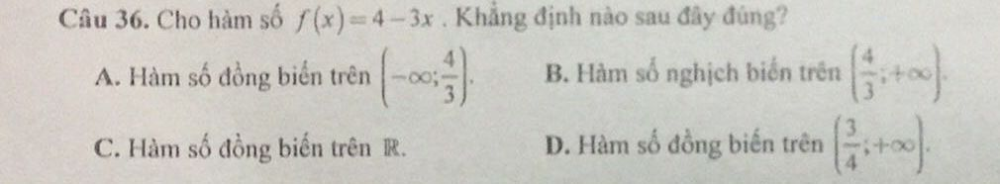

-- Number of question_words: 117


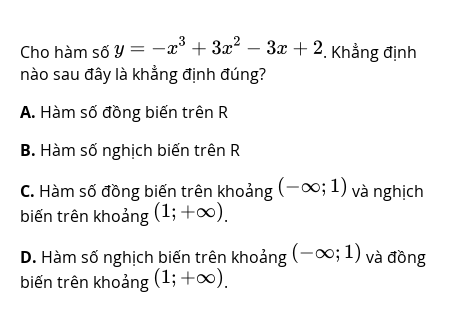

************

INDEX: 980 - Cosine score: 0.8548791878379602, SE_output: NEGATIVE
------------ Jaccard score: 0.5306122448979592
-- Number of lookup_words: 95


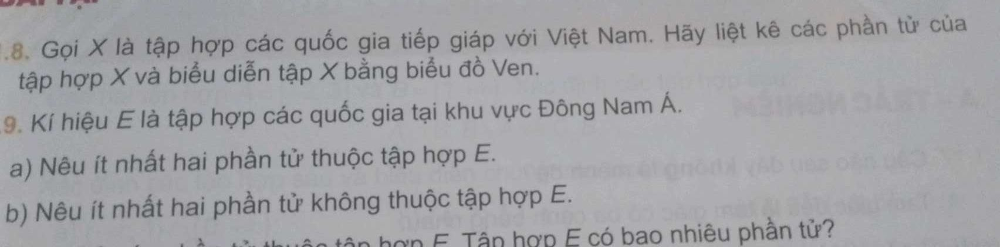

-- Number of question_words: 70


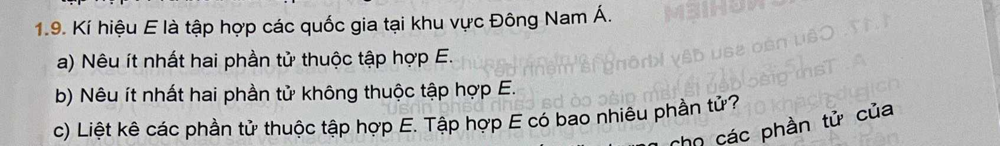

************

INDEX: 377 - Cosine score: 0.8493020816077116, SE_output: NEGATIVE
------------ Jaccard score: 0.34782608695652173
-- Number of lookup_words: 18


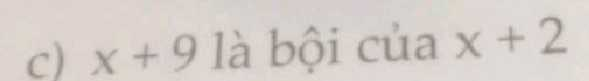

-- Number of question_words: 63


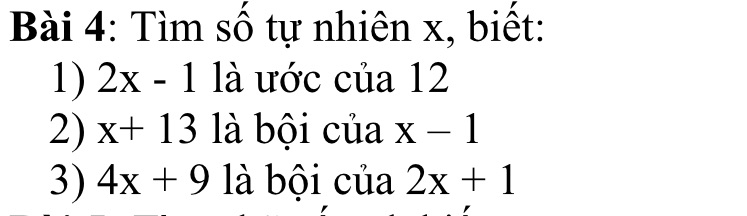

************

INDEX: 1604 - Cosine score: 0.8431047445876416, SE_output: NEGATIVE
------------ Jaccard score: 0.4888888888888889
-- Number of lookup_words: 125


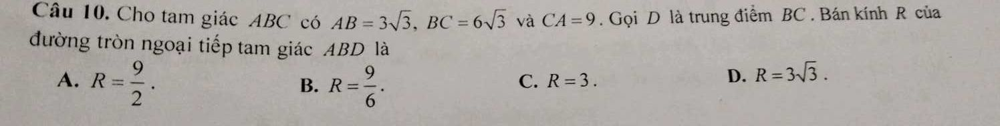

-- Number of question_words: 93


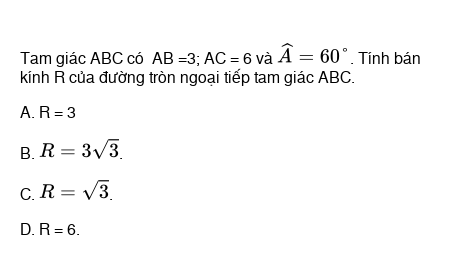

************

INDEX: 1687 - Cosine score: 0.8395318128120419, SE_output: NEGATIVE
------------ Jaccard score: 0.40476190476190477
-- Number of lookup_words: 102


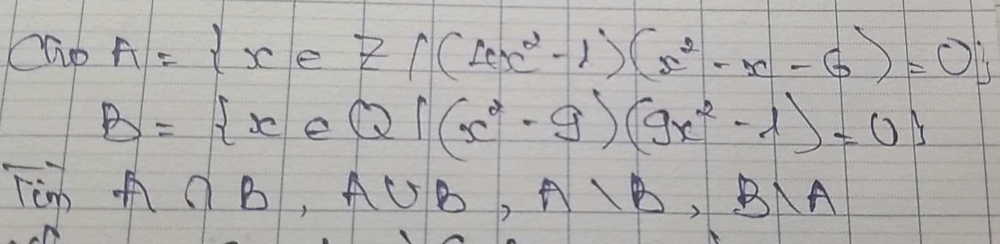

-- Number of question_words: 72


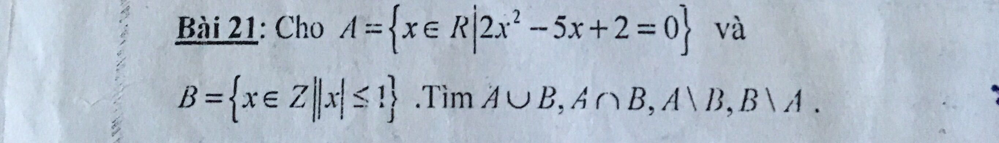

************

INDEX: 595 - Cosine score: 0.8371285877972217, SE_output: POSITIVE
------------ Jaccard score: 0.6938775510204082
-- Number of lookup_words: 151


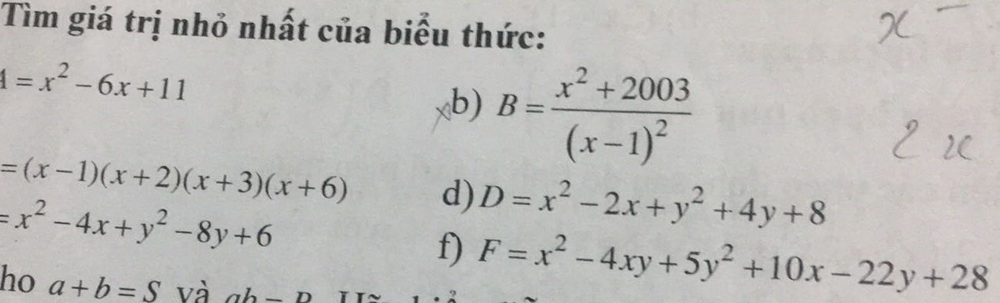

-- Number of question_words: 171


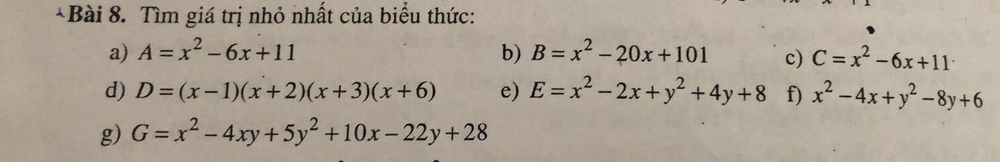

************

INDEX: 1718 - Cosine score: 0.8362684372489539, SE_output: NEGATIVE
------------ Jaccard score: 0.2923076923076923
-- Number of lookup_words: 230


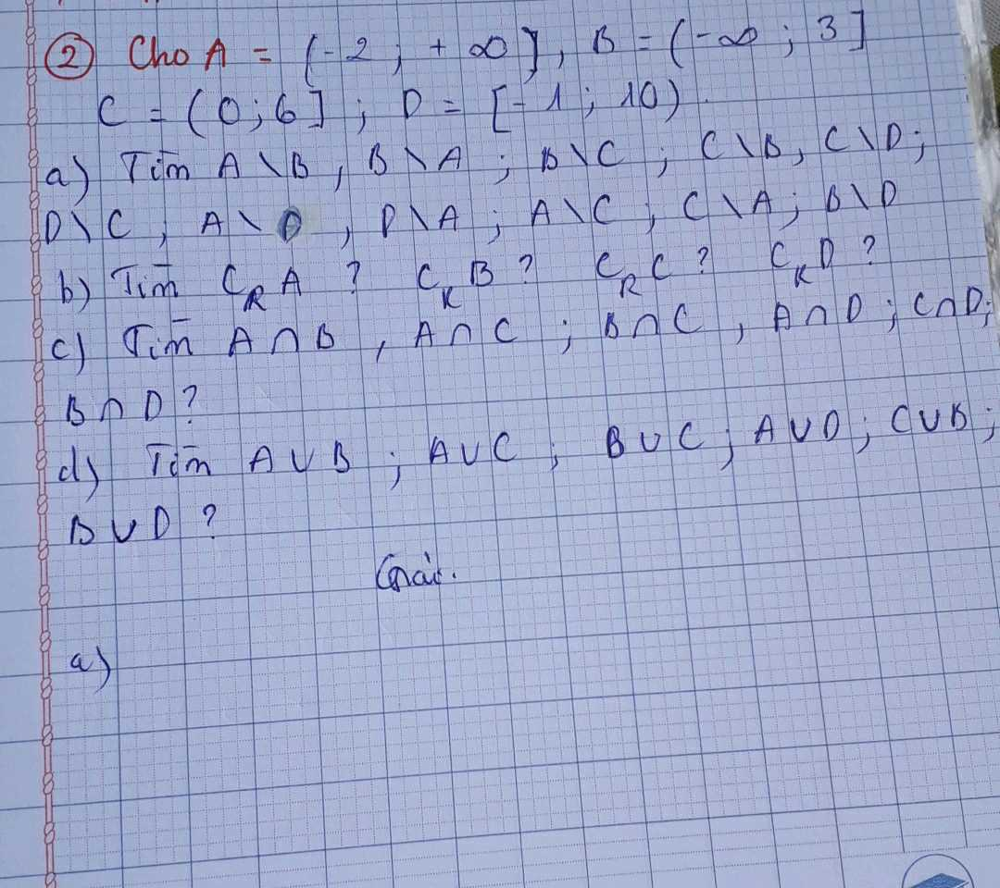

-- Number of question_words: 131


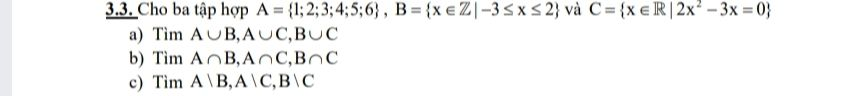

************

INDEX: 815 - Cosine score: 0.8360134995680294, SE_output: NEGATIVE
------------ Jaccard score: 0.45714285714285713
-- Number of lookup_words: 50


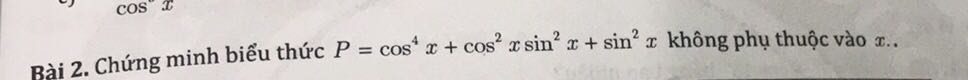

-- Number of question_words: 161


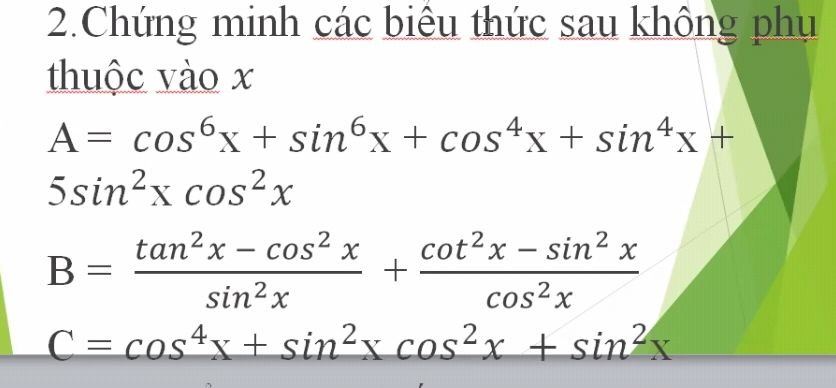

************

INDEX: 1178 - Cosine score: 0.8349502065770846, SE_output: POSITIVE
------------ Jaccard score: 0.6774193548387096
-- Number of lookup_words: 37


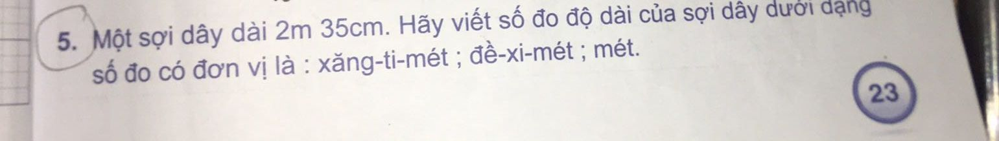

-- Number of question_words: 45


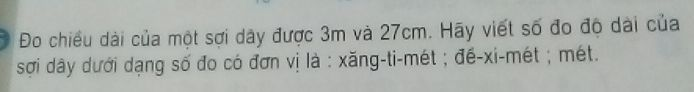

************

INDEX: 1839 - Cosine score: 0.8332200965203403, SE_output: NEGATIVE
------------ Jaccard score: 0.3333333333333333
-- Number of lookup_words: 35


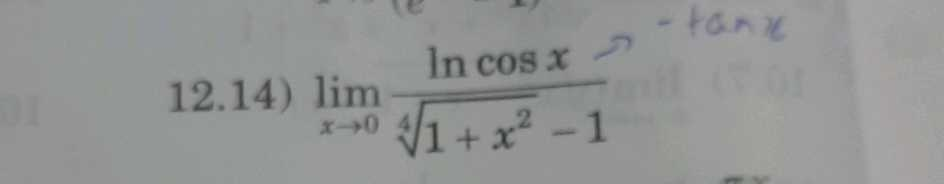

-- Number of question_words: 120


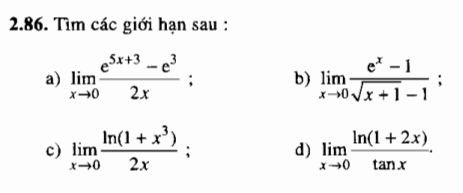

************

INDEX: 1747 - Cosine score: 0.8330518669068083, SE_output: NEGATIVE
------------ Jaccard score: 0.75
-- Number of lookup_words: 25


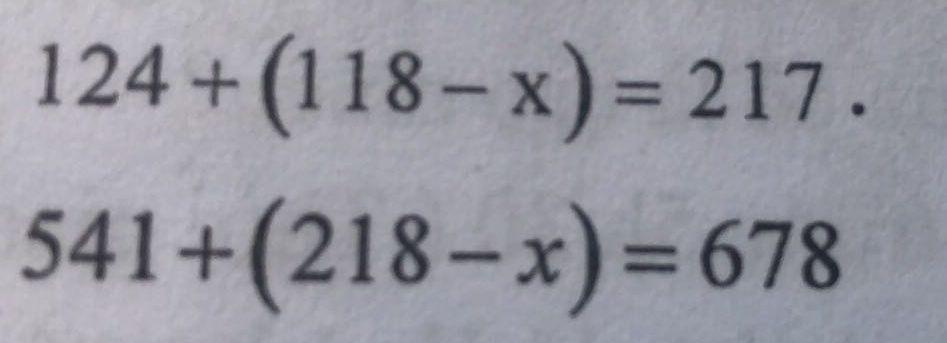

-- Number of question_words: 12


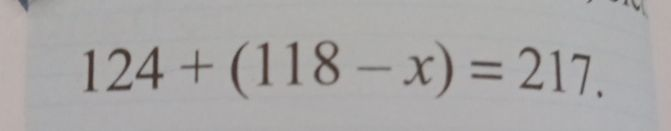

************

INDEX: 456 - Cosine score: 0.8305010035910337, SE_output: NEGATIVE
------------ Jaccard score: 0.4772727272727273
-- Number of lookup_words: 73


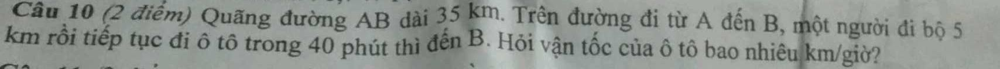

-- Number of question_words: 60


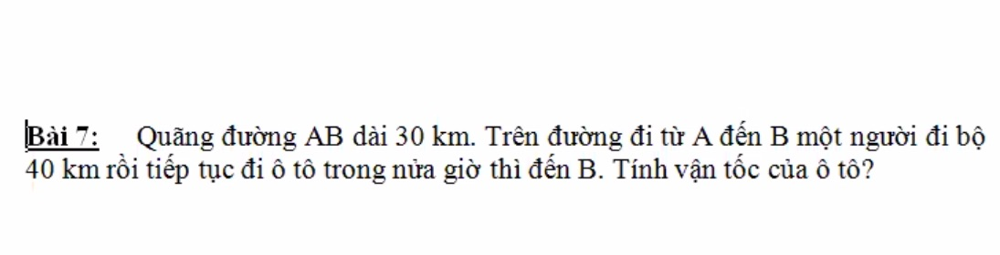

************

INDEX: 276 - Cosine score: 0.8301801614431895, SE_output: POSITIVE
------------ Jaccard score: 0.8333333333333334
-- Number of lookup_words: 79


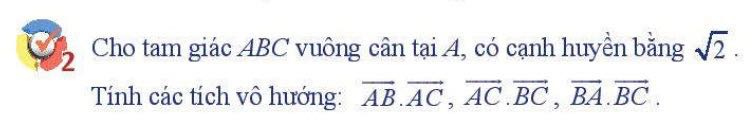

-- Number of question_words: 89


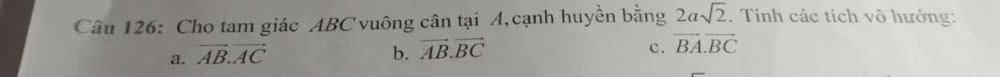

************

INDEX: 293 - Cosine score: 0.8259286183271837, SE_output: POSITIVE
------------ Jaccard score: 0.6470588235294118
-- Number of lookup_words: 61


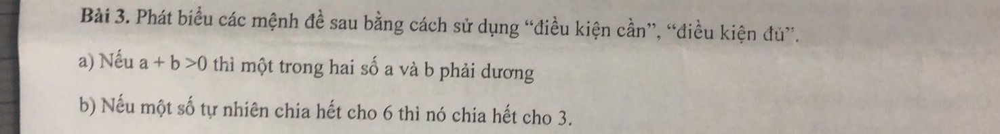

-- Number of question_words: 78


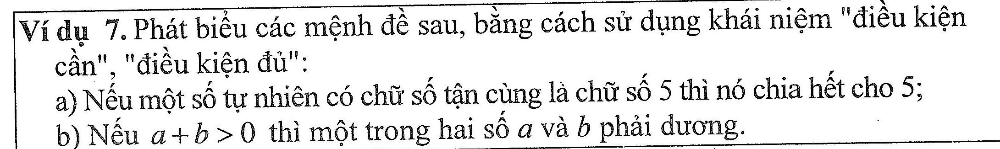

************

INDEX: 1560 - Cosine score: 0.8199377086610162, SE_output: NEGATIVE
------------ Jaccard score: 0.4368932038834951
-- Number of lookup_words: 1179


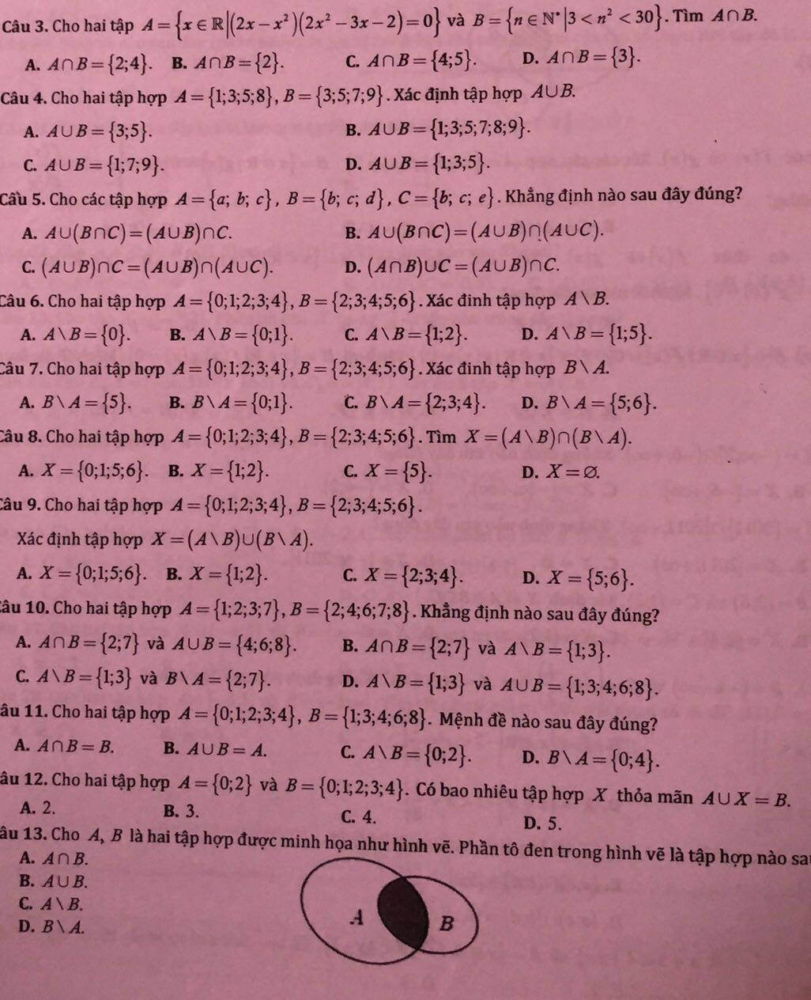

-- Number of question_words: 245


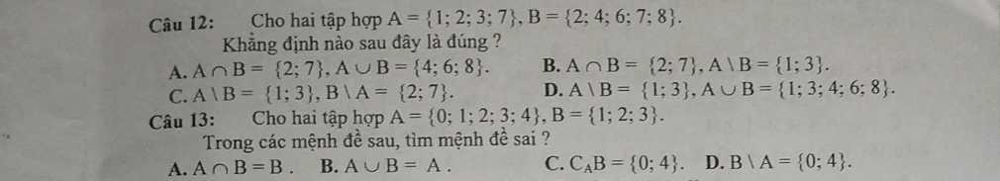

************

INDEX: 289 - Cosine score: 0.8190208301051922, SE_output: POSITIVE
------------ Jaccard score: 0.7073170731707317
-- Number of lookup_words: 87


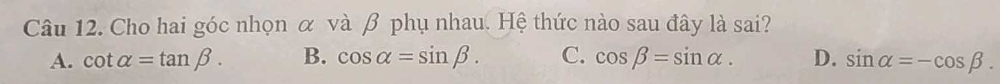

-- Number of question_words: 96


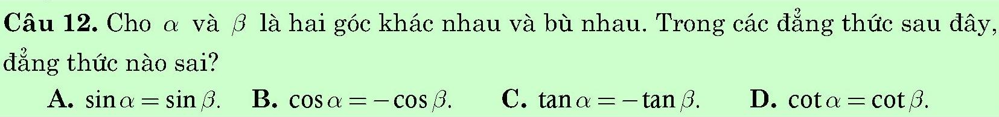

************

INDEX: 149 - Cosine score: 0.8167145822054716, SE_output: POSITIVE
------------ Jaccard score: 0.75
-- Number of lookup_words: 17


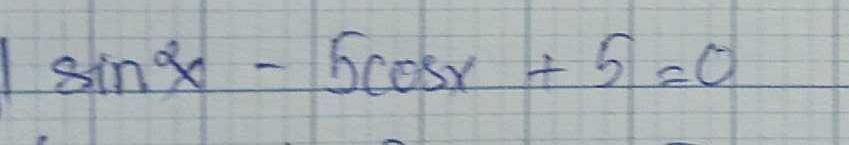

-- Number of question_words: 18


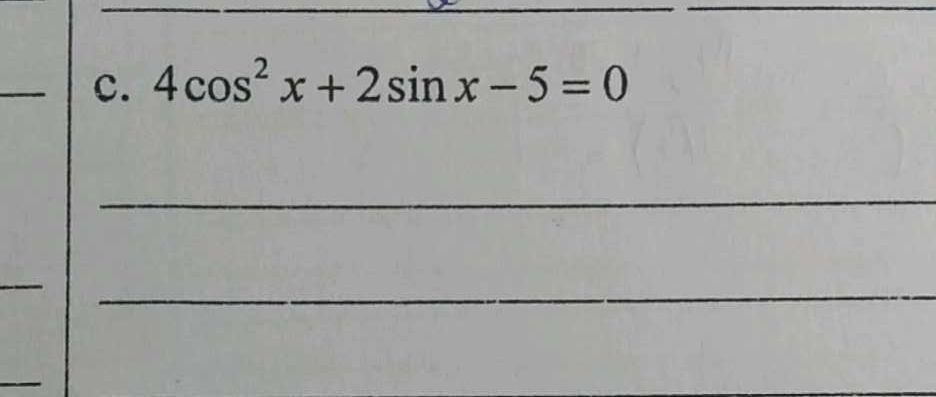

************

INDEX: 1262 - Cosine score: 0.8137807517269329, SE_output: NEGATIVE
------------ Jaccard score: 0.6470588235294118
-- Number of lookup_words: 56


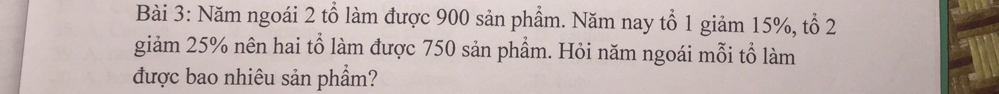

-- Number of question_words: 55


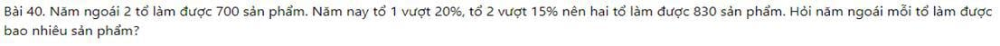

************

INDEX: 421 - Cosine score: 0.8123701935351508, SE_output: POSITIVE
------------ Jaccard score: 0.6153846153846154
-- Number of lookup_words: 14


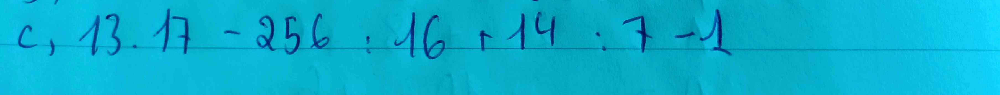

-- Number of question_words: 17


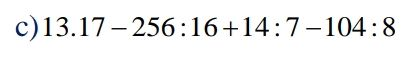

************

INDEX: 1528 - Cosine score: 0.8114538335396198, SE_output: NEGATIVE
------------ Jaccard score: 0.5
-- Number of lookup_words: 31


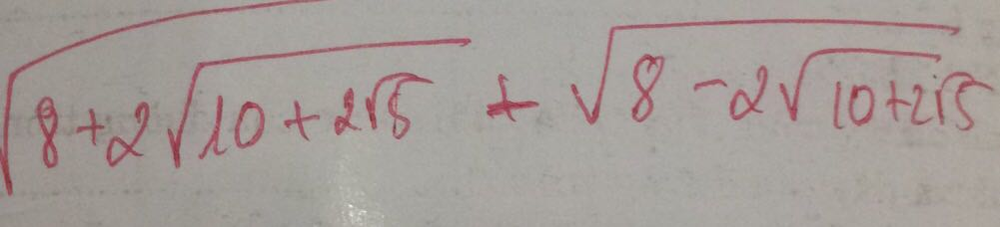

-- Number of question_words: 52


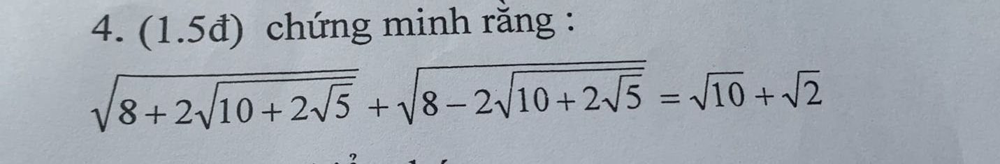

************

INDEX: 4 - Cosine score: 0.8078005127502437, SE_output: NEGATIVE
------------ Jaccard score: 0.55
-- Number of lookup_words: 40


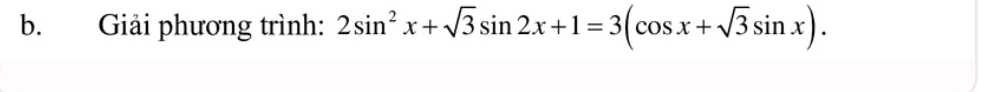

-- Number of question_words: 37


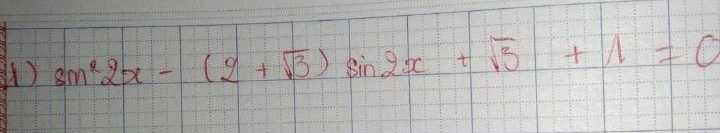

************

INDEX: 320 - Cosine score: 0.8024274535323754, SE_output: POSITIVE
------------ Jaccard score: 0.6470588235294118
-- Number of lookup_words: 44


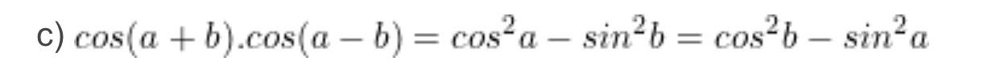

-- Number of question_words: 44


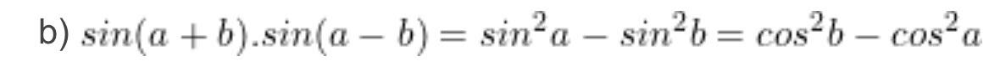

************

INDEX: 978 - Cosine score: 0.8024121756950977, SE_output: POSITIVE
------------ Jaccard score: 0.16666666666666666
-- Number of lookup_words: 34


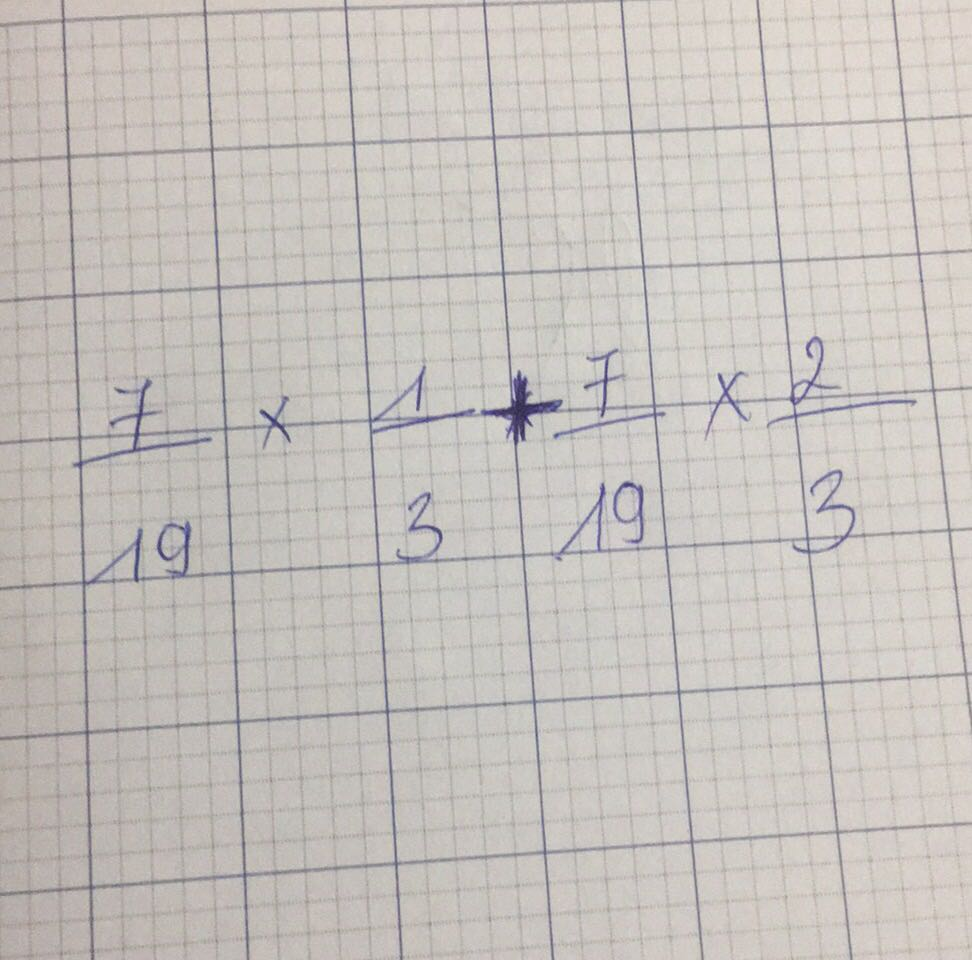

-- Number of question_words: 34


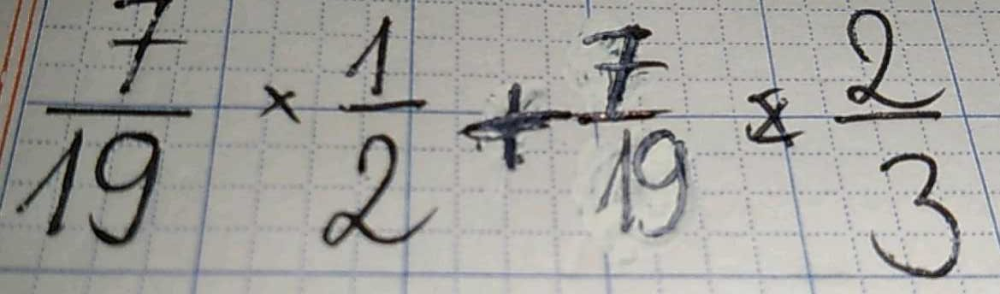

************

INDEX: 1510 - Cosine score: 0.8006368119706043, SE_output: NEGATIVE
------------ Jaccard score: 0.32608695652173914
-- Number of lookup_words: 79


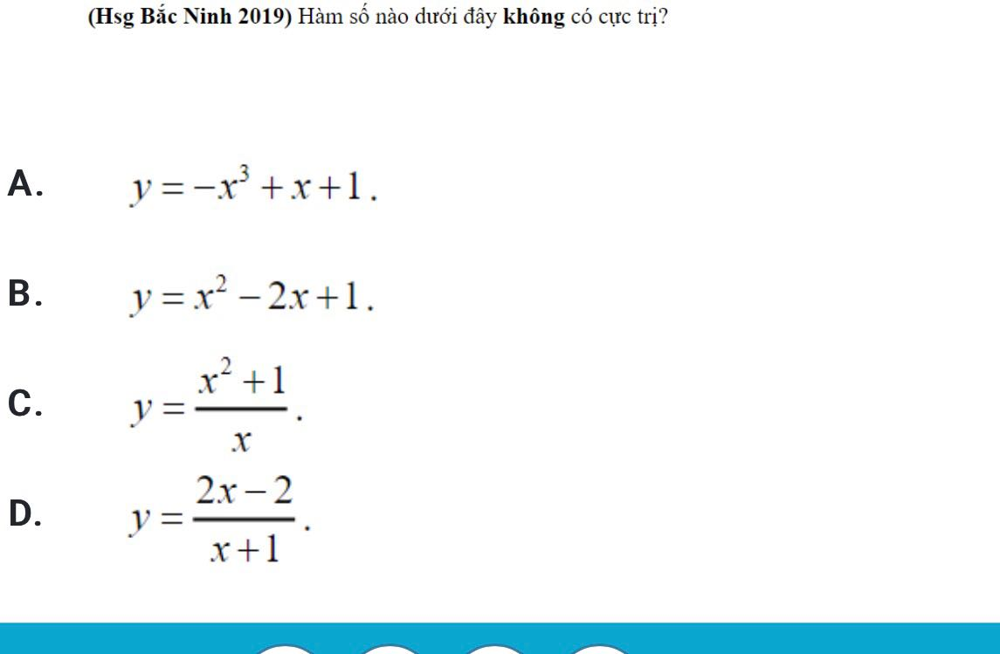

-- Number of question_words: 81


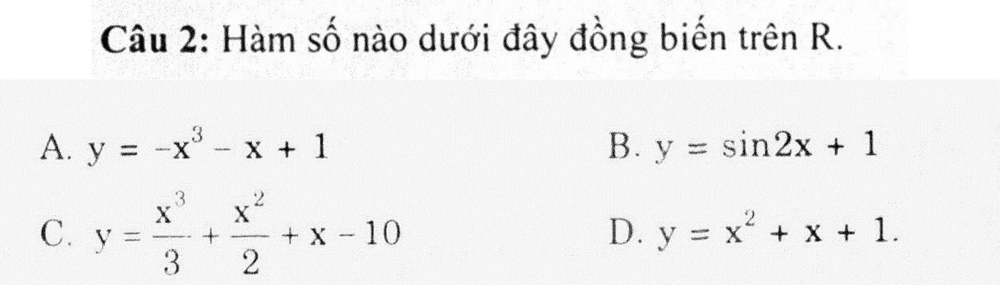

************



In [143]:
for index_ in df_check2.index:
    print('INDEX: {} - Cosine score: {}, SE_output: {}'.format(index_, df_check2.loc[index_]['cosine_plain2'],
                                                               df_check2.loc[index_]['Feedback Type']))
    print('------------ Jaccard score:', df_check2.loc[index_]['jc_plain2'])
    print('-- Number of lookup_words:', df_check2.loc[index_]['word_count_lookup'])
    img0 = Disp.Image(requests.get(df_check2.loc[index_]['Lookup Image']).content)
    display(img0)
    print('-- Number of question_words:', df_check2.loc[index_]['word_count_question'])
    img1 = Disp.Image(requests.get(df_check2.loc[index_]['Question Image']).content)
    display(img1)
    print('************')
    print()

In [86]:
df_check3 = df_neg.loc[df_neg['jc_plain2'] >= 0.8]
df_check3 = df_check3.sort_values('jc_plain2', ascending = False)
df_check3.shape

(8, 27)

INDEX: 276 - Jaccard score: 0.8333333333333334, SE_ouput: POSITIVE
------------ Cosine score: 0.8301801614431895
-- Number of lookup_words: 79


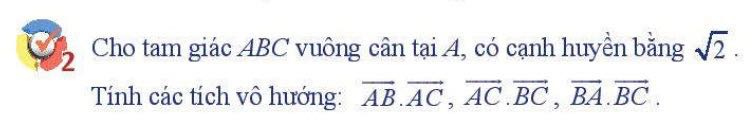

-- Number of question_words: 89


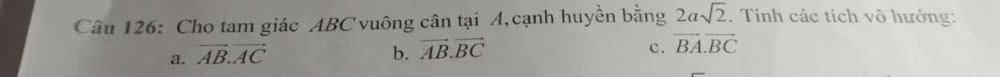

************

INDEX: 1007 - Jaccard score: 0.8181818181818182, SE_ouput: POSITIVE
------------ Cosine score: 0.0
-- Number of lookup_words: 22


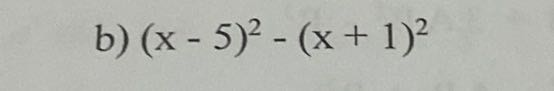

-- Number of question_words: 33


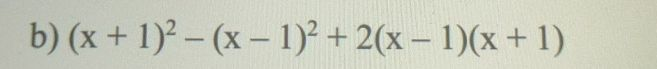

************

INDEX: 1720 - Jaccard score: 0.8181818181818182, SE_ouput: POSITIVE
------------ Cosine score: 0.9661801752981118
-- Number of lookup_words: 49


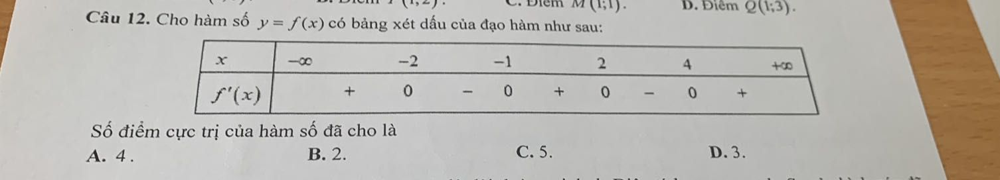

-- Number of question_words: 49


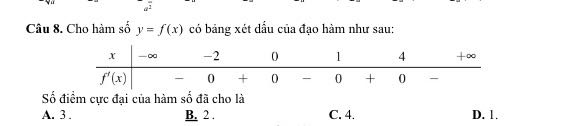

************

INDEX: 1854 - Jaccard score: 0.8181818181818182, SE_ouput: POSITIVE
------------ Cosine score: 0.0
-- Number of lookup_words: 15


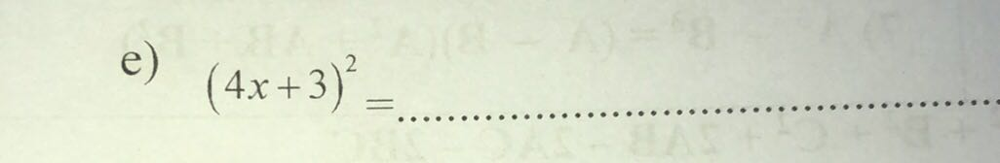

-- Number of question_words: 25


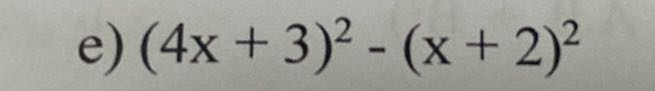

************

INDEX: 1145 - Jaccard score: 0.8125, SE_ouput: POSITIVE
------------ Cosine score: 0.4928734170833542
-- Number of lookup_words: 24


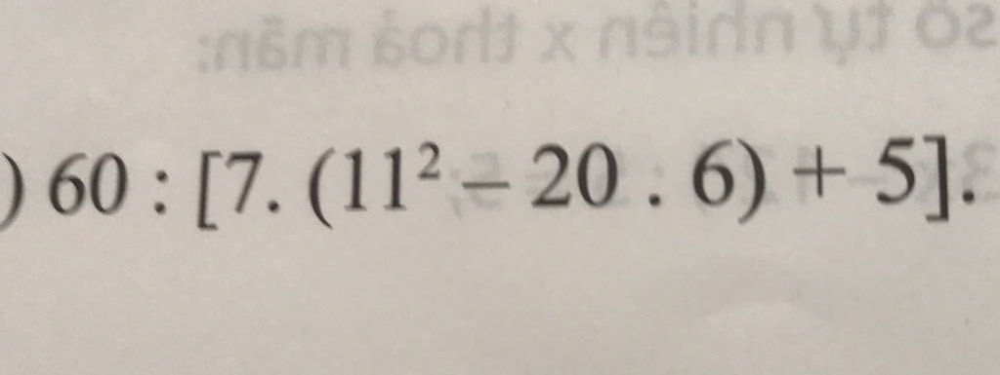

-- Number of question_words: 25


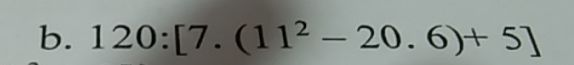

************

INDEX: 491 - Jaccard score: 0.8, SE_ouput: POSITIVE
------------ Cosine score: 0.9478534318588357
-- Number of lookup_words: 103


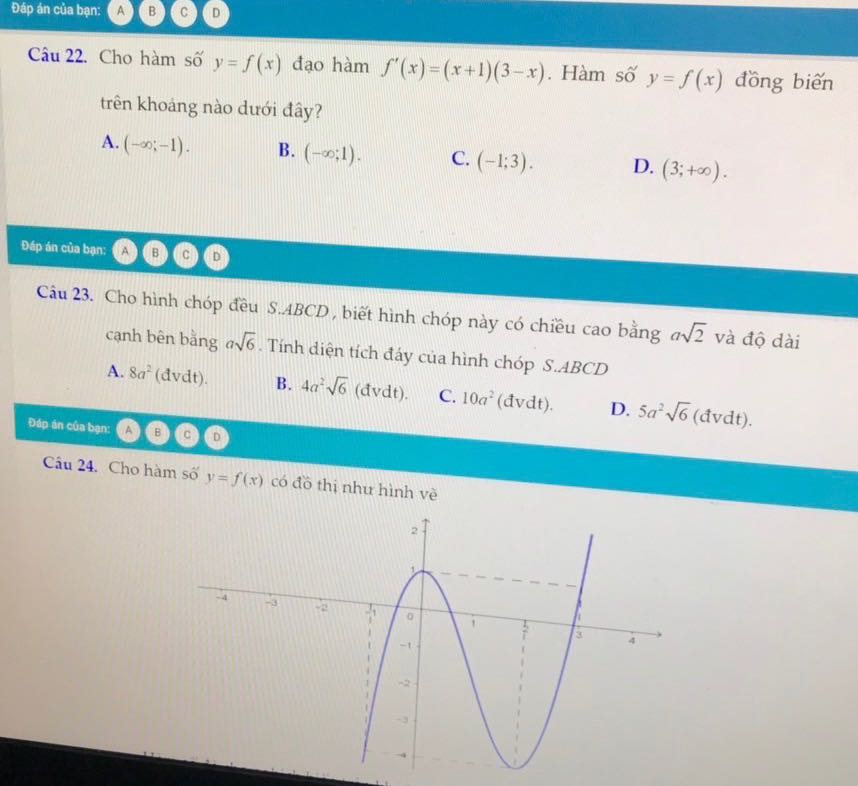

-- Number of question_words: 109


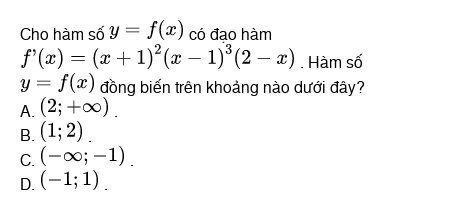

************

INDEX: 699 - Jaccard score: 0.8, SE_ouput: POSITIVE
------------ Cosine score: 0.8679159738248566
-- Number of lookup_words: 24


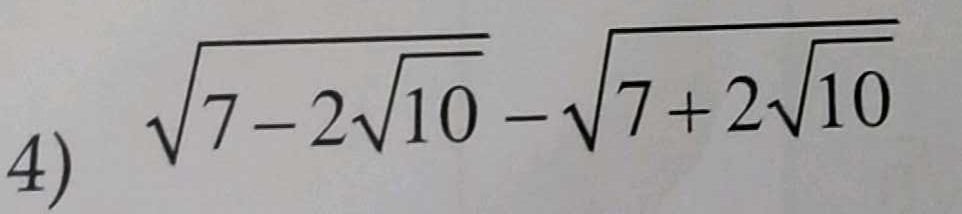

-- Number of question_words: 26


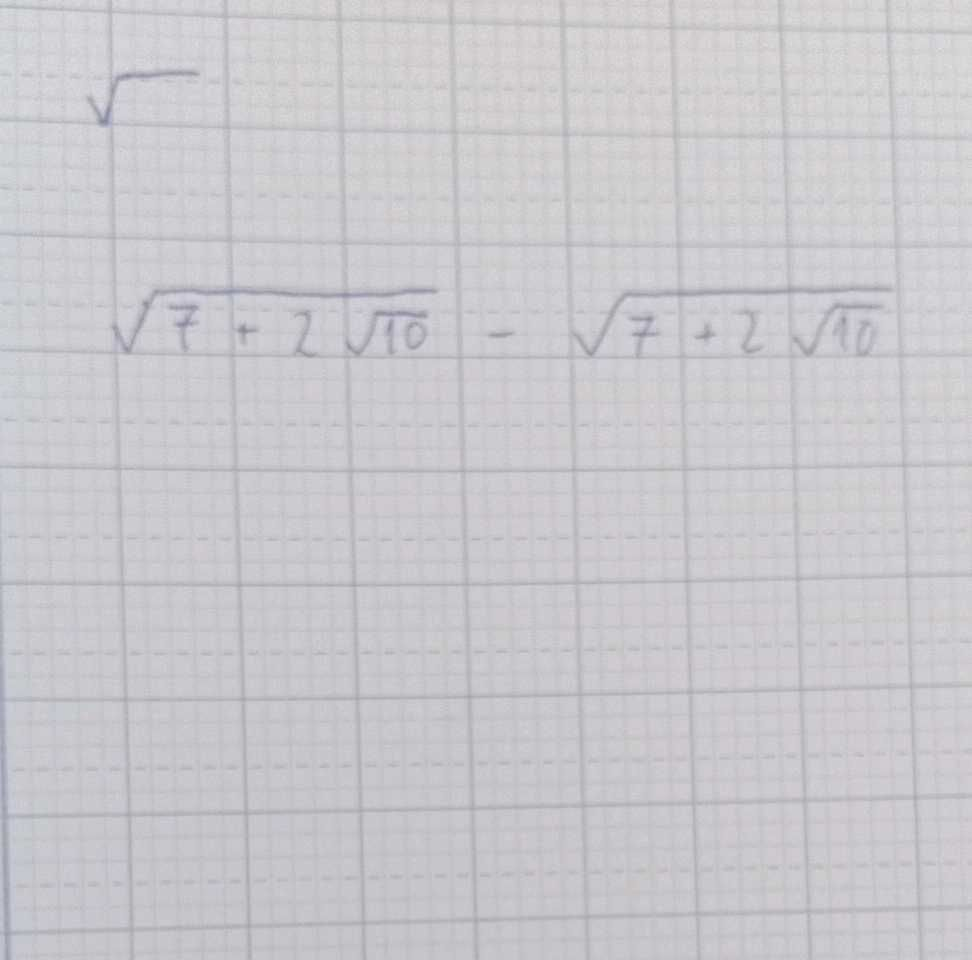

************

INDEX: 1362 - Jaccard score: 0.8, SE_ouput: POSITIVE
------------ Cosine score: 1.0
-- Number of lookup_words: 24


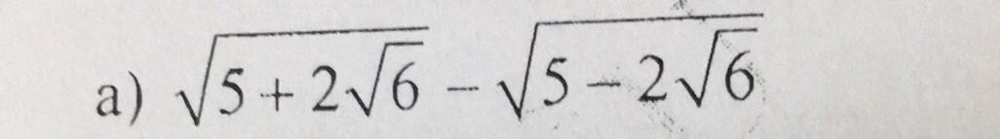

-- Number of question_words: 20


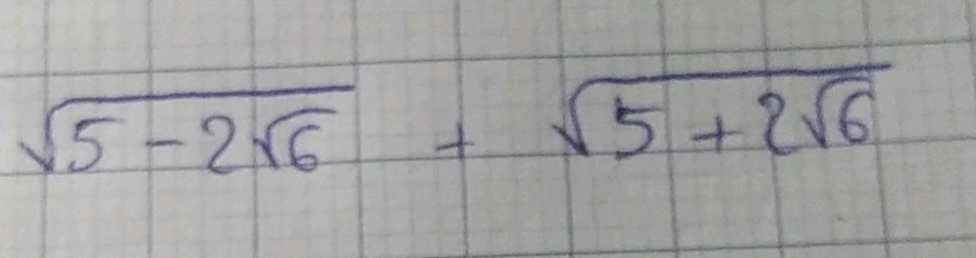

************



In [139]:
for index_ in df_check3.index:
    print('INDEX: {} - Jaccard score: {}, SE_ouput: {}'.format(index_, df_check3.loc[index_]['jc_plain2'],
                                                               df_check3.loc[index_]['Feedback Type']))
    print('------------ Cosine score:', df_check3.loc[index_]['cosine_plain2'])
    print('-- Number of lookup_words:', df_check3.loc[index_]['word_count_lookup'])
    img0 = Disp.Image(requests.get(df_check3.loc[index_]['Lookup Image']).content)
    display(img0)
    print('-- Number of question_words:', df_check3.loc[index_]['word_count_question'])
    img1 = Disp.Image(requests.get(df_check3.loc[index_]['Question Image']).content)
    display(img1)
    print('************')
    print()

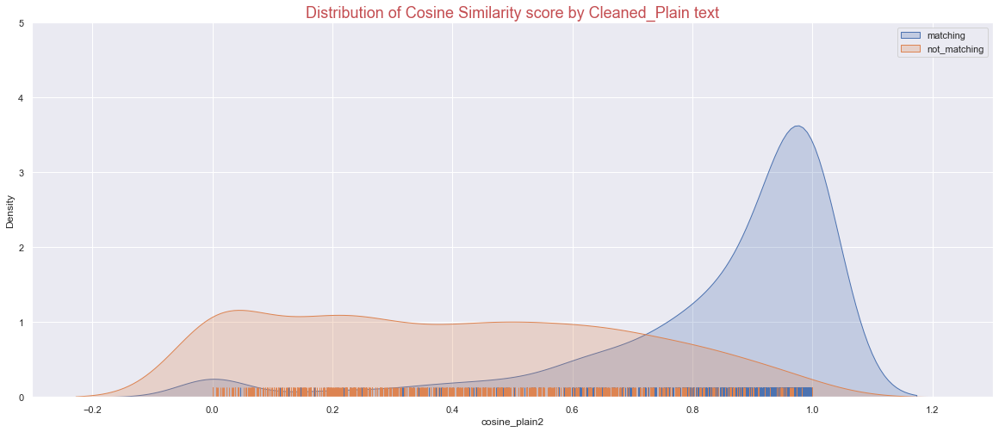

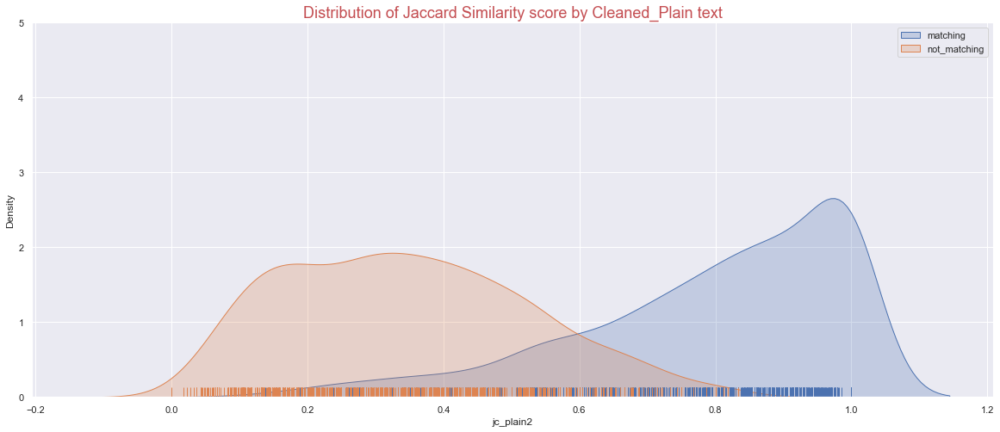

In [90]:
plt.figure(figsize=(20, 8))
sb.distplot(df_pos.cosine_plain2, hist = False, rug = True, kde_kws={'shade':'kde_kws'},label = 'matching')
sb.distplot(df_neg.cosine_plain2, hist = False, rug = True, kde_kws={'shade':'kde_kws'},label = 'not_matching')
plt.legend()
plt.ylim([0, 5])
plt.title('Distribution of Cosine Similarity score by Cleaned_Plain text', fontsize = 18, color = 'r')
plt.figure(figsize=(20, 8))
sb.distplot(df_pos.jc_plain2, hist = False, rug = True, kde_kws={'shade':'kde_kws'},label = 'matching')
sb.distplot(df_neg.jc_plain2, hist = False, rug = True, kde_kws={'shade':'kde_kws'},label = 'not_matching')
plt.legend()
plt.ylim([0, 5])
plt.title('Distribution of Jaccard Similarity score by Cleaned_Plain text', fontsize = 18, color = 'r');

In [99]:
print(df.loc[855]['jc_plain2'])
print(df.loc[855]['Lookup Text'])
print(df.loc[855]['Question Text'])
print()
print(df.loc[855]['clean_lookup'])
print(df.loc[855]['clean_question'])
print()
print(df.loc[855]['clean_lookup2'])
print(df.loc[855]['clean_question2'])
print()
print(df.loc[855]['lookup_plain'])
print(df.loc[855]['question_plain'])
print(df.loc[855]['jc_plain'])

0.5625
c) \( \sqrt{4 x-20}-\sqrt{x-5}-\frac{1}{3} \cdot \sqrt{9 x-45}=4 \)
a. \( \sqrt{4 x-20}-\frac{1}{3} \sqrt{9 x-45}+\sqrt{x-5}=4 \)

c ) \ ( \ sqrt { 4 x-20 } - \ sqrt { x-5 } - \ frac { 1 } { 3_}_\ cdot \ sqrt { 9 x-45 }_= 4_\ )
a ._\ ( \ sqrt { 4 x-20 } - \ frac { 1 } { 3_}_\ sqrt { 9 x-45 }_+_\ sqrt { x-5 }_= 4_\ )

c ) √ ( 4 x-20 ) - √ ( x-5 ) - 1/3_·_√ ( 9 x-45 ) = 4
a ._√ ( 4 x-20 ) - 1/3_√ ( 9 x-45 ) +_√ ( x-5 ) = 4

c) √(4 x-20)-√(x-5)-1/3·√(9 x-45)=4
a. √(4 x-20)-1/3√(9 x-45)+√(x-5)=4
0.14285714285714285


In [112]:
demo1 = 'c ) √ ( 4 x-20 ) + √ ( x-5 ) - 1/3_·_√ ( 9 x-45 ) = 4'
demo2 = 'a ._√ ( 4 x-20 ) - 1/3_√ ( 9 x-45 ) +_√ ( x-5 ) = 4'

In [104]:
def jc_score(q1, q2):
    words_doc1 = set(q1.lower().split()) 
    words_doc2 = set(q2.lower().split())

    # Find the intersection of words list of doc1 & doc2
    intersection = words_doc1.intersection(words_doc2)

    # Find the union of words list of doc1 & doc2
    union = words_doc1.union(words_doc2)

    # Calculate Jaccard similarity score 
    # using length of intersectioEm n set divided by length of union set
    jaccard_score = len(intersection) / len(union)
    return jaccard_score

In [105]:
jc = jc_score(demo1, demo2)
jc

0.5294117647058824

In [122]:
def clean_function1(text):  
    #lowercase
    text = text.lower()
#     text = re.sub("[^a-z0-9àáạảãâầấậẩẫăằắặẳẵèéẹẻẽêềếệểễòóọỏõôồốộổỗơờớợởỡìíịỉĩùúụủũưừứựửữỳýỵỷỹđ]",' ', text)
    text = re.sub("[\àáạảãâầấậẩẫăằắặẳẵèéẹẻẽêềếệểễòóọỏõôồốộổỗơờớợởỡìíịỉĩùúụủũưừứựửữỳýỵỷỹđ]",'', text)    
    
    #replace extra spaces with single space
    text = re.sub(' +', ' ',text)
    text = re.sub('_', ' ',text)
    #xoá khoảng trắng ở đầu và cuối mỗi câu
    text = text.strip()
    
    #word tokenzie
    text = word_tokenize(text, format='text')
    return text

In [120]:
demo1 = 'c ) √ ( 4 x-20 ) - √ ( x-5 ) - 1/3_·_√ ( 9 x-45 ) = 4'
demo2 = 'a ._√ ( 4 x-20 ) - 1/3_√ ( 9 x-45 ) +_√ ( x-5 ) = 4'
print(demo1)
print(demo2)
print()
demo1 = re.sub('_',' ', demo1)
demo2 = re.sub('_',' ', demo2)
print(demo1)
print(demo2)

c ) √ ( 4 x-20 ) - √ ( x-5 ) - 1/3_·_√ ( 9 x-45 ) = 4
a ._√ ( 4 x-20 ) - 1/3_√ ( 9 x-45 ) +_√ ( x-5 ) = 4

c ) √ ( 4 x-20 ) - √ ( x-5 ) - 1/3 · √ ( 9 x-45 ) = 4
a . √ ( 4 x-20 ) - 1/3 √ ( 9 x-45 ) + √ ( x-5 ) = 4


In [121]:
jc = jc_score(demo1, demo2)
jc

0.6875

In [136]:
idx = 1007
print('Cosine:', df.loc[idx]['cosine_plain2'])
print('Jaccard:', df.loc[idx]['jc_plain2'])
print(df.loc[idx]['Lookup Text'])
print(df.loc[idx]['Question Text'])
print()
print(df.loc[idx]['clean_lookup'])
print(df.loc[idx]['clean_question'])
print()
print(df.loc[idx]['clean_lookup2'])
print(df.loc[idx]['clean_question2'])
print()
print(df.loc[idx]['lookup_plain'])
print(df.loc[idx]['question_plain'])
print(df.loc[idx]['jc_plain'])

Cosine: 0.0
Jaccard: 0.8181818181818182
b) \( (x-5)^{2}-(x+1)^{2} \)
b) \( (x+1)^{2}-(x-1)^{2}+2(x-1)(x+1) \)

b ) \ ( ( x-5 ) ^ { 2 } - ( x + 1 ) ^ { 2 }_\ )
b ) \ ( ( x + 1 ) ^ { 2 } - ( x-1 ) ^ { 2 } + 2 ( x-1 ) ( x + 1 ) \ )

b ) ( x-5 ) ^ 2 - ( x + 1 ) ^ 2
b ) ( x + 1 ) ^ 2 - ( x-1 ) ^ 2 + 2 ( x-1 ) ( x + 1 )

b) (x-5)^2-(x+1)^2
b) (x+1)^2-(x-1)^2+2(x-1)(x+1)
0.3333333333333333


In [131]:
demo3 = df.loc[idx]['lookup_plain']
demo4 = df.loc[idx]['question_plain']
print(demo3)
print(demo4)
print()
demo3 = re.sub('_',' ', demo3)
demo4 = re.sub('_',' ', demo4)
print(demo3)
print(demo4)

jc = jc_score(demo3, demo4)
jc

a) √(5+2 √(6))-√(5-2 √(6))
√(5-2 √(6))+√(5+2 √(6))

a) √(5+2 √(6))-√(5-2 √(6))
√(5-2 √(6))+√(5+2 √(6))


0.16666666666666666